# Unlocking Housing Insights  
### A Workbook Supporting the Exploratory Analysis of the Ames Housing Dataset

**Prepared by:** Rebecca Stalley-Moores  
**Date:** 17/06/2025

---

This workbook contains the full exploratory data analysis (EDA), data cleaning, feature engineering, and hypothesis testing conducted on the Ames Housing Dataset. It serves as a companion to the formal report, providing detailed code, visualizations, and intermediate steps used to derive the insights summarized in the report.

In [3]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For setting up visuals
%matplotlib inline
sns.set(style="whitegrid")

In [4]:
# Load the dataset
df = pd.read_csv('AmesHousing.csv')


### 1. Data Summary

#### 1.1 Size of Dataset

In [5]:
df.shape

(2930, 82)

The dataset has 82 columns and 2930 rows

#### 1.2 Description of variables

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

In [7]:
df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


#### 1.3 identify Possible Target Variables

In [8]:
df[['SalePrice']].describe()

,SalePrice
count,2930.000000
mean,180796.060068
std,79886.692357
min,12789.000000
25%,129500.000000
50%,160000.000000
75%,213500.000000
max,755000.000000


## 2. Data Cleaning and Feature Engineering

#### 2.1 Find and Replace Missing Values

In [9]:
# Find out which columns contain missing values
nulls = df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending = False)
print(nulls)
print(nulls.shape)


Pool QC           2917
Misc Feature      2824
Alley             2732
Fence             2358
Mas Vnr Type      1775
Fireplace Qu      1422
Lot Frontage       490
Garage Qual        159
Garage Cond        159
Garage Yr Blt      159
Garage Finish      159
Garage Type        157
Bsmt Exposure       83
BsmtFin Type 2      81
Bsmt Cond           80
Bsmt Qual           80
BsmtFin Type 1      80
Mas Vnr Area        23
Bsmt Full Bath       2
Bsmt Half Bath       2
BsmtFin SF 1         1
BsmtFin SF 2         1
Electrical           1
Total Bsmt SF        1
Bsmt Unf SF          1
Garage Area          1
Garage Cars          1
dtype: int64
(27,)


In [10]:
# Remove columns with > 1465 (50%) missing values
df.drop(["Pool QC", "Misc Feature", "Alley", "Fence", "Mas Vnr Type" ], axis=1, inplace=True)

# Check number of columns is now reduced to 77
df.shape

(2930, 77)

In [11]:
#Examine remaining null value columns and their dtypes
nulls = df.isnull().sum()[df.isnull().sum() > 0]
dtypes = df.dtypes

missing_info = pd.DataFrame({
    'Missing Values': nulls,
    'Data Type': dtypes[nulls.index]
}).sort_values(by='Missing Values', ascending=False)

missing_info


,Missing Values,Data Type
Fireplace Qu,1422,object
Lot Frontage,490,float64
Garage Finish,159,object
Garage Yr Blt,159,float64
Garage Cond,159,object
Garage Qual,159,object
Garage Type,157,object
Bsmt Exposure,83,object
BsmtFin Type 2,81,object
Bsmt Cond,80,object


In [12]:
# Lets look at the floats first
nulls = df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)

# Filter for columns that are float dtype
float_nulls = [col for col in nulls.index if df[col].dtype == 'float64']

print("Float columns with missing values:", float_nulls)

Float columns with missing values: ['Lot Frontage', 'Garage Yr Blt', 'Mas Vnr Area', 'Bsmt Half Bath', 'Bsmt Full Bath', 'Total Bsmt SF', 'BsmtFin SF 2', 'Bsmt Unf SF', 'BsmtFin SF 1', 'Garage Area', 'Garage Cars']


--- Lot Frontage ---
Unique values: [141.  80.  81.  93.  74.  78.  41.  43.  39.  60.  75.  63.  85.  47.
 152.  88. 140. 105.  65.  70.  26.  21.  53.  24. 102.  98.  83.  94.
  95.  90.  79. 100.  44. 110.  61.  36.  67. 108.  59.  92.  58.  56.
  73.  72.  84.  76.  50.  55.  68. 107.  25.  30.  57.  40.  77. 120.
 137.  87. 119.  64.  96.  71.  69.  52.  51.  54.  86. 124.  82.  38.
  48.  89.  66.  45.  35. 129.  31.  42.  28.  99. 104.  97. 103.  34.
 117. 149. 122.  62. 174. 106. 112.  32. 115. 128.  91.  33. 121. 144.
 130. 109. 150. 113. 125. 101.  46. 114. 135. 136.  37.  22. 313.  49.
 123. 160. 195. 118. 134. 182. 116. 138. 155. 126. 200. 168. 111. 131.
 153. 133.]
Number of unique values: 128


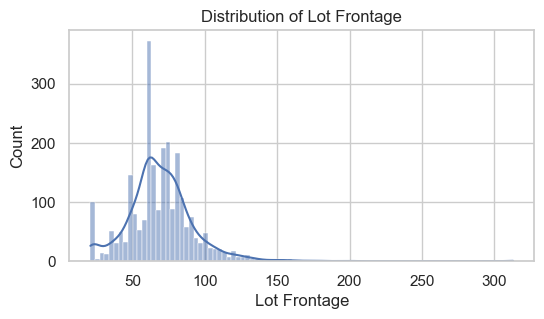

--- Garage Yr Blt ---
Unique values: [1960. 1961. 1958. 1968. 1997. 1998. 2001. 1992. 1995. 1999. 1993. 1990.
 1985. 2003. 1988. 2010. 1951. 1978. 1977. 1974. 2000. 1970. 1971. 1975.
 2009. 2008. 2005. 2004. 2002. 2006. 1996. 1994. 1980. 1979. 1984. 1986.
 1920. 1987. 1973. 1963. 1962. 1976. 1967. 1972. 1966. 1964. 1950. 1949.
 1954. 1955. 1959. 1957. 1956. 1952. 1953. 1989. 1948. 1900. 1927. 1915.
 1945. 1940. 1938. 1928. 1930. 1926. 1939. 1942. 1923. 1917. 1910. 1965.
 1969. 1947. 1946. 1941. 1924. 1922. 1896. 2007. 1983. 1981. 1991. 1982.
 1916. 1925. 1936. 1935. 1931. 1934. 1929. 1918. 1921. 1937. 1932. 1906.
 1908. 1895. 1933. 2207. 1914. 1943. 1919.]
Number of unique values: 103


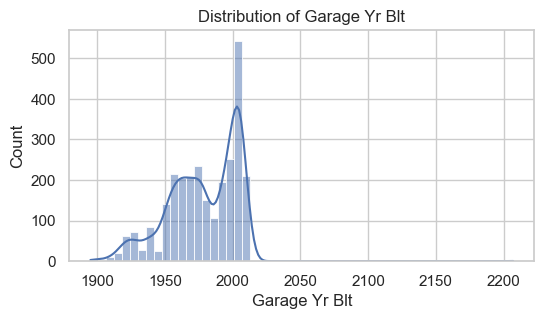

--- Mas Vnr Area ---
Unique values: [1.120e+02 0.000e+00 1.080e+02 2.000e+01 6.030e+02 3.500e+02 1.190e+02
 4.800e+02 8.100e+01 1.800e+02 5.040e+02 4.920e+02 3.810e+02 1.620e+02
 2.000e+02 4.500e+02 2.560e+02 2.260e+02 6.150e+02 2.400e+02 1.680e+02
 7.600e+02 1.280e+02 1.095e+03 2.320e+02 4.120e+02 1.780e+02 1.060e+02
 1.400e+01 1.600e+01 1.650e+02 1.140e+02 3.380e+02 3.620e+02 3.480e+02
 3.000e+01 5.790e+02 3.600e+01 1.220e+02 1.300e+02 3.100e+01 2.500e+02
 1.200e+02 2.160e+02 4.320e+02 1.159e+03 2.890e+02 2.800e+01 4.200e+01
 1.720e+02 4.510e+02 2.680e+02 8.600e+01 1.560e+02 1.440e+02 2.650e+02
 3.400e+02 1.100e+02 1.640e+02 3.610e+02 2.870e+02 5.060e+02 1.500e+02
 2.200e+02 3.240e+02 9.100e+01 1.040e+02 3.000e+02 2.610e+02 2.180e+02
 3.510e+02 7.710e+02 2.940e+02 9.000e+01 7.200e+01 4.700e+01 1.430e+02
 3.280e+02 2.880e+02 9.600e+01 3.360e+02 1.770e+02 8.500e+01 2.460e+02
 2.400e+01 8.000e+01 1.160e+02 1.530e+02 3.200e+02 4.790e+02 2.230e+02
 4.420e+02 1.700e+02 1.690e+02 1.710e+02 

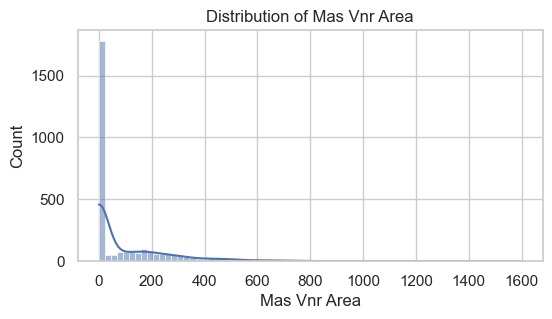

--- Bsmt Half Bath ---
Unique values: [0. 1. 2.]
Number of unique values: 3


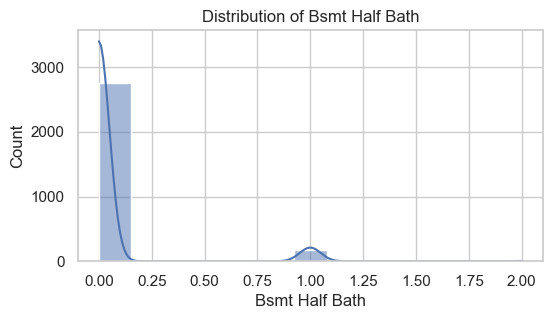

--- Bsmt Full Bath ---
Unique values: [1. 0. 2. 3.]
Number of unique values: 4


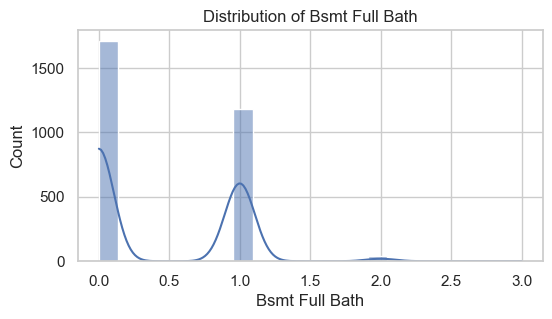

--- Total Bsmt SF ---
Unique values: [1080.  882. 1329. ... 1381.  757. 1003.]
Number of unique values: 1058


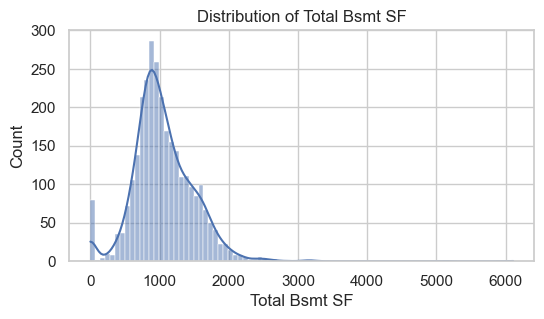

--- BsmtFin SF 2 ---
Unique values: [   0.  144. 1120.  163.  168.   78.  119.  121.  117.  859.  981.   42.
   46.   81. 1029.  290.  132.  713.  162.  362.  240.  258.  174.  906.
  486.  350.  263. 1073.  692.   12.  159.  712.  668.  474.  453.  684.
  387.  688.  972.  127.  252.  334.  232.  480.  590.  284.  276.  472.
  239.  180.  294.  622.  495.  539.  479.  113. 1526.  360.  774.  364.
  596.  884.  311.   92.  216.  136.   32.  147. 1127.  466.  630.  201.
  345.  512.  230.  247.  661.  620.  202.  483.  750.  690.  105.   60.
  352.  102.   95.  465.   63.  262.  500.  670.  768.  393.  286.  450.
  177.  764.  344.   72.  243.  420.  210.  694.  875.  507.  435.  419.
  250.  116.  354.  820.  624.  273.   76.  270.  110.  288.  411.  228.
  186.  449.   48.   93.  438.  613.  852.  555.  841.  799.  811.  842.
  382.  182.  456.   80.   64.  336.  306.  308.  374.  872.  108.   52.
  196.  128.  488.  319.  532.  106.  169.  608.   41.  606.  645.  492.
  181.  956. 10

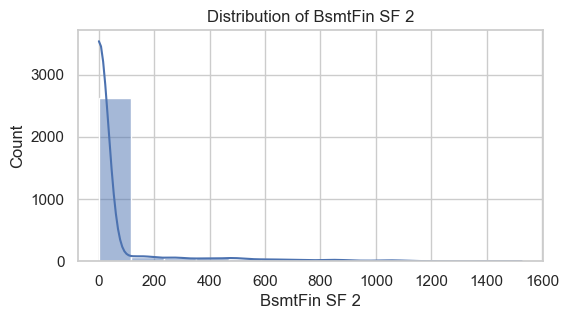

--- Bsmt Unf SF ---
Unique values: [ 441.  270.  406. ...   45. 1503.  239.]
Number of unique values: 1137


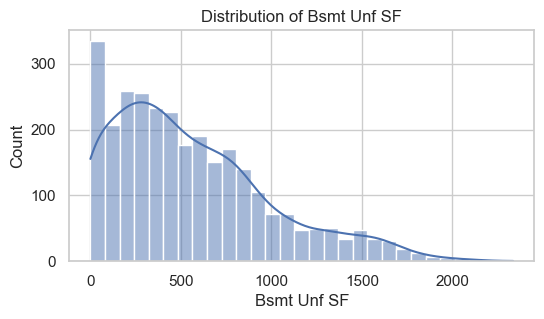

--- BsmtFin SF 1 ---
Unique values: [6.390e+02 4.680e+02 9.230e+02 1.065e+03 7.910e+02 6.020e+02 6.160e+02
 2.630e+02 1.180e+03 0.000e+00 9.350e+02 6.370e+02 3.680e+02 1.416e+03
 4.270e+02 1.445e+03 1.200e+02 7.900e+02 7.050e+02 8.850e+02 5.330e+02
 5.780e+02 7.340e+02 7.750e+02 8.040e+02 4.320e+02 1.051e+03 1.560e+02
 3.000e+02 3.600e+02 5.140e+02 3.110e+02 1.218e+03 1.646e+03 1.201e+03
 1.100e+02 2.800e+01 2.000e+00 2.188e+03 7.330e+02 1.373e+03 4.560e+02
 2.400e+01 1.600e+01 3.260e+02 6.250e+02 2.500e+02 9.190e+02 1.032e+03
 5.240e+02 8.160e+02 1.078e+03 2.220e+02 1.414e+03 6.560e+02 6.950e+02
 5.430e+02 6.230e+02 4.020e+02 3.380e+02 8.990e+02 5.530e+02 4.500e+02
 8.240e+02 6.590e+02 1.260e+02 6.740e+02 1.129e+03 1.298e+03 2.800e+02
 3.760e+02 3.780e+02 4.660e+02 6.040e+02 2.440e+02 4.840e+02 7.280e+02
 1.052e+03 8.330e+02 5.060e+02 1.137e+03 1.200e+03 6.870e+02 3.940e+02
 9.820e+02 3.290e+02 6.980e+02 5.690e+02 1.059e+03 1.010e+03 1.014e+03
 7.630e+02 1.500e+03 4.900e+01 6.700e+02 

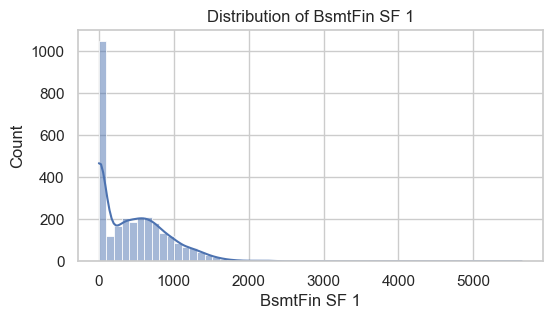

--- Garage Area ---
Unique values: [ 528.  730.  312.  522.  482.  470.  582.  506.  608.  442.  440.  420.
  393.  841.  492.  834.  400.  500.  546.  663.  480.  304.  525.    0.
  511.  264.  320.  308.  751.  772.  606.  868.  532.  678.  820.  484.
  958.  756.  576.  474.  430.  437.  433.  434.  779.  962.  527.  712.
  671.  486.  666.  880.  676.  614.  750.  618.  463.  462.  457.  476.
  429.  539.  336.  280.  260.  461.  564.  762.  713.  588.  496.  852.
  592.  475.  596.  535.  660.  441.  490.  504.  517.  240.  364.  244.
  315.  578.  620.  447.  294.  531.  263.  318.  305.  246.  392.  330.
  720.  360.  551.  379.  220.  780.  288.  416.  624.  923.  560.  363.
  200.  572.  180.  516.  672.  349.  365.  231.  450.  270.  299.  591.
  533.  690.  436.  586.  366.  467.  209.  460. 1017.  574.  776.  632.
  740.  615.  594.  580.  513.  523.  850.  670.  613.  621.  598.  502.
  494.  319.  352.  216.  399.  252.  567.  473.  625.  384.  741.  573.
  888.  520.  68

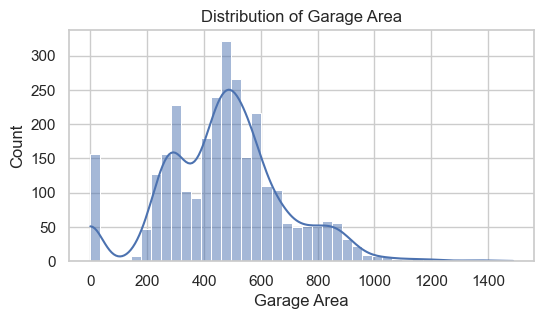

--- Garage Cars ---
Unique values: [2. 1. 3. 0. 4. 5.]
Number of unique values: 6


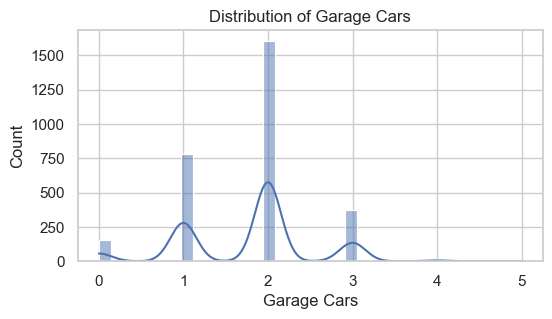

In [13]:
# For each float column, check unique values and plot distribution
for col in float_nulls:
    print(f"--- {col} ---")
    print("Unique values:", df[col].dropna().unique())  # show first 10 unique values
    print("Number of unique values:", df[col].nunique())
    
    # Plot distribution
    plt.figure(figsize=(6,3))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()


In [14]:
# Lets look at discrete numeric counts first
df[['Bsmt Half Bath', 'Bsmt Full Bath', 'Garage Cars']].isnull().sum()

Bsmt Half Bath    2
Bsmt Full Bath    2
Garage Cars       1
dtype: int64

In [15]:
# These could be null values simply because there is no basement or garage
# Impute Bsmt Full Bath = 0 if no basement
df.loc[df['Total Bsmt SF'] == 0.0, 'Bsmt Full Bath'] = 0.0

# Then fill the rest with median
df['Bsmt Full Bath'].fillna(df['Bsmt Full Bath'].median(), inplace=True)

df.loc[df['Total Bsmt SF'] == 0.0, 'Bsmt Half Bath'] = 0.0
df['Bsmt Half Bath'].fillna(df['Bsmt Half Bath'].median(), inplace=True)

df.loc[df['Garage Area'] == 0.0, 'Garage Cars'] = 0.0
df['Garage Cars'].fillna(df['Garage Cars'].median(), inplace=True)

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\449339999.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Bsmt Full Bath'].fillna(df['Bsmt Full Bath'].median(), inplace=True)
C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\449339999.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always beh

In [16]:
#check discrete numeric count null values have been resolved
df[['Bsmt Half Bath', 'Bsmt Full Bath', 'Garage Cars']].isnull().sum()

Bsmt Half Bath    0
Bsmt Full Bath    0
Garage Cars       0
dtype: int64

In [17]:
# For the remaining features the null value likely means that there is no garage, hence the null value for 'Garage Area'
# We can inspect against related columns to try to confirm this
# Check Garage Yr Blt null rows: are Garage Area and Garage Cars zero or null?
garage_null = df[df['Garage Yr Blt'].isnull()]
print("Garage Yr Blt NULL rows info:")
print(garage_null[['Garage Area', 'Garage Cars']].describe())
print("\nSample rows:")
print(garage_null[['Garage Area', 'Garage Cars']].head(), "\n")

# Check Mas Vnr Area null rows: is it zero or something else?
mas_vnr_null = df[df['Mas Vnr Area'].isnull()]
print("Mas Vnr Area NULL rows info:")
print(mas_vnr_null[['Mas Vnr Area']].describe())
print("\nSample rows:")
print(mas_vnr_null[['Mas Vnr Area']].head(), "\n")

# Check Total Bsmt SF null rows: what are the basement bath counts and basement areas?
bsmt_null = df[df['Total Bsmt SF'].isnull()]
print("Total Bsmt SF NULL rows info:")
print(bsmt_null[['Bsmt Full Bath', 'Bsmt Half Bath', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF']].describe())
print("\nSample rows:")
print(bsmt_null[['Bsmt Full Bath', 'Bsmt Half Bath', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF']].head(), "\n")

# Check BsmtFin SF 2 null rows: related basement features
bsmtfin2_null = df[df['BsmtFin SF 2'].isnull()]
print("BsmtFin SF 2 NULL rows info:")
print(bsmtfin2_null[['Total Bsmt SF', 'BsmtFin SF 1', 'Bsmt Unf SF']].describe())
print("\nSample rows:")
print(bsmtfin2_null[['Total Bsmt SF', 'BsmtFin SF 1', 'Bsmt Unf SF']].head(), "\n")

# Check Bsmt Unf SF null rows:
bsmtunf_null = df[df['Bsmt Unf SF'].isnull()]
print("Bsmt Unf SF NULL rows info:")
print(bsmtunf_null[['Total Bsmt SF', 'BsmtFin SF 1', 'BsmtFin SF 2']].describe())
print("\nSample rows:")
print(bsmtunf_null[['Total Bsmt SF', 'BsmtFin SF 1', 'BsmtFin SF 2']].head(), "\n")

# Check Garage Area null rows:
garage_area_null = df[df['Garage Area'].isnull()]
print("Garage Area NULL rows info:")
print(garage_area_null[['Garage Cars', 'Garage Yr Blt']].describe())
print("\nSample rows:")
print(garage_area_null[['Garage Cars', 'Garage Yr Blt']].head(), "\n")

# Check Lot Frontage null rows: see if there is a pattern or related features to check
lot_frontage_null = df[df['Lot Frontage'].isnull()]
print("Lot Frontage NULL rows info:")
print(lot_frontage_null.describe(include='all'))
print("\nSample rows:")
print(lot_frontage_null.head(), "\n")


Garage Yr Blt NULL rows info:
       Garage Area  Garage Cars
count   158.000000   159.000000
mean      2.278481     0.018868
std      28.640062     0.176882
min       0.000000     0.000000
25%       0.000000     0.000000
50%       0.000000     0.000000
75%       0.000000     0.000000
max     360.000000     2.000000

Sample rows:
     Garage Area  Garage Cars
27           0.0          0.0
119          0.0          0.0
125          0.0          0.0
129          0.0          0.0
130          0.0          0.0 

Mas Vnr Area NULL rows info:
       Mas Vnr Area
count           0.0
mean            NaN
std             NaN
min             NaN
25%             NaN
50%             NaN
75%             NaN
max             NaN

Sample rows:
     Mas Vnr Area
55            NaN
484           NaN
517           NaN
538           NaN
867           NaN 

Total Bsmt SF NULL rows info:
       Bsmt Full Bath  Bsmt Half Bath  BsmtFin SF 1  BsmtFin SF 2  Bsmt Unf SF
count             1.0             1.0       

In [18]:
# Lot Frontage appears to have genuine missing data whereas the remainder appear to be null because the feature doesn't exist
# 1. Columns where NULL means "feature doesn't exist" — fill with 0 or suitable default:

# Basement-related features:
bsmt_cols = [
    'Total Bsmt SF', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF'
]

for col in bsmt_cols:
    df[col].fillna(0, inplace=True)

# Garage-related features:
garage_cols = ['Garage Yr Blt', 'Garage Area']
# Garage Year Built — replace null with 0 or a special indicator like 0 to mean 'No Garage'
df['Garage Yr Blt'].fillna(0, inplace=True)
df['Garage Area'].fillna(0, inplace=True)

# Masonry veneer area — fill NaN with 0 (no veneer)
df['Mas Vnr Area'].fillna(0, inplace=True)

# 2. Lot Frontage — actual missing data, so use median overall here.
median_lot_frontage = df['Lot Frontage'].median()
df['Lot Frontage'].fillna(median_lot_frontage, inplace=True)


C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2004404272.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(0, inplace=True)
C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2004404272.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when do

In [19]:
# Check float nulls have been removed
nulls = df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)

# Filter for columns that are float dtype
float_nulls = [col for col in nulls.index if df[col].dtype == 'float64']
float_nulls

[]

In [20]:
# Now lets look at categorical nulls
cat_nulls = [col for col in nulls.index if df[col].dtype == 'object']

print("Categorical columns with missing values:", cat_nulls)

Categorical columns with missing values: ['Fireplace Qu', 'Garage Cond', 'Garage Qual', 'Garage Finish', 'Garage Type', 'Bsmt Exposure', 'BsmtFin Type 2', 'Bsmt Cond', 'Bsmt Qual', 'BsmtFin Type 1', 'Electrical']


--- Fireplace Qu ---
Unique values: ['Gd' 'TA' 'Po' 'Ex' 'Fa']
Number of unique values: 5


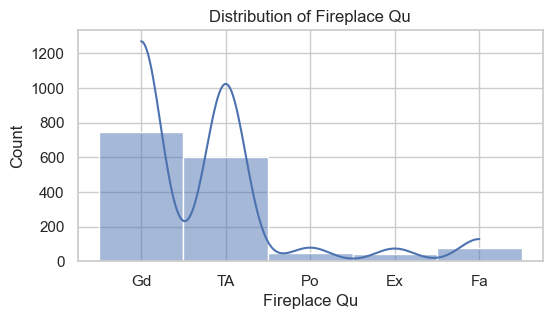

--- Garage Cond ---
Unique values: ['TA' 'Fa' 'Gd' 'Ex' 'Po']
Number of unique values: 5


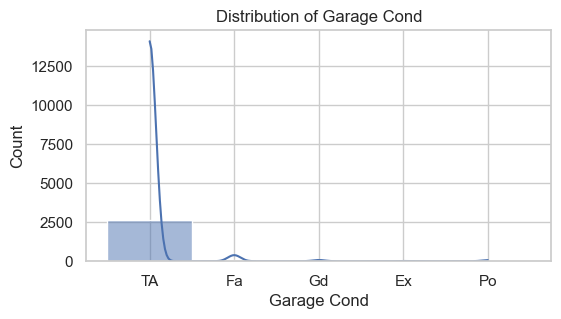

--- Garage Qual ---
Unique values: ['TA' 'Fa' 'Gd' 'Ex' 'Po']
Number of unique values: 5


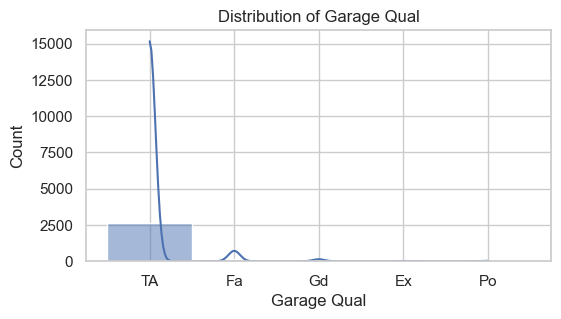

--- Garage Finish ---
Unique values: ['Fin' 'Unf' 'RFn']
Number of unique values: 3


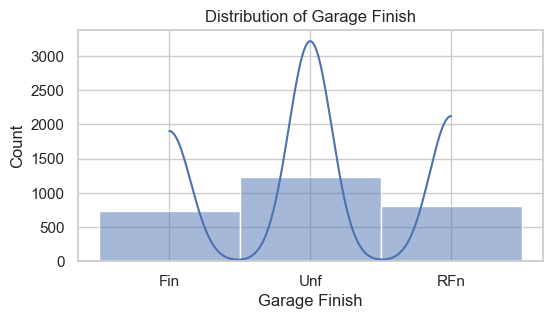

--- Garage Type ---
Unique values: ['Attchd' 'BuiltIn' 'Basment' 'Detchd' 'CarPort' '2Types']
Number of unique values: 6


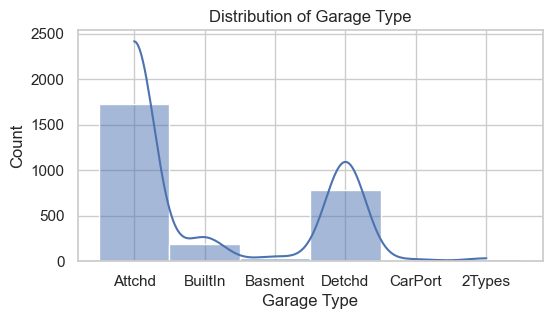

--- Bsmt Exposure ---
Unique values: ['Gd' 'No' 'Mn' 'Av']
Number of unique values: 4


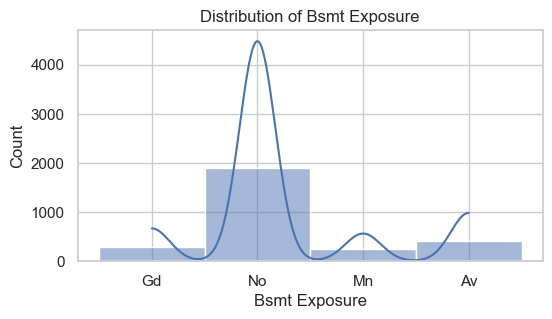

--- BsmtFin Type 2 ---
Unique values: ['Unf' 'LwQ' 'BLQ' 'Rec' 'GLQ' 'ALQ']
Number of unique values: 6


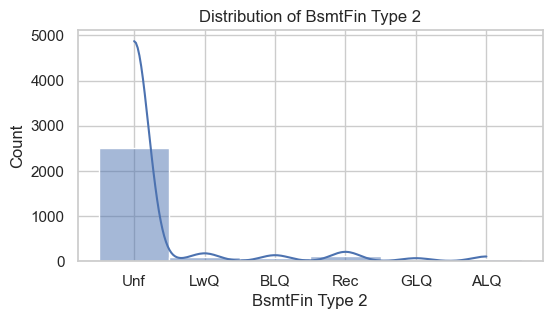

--- Bsmt Cond ---
Unique values: ['Gd' 'TA' 'Po' 'Fa' 'Ex']
Number of unique values: 5


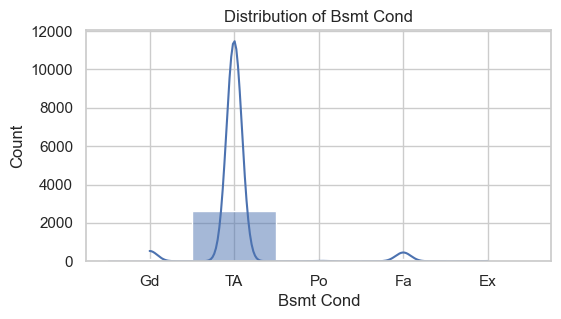

--- Bsmt Qual ---
Unique values: ['TA' 'Gd' 'Ex' 'Fa' 'Po']
Number of unique values: 5


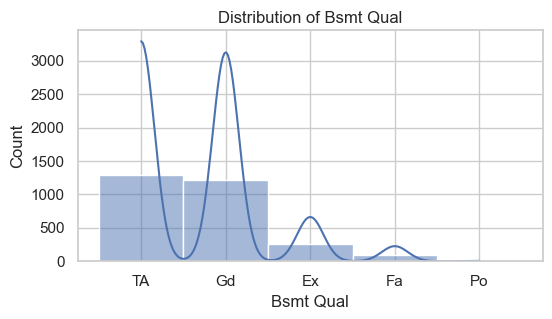

--- BsmtFin Type 1 ---
Unique values: ['BLQ' 'Rec' 'ALQ' 'GLQ' 'Unf' 'LwQ']
Number of unique values: 6


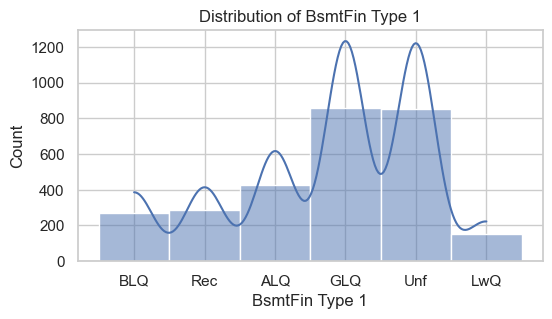

--- Electrical ---
Unique values: ['SBrkr' 'FuseA' 'FuseF' 'FuseP' 'Mix']
Number of unique values: 5


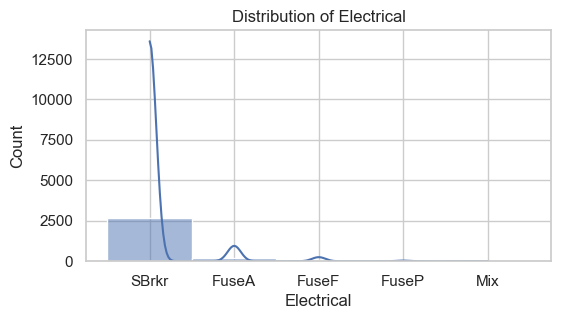

In [21]:
# For each categorical column, check unique values and plot distribution
for col in cat_nulls:
    print(f"--- {col} ---")
    print("Unique values:", df[col].dropna().unique())  # show first 10 unique values
    print("Number of unique values:", df[col].nunique())
    
    # Plot distribution
    plt.figure(figsize=(6,3))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

In [22]:
# The above suggest that for all features apart from Electrical, missing data implies the feature doesn't exist
# lets check this before imputing
none_fill_map = {
    'Fireplace Qu': df['Fireplaces'] == 0,
    'Garage Type': (df['Garage Area'] == 0) & (df['Garage Cars'] == 0),
    'Garage Finish': (df['Garage Area'] == 0) & (df['Garage Cars'] == 0),
    'Garage Qual': (df['Garage Area'] == 0) & (df['Garage Cars'] == 0),
    'Garage Cond': (df['Garage Area'] == 0) & (df['Garage Cars'] == 0),
    'Bsmt Exposure': df['Total Bsmt SF'] == 0,
    'BsmtFin Type 1': df['Total Bsmt SF'] == 0,
    'BsmtFin Type 2': df['Total Bsmt SF'] == 0,
    'Bsmt Qual': df['Total Bsmt SF'] == 0,
    'Bsmt Cond': df['Total Bsmt SF'] == 0,
}

# Fill 'None' where the missing is due to absence of the feature
for col, condition in none_fill_map.items():
    df.loc[condition & df[col].isnull(), col] = 'None'

# Now double-check and fill any remaining NaNs in these columns just in case
for col in none_fill_map.keys():
    df[col].fillna('None', inplace=True)

# Fill Electrical with mode (likely just missing info)
df['Electrical'].fillna(df['Electrical'].mode()[0], inplace=True)


C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\3949230565.py:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna('None', inplace=True)
C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\3949230565.py:25: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

In [23]:
# Check categorical nulls have been removed
nulls = df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)
nulls


Series([], dtype: int64)

#### 2.2 Check Data Types

In [24]:
# Convert Discrete Numeric Counts to Integers
df["Bsmt Half Bath"] = df["Bsmt Half Bath"].astype(int)
df["Bsmt Full Bath"] = df["Bsmt Full Bath"].astype(int)
df["Garage Cars"] = df["Garage Cars"].astype(int)

In [25]:
df[["Bsmt Half Bath", "Bsmt Full Bath","Garage Cars"]].head()

,Bsmt Half Bath,Bsmt Full Bath,Garage Cars
0,0,1,2
1,0,0,1
2,0,0,1
3,0,1,2
4,0,0,2


#### 2.3 Check for duplicate rows

In [26]:
df['PID'].nunique()

2930

In [27]:
# Therefore no duplicated rows

#### 2.4 Check for Inconsistent Categorical Data

In [28]:
# Already checked above but to make sure:
cat_feats = df.select_dtypes(include='object')

#### 2.5 Check for Outliers in Numerical Data


            Order           PID  MS SubClass  Lot Frontage       Lot Area  \
count  2930.00000  2.930000e+03  2930.000000   2930.000000    2930.000000   
mean   1465.50000  7.144645e+08    57.387372     69.019795   10147.921843   
std     845.96247  1.887308e+08    42.638025     21.326422    7880.017759   
min       1.00000  5.263011e+08    20.000000     21.000000    1300.000000   
25%     733.25000  5.284770e+08    20.000000     60.000000    7440.250000   
50%    1465.50000  5.354536e+08    50.000000     68.000000    9436.500000   
75%    2197.75000  9.071811e+08    70.000000     78.000000   11555.250000   
max    2930.00000  1.007100e+09   190.000000    313.000000  215245.000000   

       Overall Qual  Overall Cond   Year Built  Year Remod/Add  Mas Vnr Area  \
count   2930.000000   2930.000000  2930.000000     2930.000000   2930.000000   
mean       6.094881      5.563140  1971.356314     1984.266553    101.096928   
std        1.411026      1.111537    30.245361       20.860286    

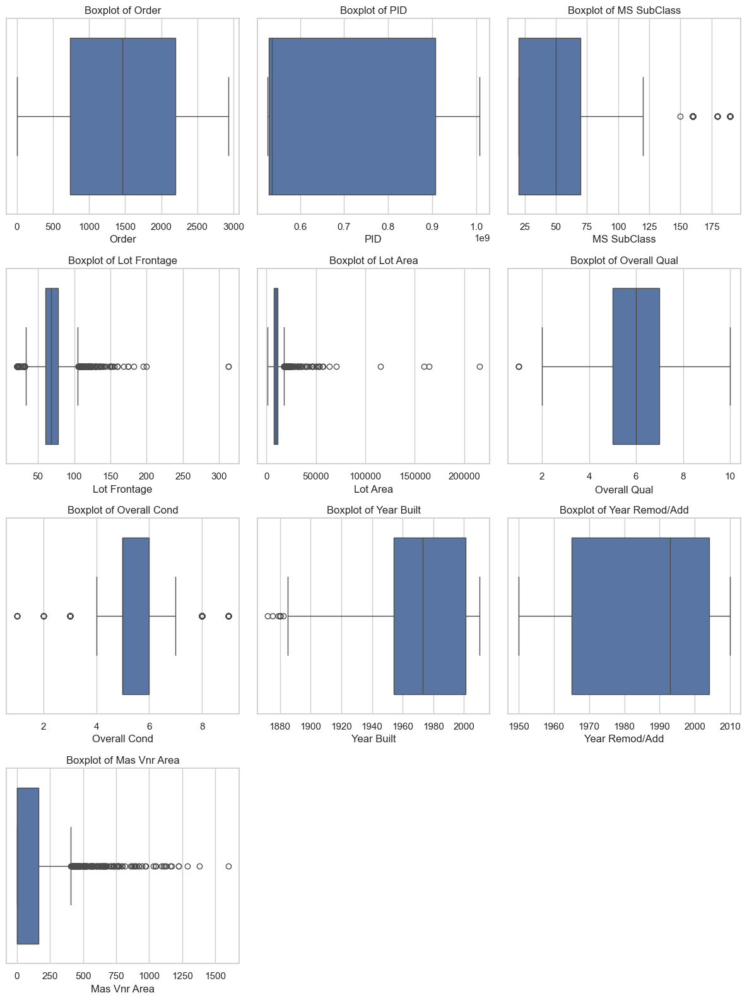

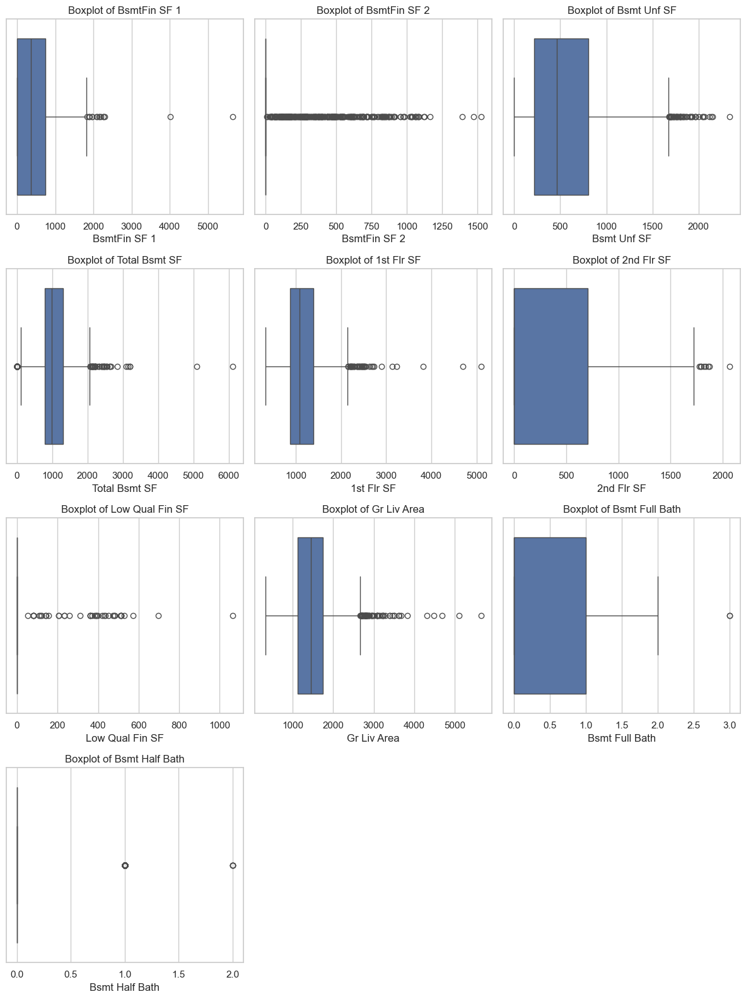

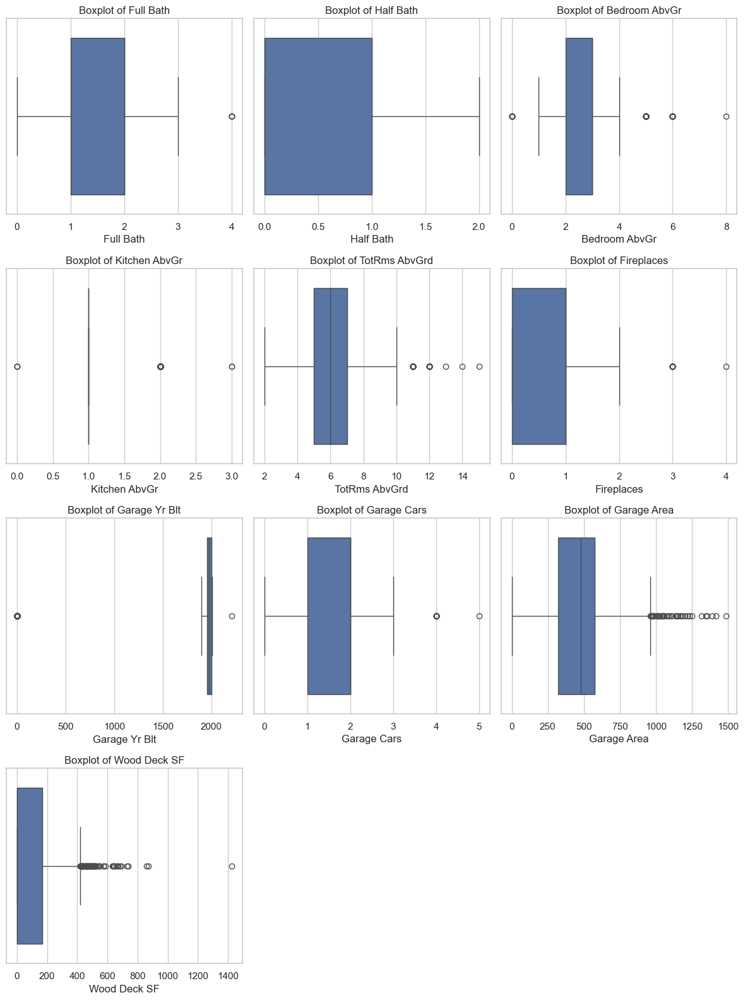

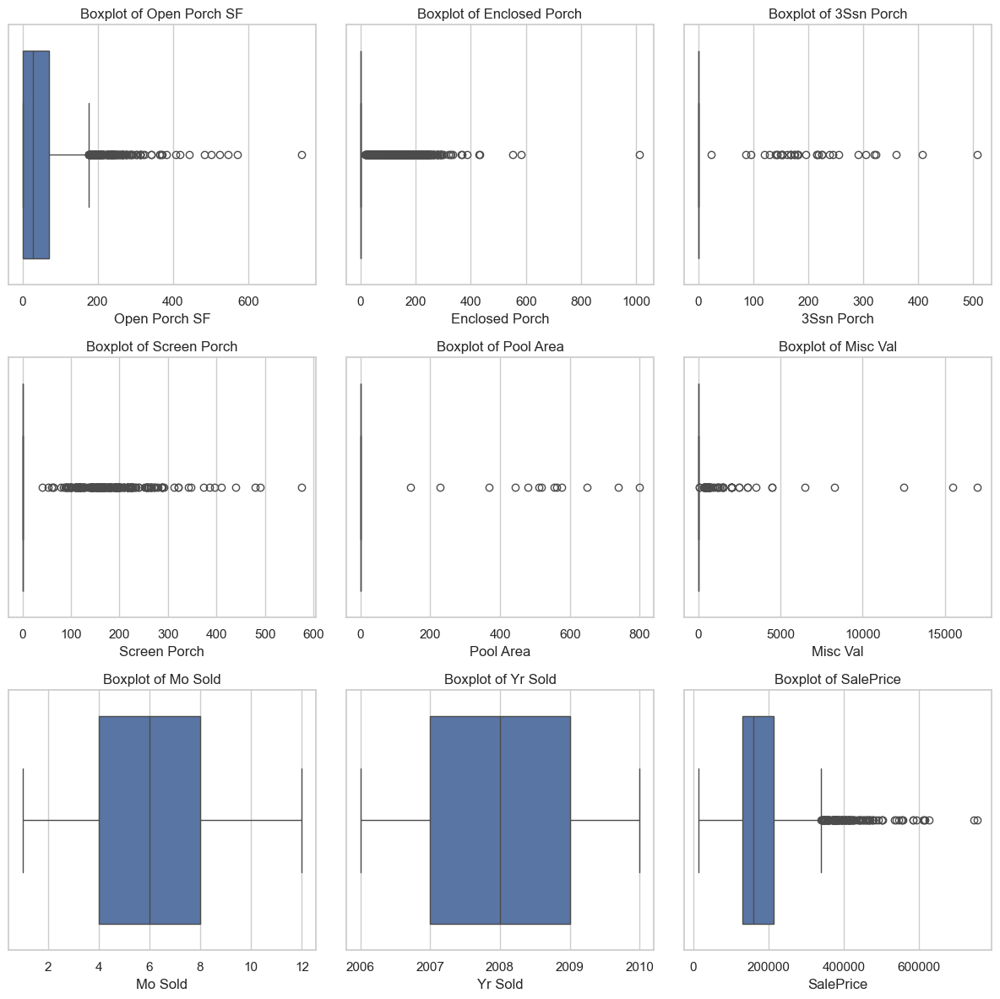

In [29]:
print(df.describe()) 
num_feats = df.select_dtypes(include='number')

batch_size = 10
n_cols = 3

num_feats = df.select_dtypes(include='number')
n_features = len(num_feats.columns)

for batch_start in range(0, n_features, batch_size):
    batch = num_feats.columns[batch_start:batch_start + batch_size]
    n = len(batch)
    n_rows = (n + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
    axes = axes.flatten()

    for i, feature in enumerate(batch):
        sns.boxplot(data=df, x=feature, ax=axes[i])
        axes[i].set_title(f'Boxplot of {feature}')
        axes[i].set_xlabel(feature)

    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()

    # Save the figure with batch index (starting from 1)
    batch_num = (batch_start // batch_size) + 1
    plt.savefig(f'boxplots_batch_{batch_num}.png')
    plt.show()



In [30]:
num_feats = df.select_dtypes(include='number').columns
skew_threshold = 1.0

log_transform_cols = []

for col in num_feats:
    skewness = df[col].skew()
    if skewness > skew_threshold:
        log_transform_cols.append(col)
        # Create new column with suffix '_log'
        df[col + '_log'] = np.log1p(df[col])

print("Log transformed columns saved as new features:")
print(log_transform_cols)



Log transformed columns saved as new features:
['MS SubClass', 'Lot Frontage', 'Lot Area', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Total Bsmt SF', '1st Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Half Bath', 'Kitchen AbvGr', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'SalePrice']


In [31]:
df.shape

(2930, 97)

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 97 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Order                2930 non-null   int64  
 1   PID                  2930 non-null   int64  
 2   MS SubClass          2930 non-null   int64  
 3   MS Zoning            2930 non-null   object 
 4   Lot Frontage         2930 non-null   float64
 5   Lot Area             2930 non-null   int64  
 6   Street               2930 non-null   object 
 7   Lot Shape            2930 non-null   object 
 8   Land Contour         2930 non-null   object 
 9   Utilities            2930 non-null   object 
 10  Lot Config           2930 non-null   object 
 11  Land Slope           2930 non-null   object 
 12  Neighborhood         2930 non-null   object 
 13  Condition 1          2930 non-null   object 
 14  Condition 2          2930 non-null   object 
 15  Bldg Type            2930 non-null   o

            Order           PID  MS SubClass  Lot Frontage       Lot Area  \
count  2930.00000  2.930000e+03  2930.000000   2930.000000    2930.000000   
mean   1465.50000  7.144645e+08    57.387372     69.019795   10147.921843   
std     845.96247  1.887308e+08    42.638025     21.326422    7880.017759   
min       1.00000  5.263011e+08    20.000000     21.000000    1300.000000   
25%     733.25000  5.284770e+08    20.000000     60.000000    7440.250000   
50%    1465.50000  5.354536e+08    50.000000     68.000000    9436.500000   
75%    2197.75000  9.071811e+08    70.000000     78.000000   11555.250000   
max    2930.00000  1.007100e+09   190.000000    313.000000  215245.000000   

       Overall Qual  Overall Cond   Year Built  Year Remod/Add  Mas Vnr Area  \
count   2930.000000   2930.000000  2930.000000     2930.000000   2930.000000   
mean       6.094881      5.563140  1971.356314     1984.266553    101.096928   
std        1.411026      1.111537    30.245361       20.860286    

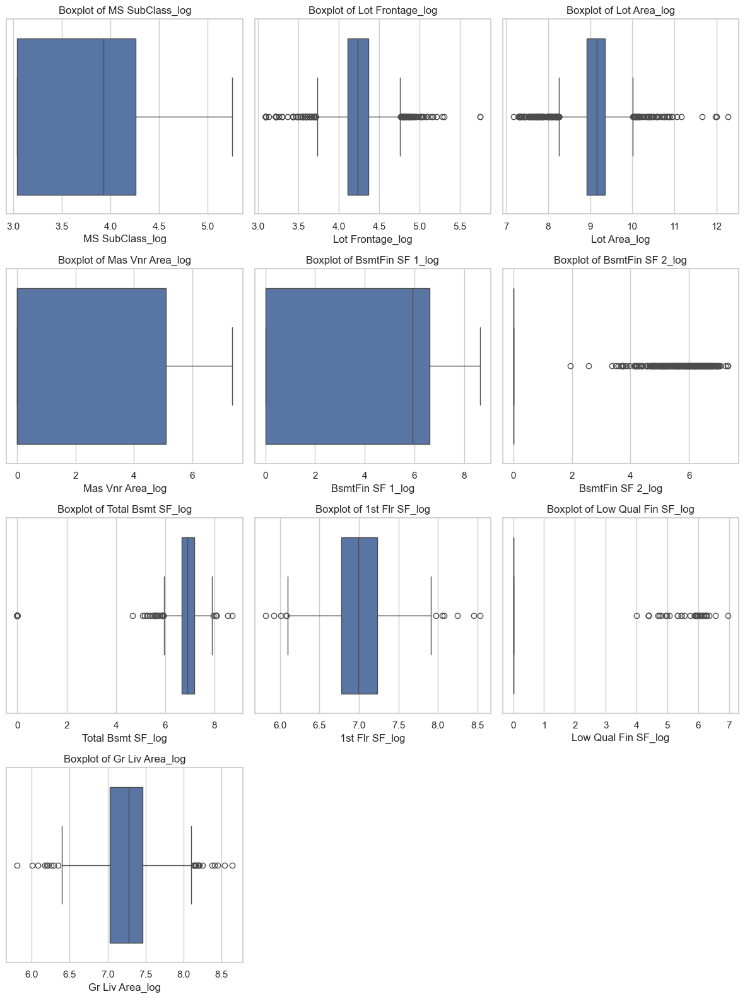

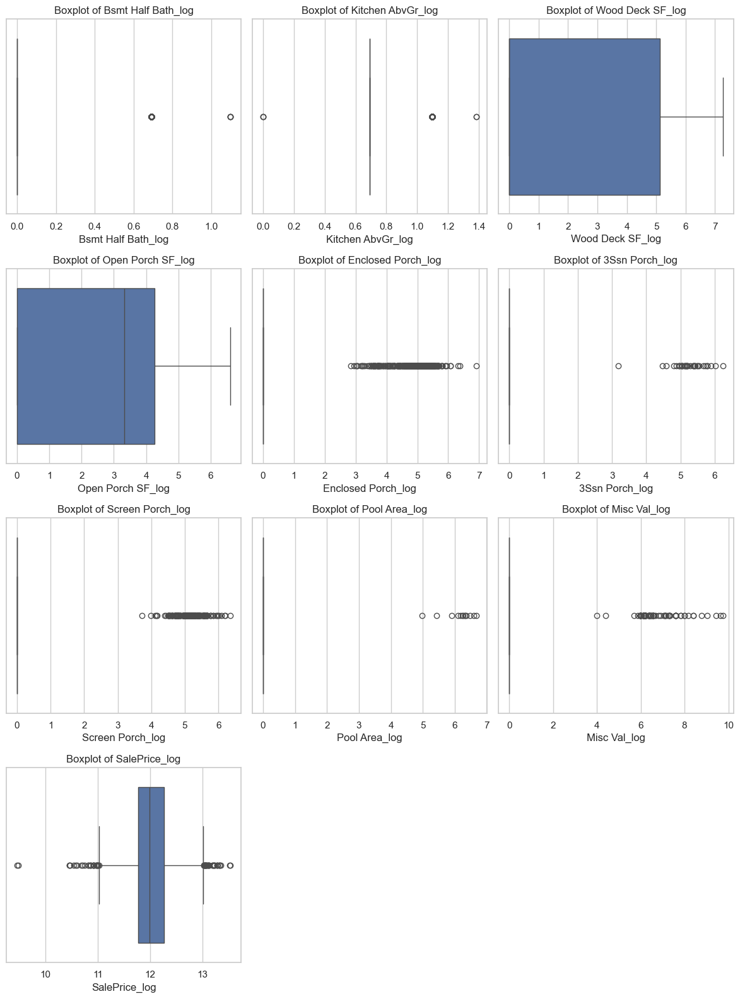

In [33]:
print(df.describe())
log_transformed = [
    "MS SubClass_log",
    "Lot Frontage_log",
    "Lot Area_log",
    "Mas Vnr Area_log",
    "BsmtFin SF 1_log",
    "BsmtFin SF 2_log",
    "Total Bsmt SF_log",
    "1st Flr SF_log",
    "Low Qual Fin SF_log",
    "Gr Liv Area_log",
    "Bsmt Half Bath_log",
    "Kitchen AbvGr_log",
    "Wood Deck SF_log",
    "Open Porch SF_log",
    "Enclosed Porch_log",
    "3Ssn Porch_log",
    "Screen Porch_log",
    "Pool Area_log",
    "Misc Val_log",
    "SalePrice_log"
]

transformed_feats = df[log_transformed]

batch_size = 10
n_cols = 3

n_features = len(transformed_feats.columns)

for batch_start in range(0, n_features, batch_size):
    batch = transformed_feats.columns[batch_start:batch_start + batch_size]
    n = len(batch)
    n_rows = (n + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
    axes = axes.flatten()

    for i, feature in enumerate(batch):
        sns.boxplot(data=df, x=feature, ax=axes[i])
        axes[i].set_title(f'Boxplot of {feature}')
        axes[i].set_xlabel(feature)

    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()

    # Save the figure with batch index (starting from 1)
    batch_num = (batch_start // batch_size) + 1
    plt.savefig(f'transformed boxplots_batch_{batch_num}.png')
    plt.show()



In [34]:
# The log transformation has not really improved the outliers so trying Yeo-Johnson transform next as often performs better when 
# there are a lot of small values, including zeros and negatives
from sklearn.preprocessing import PowerTransformer
import numpy as np

# Set skewness threshold
skew_threshold = 0.75

# Select numerical features
num_feats = df.select_dtypes(include='number')

# Calculate skewness
skew_vals = num_feats.skew().sort_values(ascending=False)

# Identify features with high skew
high_skew_feats = skew_vals[abs(skew_vals) > skew_threshold].index.tolist()

# Apply Yeo-Johnson transform
pt = PowerTransformer(method='yeo-johnson')

for feature in high_skew_feats:
    reshaped_data = df[[feature]].values  # 2D array for sklearn
    try:
        transformed = pt.fit_transform(reshaped_data)
        new_col_name = f"{feature}_yj"
        df[new_col_name] = transformed
    except Exception as e:
        print(f"Could not transform {feature}: {e}")

# List of new columns created
transformed_yj = [f"{feature}_yj" for feature in high_skew_feats]
print("Yeo-Johnson transformed features:", transformed_yj)



Yeo-Johnson transformed features: ['Misc Val_yj', 'Pool Area_yj', 'Pool Area_log_yj', 'Lot Area_yj', 'Low Qual Fin SF_yj', '3Ssn Porch_yj', '3Ssn Porch_log_yj', 'Low Qual Fin SF_log_yj', 'Misc Val_log_yj', 'Kitchen AbvGr_yj', 'BsmtFin SF 2_yj', 'Enclosed Porch_yj', 'Screen Porch_yj', 'Bsmt Half Bath_yj', 'Bsmt Half Bath_log_yj', 'Kitchen AbvGr_log_yj', 'Screen Porch_log_yj', 'Mas Vnr Area_yj', 'Open Porch SF_yj', 'BsmtFin SF 2_log_yj', 'Enclosed Porch_log_yj', 'Wood Deck SF_yj', 'SalePrice_yj', 'Lot Frontage_yj', '1st Flr SF_yj', 'BsmtFin SF 1_yj', 'MS SubClass_yj', 'Gr Liv Area_yj', 'Total Bsmt SF_yj', 'Bsmt Unf SF_yj', '2nd Flr SF_yj', 'TotRms AbvGrd_yj', 'Lot Frontage_log_yj', 'Garage Yr Blt_yj', 'Total Bsmt SF_log_yj']


In [35]:
df.shape

(2930, 132)

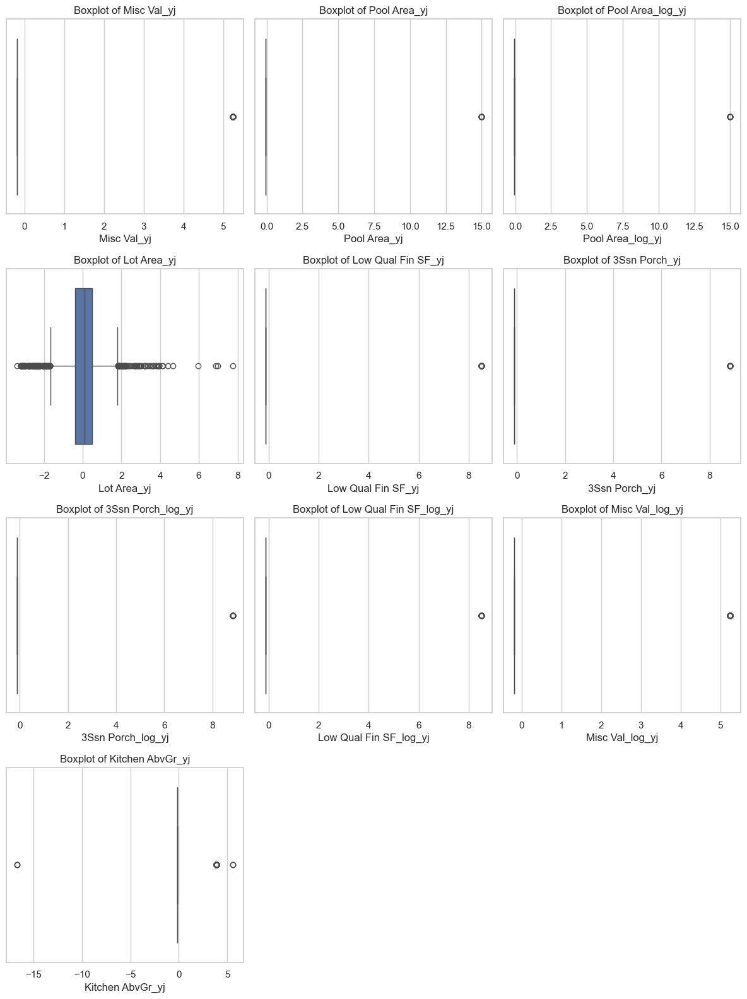

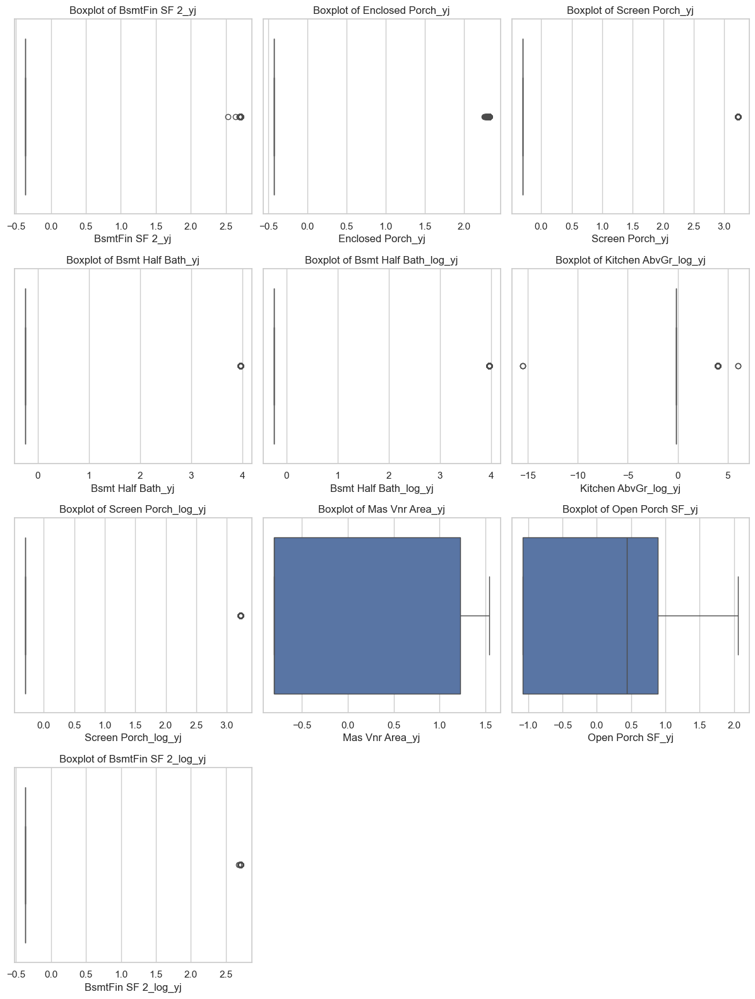

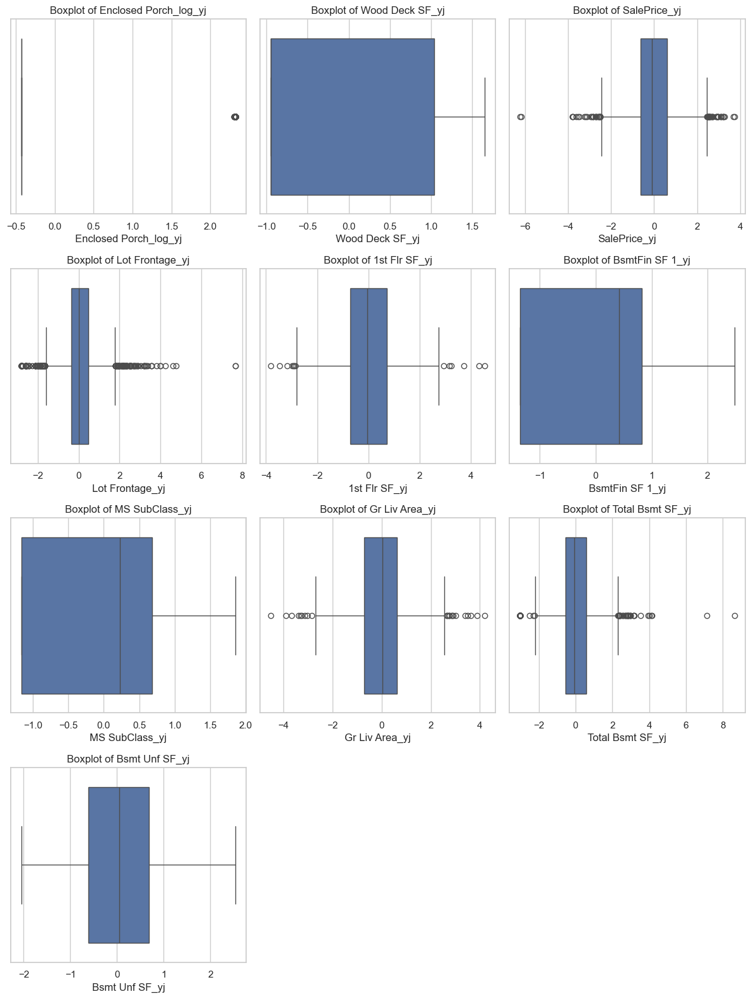

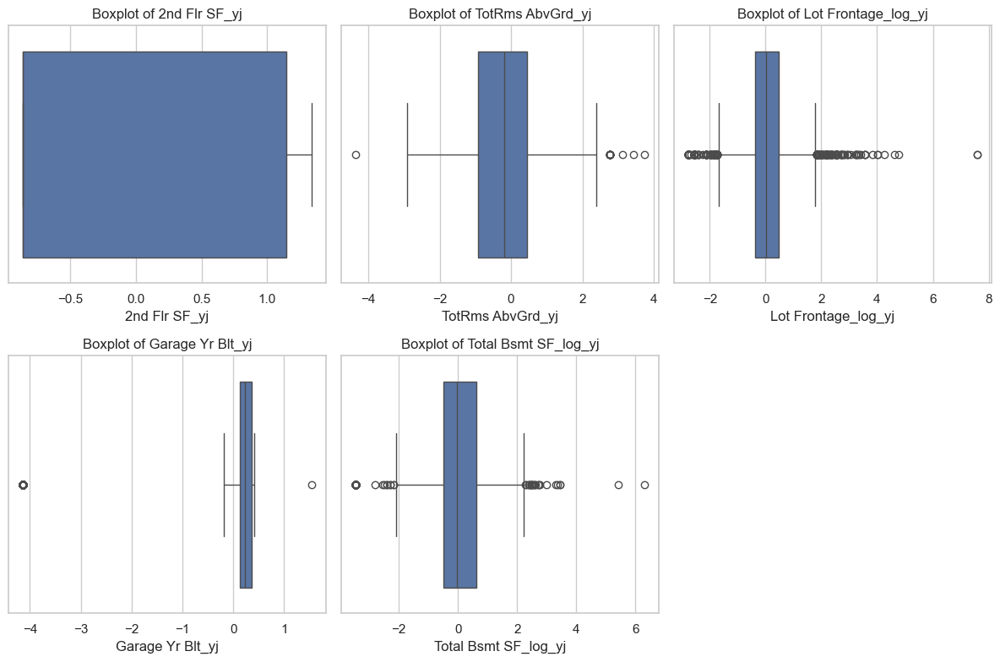

In [36]:
yj_feats = df[transformed_yj]
batch_size = 10
n_cols = 3
n_features = len(yj_feats.columns)

for batch_start in range(0, n_features, batch_size):
    batch = yj_feats.columns[batch_start:batch_start + batch_size]
    n = len(batch)
    n_rows = (n + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
    axes = axes.flatten()

    for i, feature in enumerate(batch):
        sns.boxplot(data=df, x=feature, ax=axes[i])
        axes[i].set_title(f'Boxplot of {feature}')
        axes[i].set_xlabel(feature)

    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()

    # Save the figure with batch index (starting from 1)
    batch_num = (batch_start // batch_size) + 1
    plt.savefig(f'transformed boxplots_batch_{batch_num}.png')
    plt.show()

In [37]:
df[df.columns[-35:]].describe()

,Misc Val_yj,Pool Area_yj,Pool Area_log_yj,Lot Area_yj,Low Qual Fin SF_yj,3Ssn Porch_yj,3Ssn Porch_log_yj,Low Qual Fin SF_log_yj,Misc Val_log_yj,Kitchen AbvGr_yj,...,BsmtFin SF 1_yj,MS SubClass_yj,Gr Liv Area_yj,Total Bsmt SF_yj,Bsmt Unf SF_yj,2nd Flr SF_yj,TotRms AbvGrd_yj,Lot Frontage_log_yj,Garage Yr Blt_yj,Total Bsmt SF_log_yj
count,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,...,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03,2.930000e+03
mean,4.850121e-17,2.425061e-17,1.940048e-17,-3.783094e-16,2.667567e-17,3.395085e-17,-2.910073e-17,2.667567e-17,3.880097e-17,1.263457e-15,...,1.042776e-16,-1.309533e-16,2.878547e-15,2.546314e-16,4.607615e-17,-6.729543e-17,1.857596e-15,1.164029e-16,-2.000675e-16,7.275182e-18
std,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,...,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00,1.000171e+00
min,-1.908779e-01,-6.675802e-02,-6.675802e-02,-3.390688e+00,-1.176471e-01,-1.130906e-01,-1.130906e-01,-1.176471e-01,-1.908779e-01,-1.671044e+01,...,-1.355622e+00,-1.161262e+00,-4.508229e+00,-3.015058e+00,-2.049940e+00,-8.628332e-01,-4.350168e+00,-2.761105e+00,-4.138990e+00,-3.455393e+00
25%,-1.908779e-01,-6.675802e-02,-6.675802e-02,-3.794653e-01,-1.176471e-01,-1.130906e-01,-1.130906e-01,-1.176471e-01,-1.908779e-01,-1.655976e-01,...,-1.355622e+00,-1.161262e+00,-7.187710e-01,-5.333974e-01,-6.119070e-01,-8.628332e-01,-9.332312e-01,-3.797300e-01,1.257225e-01,-4.831161e-01
50%,-1.908779e-01,-6.675802e-02,-6.675802e-02,8.603983e-02,-1.176471e-01,-1.130906e-01,-1.130906e-01,-1.176471e-01,-1.908779e-01,-1.655976e-01,...,4.218656e-01,2.317804e-01,4.449113e-02,-7.854668e-02,4.540045e-02,-8.628332e-01,-1.870804e-01,1.847268e-02,2.303279e-01,-2.456238e-02
75%,-1.908779e-01,-6.675802e-02,-6.675802e-02,4.942131e-01,-1.176471e-01,-1.130906e-01,-1.130906e-01,-1.176471e-01,-1.908779e-01,-1.655976e-01,...,8.256845e-01,6.847658e-01,6.271130e-01,5.980189e-01,6.858960e-01,1.149844e+00,4.552773e-01,4.878786e-01,3.578014e-01,6.172666e-01
max,5.238950e+00,1.497947e+01,1.497947e+01,7.752349e+00,8.500000e+00,8.842465e+00,8.842465e+00,8.500000e+00,5.238950e+00,5.573435e+00,...,2.478772e+00,1.856702e+00,4.203045e+00,8.624832e+00,2.536596e+00,1.339226e+00,3.731038e+00,7.586579e+00,1.540694e+00,6.298310e+00


In [38]:
# This hasn't helped and it has made the data less interpretable as a whole.  
# Capping will be used to reduce skew and influence of rare cases.

# Define features to cap with their capping percentiles
capping_config = {
    'Lot Area': 0.99,
    'Mas Vnr Area': 0.99,
    'Wood Deck SF': 0.99,
    'Open Porch SF': 0.99,
    'Enclosed Porch': 0.99,
    '3Ssn Porch': 0.95,
    'Screen Porch': 0.95,
    'Pool Area': 0.95,
    'Misc Val': 0.99,
    'Gr Liv Area': 0.99,
    'SalePrice': 0.99  
}

# Create capped versions of features
for feature, quantile in capping_config.items():
    cap_value = df[feature].quantile(quantile)
    new_col = f"{feature}_capped"
    df[new_col] = np.where(df[feature] > cap_value, cap_value, df[feature])
    print(f"Capped '{feature}' at {quantile*100:.0f}th percentile: {cap_value:.2f} → New column: '{new_col}'")


Capped 'Lot Area' at 99th percentile: 32988.92 → New column: 'Lot Area_capped'
Capped 'Mas Vnr Area' at 99th percentile: 770.13 → New column: 'Mas Vnr Area_capped'
Capped 'Wood Deck SF' at 99th percentile: 500.71 → New column: 'Wood Deck SF_capped'
Capped 'Open Porch SF' at 99th percentile: 284.13 → New column: 'Open Porch SF_capped'
Capped 'Enclosed Porch' at 99th percentile: 264.00 → New column: 'Enclosed Porch_capped'
Capped '3Ssn Porch' at 95th percentile: 0.00 → New column: '3Ssn Porch_capped'
Capped 'Screen Porch' at 95th percentile: 161.00 → New column: 'Screen Porch_capped'
Capped 'Pool Area' at 95th percentile: 0.00 → New column: 'Pool Area_capped'
Capped 'Misc Val' at 99th percentile: 971.00 → New column: 'Misc Val_capped'
Capped 'Gr Liv Area' at 99th percentile: 2930.66 → New column: 'Gr Liv Area_capped'
Capped 'SalePrice' at 99th percentile: 456666.37 → New column: 'SalePrice_capped'


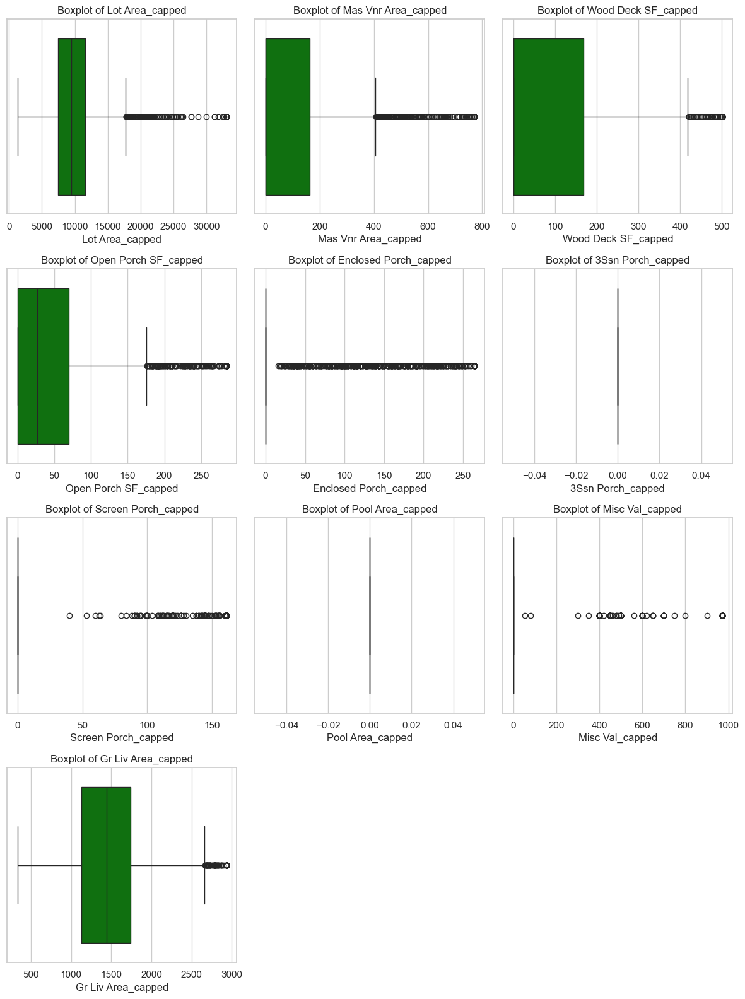

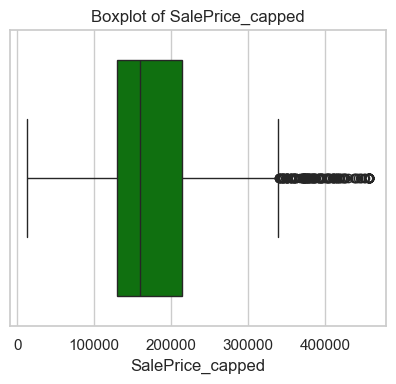

In [39]:
capped_columns = [
    "Lot Area_capped",
    "Mas Vnr Area_capped",
    "Wood Deck SF_capped",
    "Open Porch SF_capped",
    "Enclosed Porch_capped",
    "3Ssn Porch_capped",
    "Screen Porch_capped",
    "Pool Area_capped",
    "Misc Val_capped",
    "Gr Liv Area_capped",
    "SalePrice_capped"
]
capped_feats = df[capped_columns]
batch_size = 10
n_cols = 3
n_features = len(capped_feats.columns)

for batch_start in range(0, n_features, batch_size):
    batch = capped_feats.columns[batch_start:batch_start + batch_size]
    n = len(batch)
    n_rows = (n + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
    axes = axes.flatten()

    for i, feature in enumerate(batch):
        sns.boxplot(data=df, x=feature, ax=axes[i],color="green")
        axes[i].set_title(f'Boxplot of {feature}')
        axes[i].set_xlabel(feature)

    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()

    # Save the figure with batch index (starting from 1)
    batch_num = (batch_start // batch_size) + 1
    plt.savefig(f'transformed boxplots_batch_{batch_num}.png')
    plt.show()

#### 2.6 Logical Inconsistencies


In [40]:
# Logical Inconsistency Checks

# 1. Basement area is 0, but other basement features exist
basement_inconsistencies = df[
    (df["Total Bsmt SF"] == 0) & (
        (df["BsmtFin SF 1"] > 0) | 
        (df["BsmtFin SF 2"] > 0) | 
        (df["Bsmt Full Bath"] > 0) | 
        (df["Bsmt Half Bath"] > 0)
    )
]

# 2. Garage area is 0, but garage features are filled
garage_inconsistencies = df[
    (df["Garage Area"] == 0) & (
        (df["Garage Cars"] > 0) |
        (df["Garage Yr Blt"] > 0)
    )
]

# 3. Remodel year before the build year
remodel_inconsistencies = df[
    df["Year Remod/Add"] < df["Year Built"]
]

# 4. 2nd floor area without 1st floor area
second_floor_inconsistencies = df[
    (df["2nd Flr SF"] > 0) & (df["1st Flr SF"] == 0)
]

# 5. Gross living area smaller than sum of 1st + 2nd + low quality finished SF
living_area_inconsistencies = df[
    df["Gr Liv Area"] < (df["1st Flr SF"] + df["2nd Flr SF"] + df["Low Qual Fin SF"])
]

# Display summary of findings
print("Basement inconsistencies:", len(basement_inconsistencies))
print("Garage inconsistencies:", len(garage_inconsistencies))
print("Remodel year inconsistencies:", len(remodel_inconsistencies))
print("2nd floor inconsistencies:", len(second_floor_inconsistencies))
print("Living area inconsistencies:", len(living_area_inconsistencies))


Basement inconsistencies: 0
Garage inconsistencies: 1
Remodel year inconsistencies: 1
2nd floor inconsistencies: 0
Living area inconsistencies: 0


In [41]:
print(df.loc[df['Order'] == 2237, ['Garage Cars', 'Garage Yr Blt']])
garage_inconsistencies

      Garage Cars  Garage Yr Blt
2236            2            0.0


,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Lot Shape,Land Contour,Utilities,...,Mas Vnr Area_capped,Wood Deck SF_capped,Open Porch SF_capped,Enclosed Porch_capped,3Ssn Porch_capped,Screen Porch_capped,Pool Area_capped,Misc Val_capped,Gr Liv Area_capped,SalePrice_capped
2236,2237,910201180,70,RM,50.0,9060,Pave,Reg,Lvl,AllPub,...,0.0,174.0,0.0,212.0,0.0,0.0,0.0,0.0,1828.0,150909.0


In [42]:
# The garage features are contradictory here so will delete this row - it is the only garage inconsisteny and this is not a very small dataset
df = df[df['Order'] != 2237]

In [43]:
# There is 1 house where Year Remod/Add is before Year Built, which is illogical
remodel_inconsistencies

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Lot Shape,Land Contour,Utilities,...,Mas Vnr Area_capped,Wood Deck SF_capped,Open Porch SF_capped,Enclosed Porch_capped,3Ssn Porch_capped,Screen Porch_capped,Pool Area_capped,Misc Val_capped,Gr Liv Area_capped,SalePrice_capped
850,851,907194160,20,RL,65.0,10739,Pave,IR1,Lvl,AllPub,...,68.0,144.0,40.0,0.0,0.0,0.0,0.0,0.0,1444.0,203000.0


In [44]:
# Impossible to know if original build year or remodel year is correct so this one row will be dropped
df = df[df['Order'] != 851]

In [45]:
# For Living Area inconistency there are too many rows to remove so we will flag these rows for later consideration wen modelling
df['living_area_inconsistency'] = (
    df['Gr Liv Area'] < (df['1st Flr SF'] + df['2nd Flr SF'] + df['Low Qual Fin SF'])
).astype(int)

#### 2.7 Unusual String Lengths

In [46]:
string_cols = df.select_dtypes(include='object').columns

for col in string_cols:
    lengths = df[col].apply(len)
    
    print(f"Column: {col}")
    print(f"  Min length: {lengths.min()}")
    print(f"  Max length: {lengths.max()}")
    print(f"  Mean length: {lengths.mean():.2f}")
    print(f"  95th percentile length: {lengths.quantile(0.95)}")
    
    threshold = lengths.quantile(0.95)
    unusual = df[lengths > threshold][col]
    
    print(f"  Examples of long strings (> 95th percentile): {unusual.head(5).to_list()}\n")


Column: MS Zoning
  Min length: 2
  Max length: 7
  Mean length: 2.05
  95th percentile length: 2.0
  Examples of long strings (> 95th percentile): ['C (all)', 'C (all)', 'C (all)', 'C (all)', 'C (all)']

Column: Street
  Min length: 4
  Max length: 4
  Mean length: 4.00
  95th percentile length: 4.0
  Examples of long strings (> 95th percentile): []

Column: Lot Shape
  Min length: 3
  Max length: 3
  Mean length: 3.00
  95th percentile length: 3.0
  Examples of long strings (> 95th percentile): []

Column: Land Contour
  Min length: 3
  Max length: 3
  Mean length: 3.00
  95th percentile length: 3.0
  Examples of long strings (> 95th percentile): []

Column: Utilities
  Min length: 6
  Max length: 6
  Mean length: 6.00
  95th percentile length: 6.0
  Examples of long strings (> 95th percentile): []

Column: Lot Config
  Min length: 3
  Max length: 7
  Mean length: 5.96
  95th percentile length: 7.0
  Examples of long strings (> 95th percentile): []

Column: Land Slope
  Min length: 3

In [47]:
# No unusual string lengths found

#### 2.8 Blank strings

In [48]:
string_cols = df.select_dtypes(include='object').columns
found_blanks = False

for col in string_cols:
    blank_count = df[col].apply(lambda x: isinstance(x, str) and x.strip() == '').sum()
    if blank_count > 0:
        print(f"Column '{col}' has {blank_count} blank/whitespace-only strings.")
        found_blanks = True

if not found_blanks:
    print("No blank or whitespace-only strings found in any string column.")


No blank or whitespace-only strings found in any string column.


#### 2.9 Create new features

In [49]:
# Age - related features
df['house_age'] = df['Yr Sold'] - df['Year Built']
df['remodel_age'] = df['Yr Sold'] - df['Year Remod/Add']
df['years_to_remodel'] = df['Year Remod/Add'] - df['Year Built']

# Combine all full and half bathrooms (both basement and above grade) into one feature
df['total_bathrooms'] = (df['Bsmt Full Bath'] + 0.5 * df['Bsmt Half Bath'] + 
                         df['Full Bath'] + 0.5 * df['Half Bath'])

# Sum all porch areas (Wood Deck, Open Porch, Enclosed Porch, 3Ssn Porch, Screen Porch) to get total outdoor living space
df['total_porch_area'] = (df['Wood Deck SF'] + df['Open Porch SF'] + df['Enclosed Porch'] + 
                          df['3Ssn Porch'] + df['Screen Porch'])

# Sum of finished basement areas (type 1 + type 2)
df['total_bsmt_finished'] = df['BsmtFin SF 1'] + df['BsmtFin SF 2']

# Ratio of above ground living area to total lot area — gives sense of density
df['living_area_ratio'] = df['Gr Liv Area'] / df['Lot Area']

# Combine Overall Qual and Overall Cond into a single "quality score": average or weighted sum
df['avg_quality'] = df[['Overall Qual', 'Overall Cond']].mean(axis=1)

# From Mo Sold, create seasons or quarters (Winter, Spring, Summer, Fall)
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3,4,5]:
        return 'Spring'
    elif month in [6,7,8]:
        return 'Summer'
    else:
        return 'Fall'

df['season_sold'] = df['Mo Sold'].apply(get_season)

# Interaction of Overall Qual and Gr Liv Area
df['qual_living_area_interaction'] = df['Overall Qual'] * df['Gr Liv Area']

In [50]:
df.columns.to_list()

['Order',
 'PID',
 'MS SubClass',
 'MS Zoning',
 'Lot Frontage',
 'Lot Area',
 'Street',
 'Lot Shape',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Overall Qual',
 'Overall Cond',
 'Year Built',
 'Year Remod/Add',
 'Roof Style',
 'Roof Matl',
 'Exterior 1st',
 'Exterior 2nd',
 'Mas Vnr Area',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin SF 1',
 'BsmtFin Type 2',
 'BsmtFin SF 2',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 'Heating',
 'Heating QC',
 'Central Air',
 'Electrical',
 '1st Flr SF',
 '2nd Flr SF',
 'Low Qual Fin SF',
 'Gr Liv Area',
 'Bsmt Full Bath',
 'Bsmt Half Bath',
 'Full Bath',
 'Half Bath',
 'Bedroom AbvGr',
 'Kitchen AbvGr',
 'Kitchen Qual',
 'TotRms AbvGrd',
 'Functional',
 'Fireplaces',
 'Fireplace Qu',
 'Garage Type',
 'Garage Yr Blt',
 'Garage Finish',
 'Garage Cars',
 'Garage Area',
 'Garage Qual',
 'Ga

In [51]:
# We need to create a fresh copy of the df without the log transformed and yeo-johnson transformed columns
df_no_log_yj = df[[col for col in df.columns if '_log' not in col and '_yj' not in col]].copy()


In [52]:
df_no_log_yj.columns.to_list()

['Order',
 'PID',
 'MS SubClass',
 'MS Zoning',
 'Lot Frontage',
 'Lot Area',
 'Street',
 'Lot Shape',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Overall Qual',
 'Overall Cond',
 'Year Built',
 'Year Remod/Add',
 'Roof Style',
 'Roof Matl',
 'Exterior 1st',
 'Exterior 2nd',
 'Mas Vnr Area',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin SF 1',
 'BsmtFin Type 2',
 'BsmtFin SF 2',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 'Heating',
 'Heating QC',
 'Central Air',
 'Electrical',
 '1st Flr SF',
 '2nd Flr SF',
 'Low Qual Fin SF',
 'Gr Liv Area',
 'Bsmt Full Bath',
 'Bsmt Half Bath',
 'Full Bath',
 'Half Bath',
 'Bedroom AbvGr',
 'Kitchen AbvGr',
 'Kitchen Qual',
 'TotRms AbvGrd',
 'Functional',
 'Fireplaces',
 'Fireplace Qu',
 'Garage Type',
 'Garage Yr Blt',
 'Garage Finish',
 'Garage Cars',
 'Garage Area',
 'Garage Qual',
 'Ga

In [53]:
# Three of our created features were based on original features rather than capped features in error.  Can fix this now:
# ✅ Recreate using _capped columns

# Recalculate total_porch_area using capped values
df['total_porch_area'] = (
    df['Wood Deck SF_capped'] + df['Open Porch SF_capped'] + 
    df['Enclosed Porch_capped'] + df['3Ssn Porch_capped'] + 
    df['Screen Porch_capped']
)

# Recalculate living_area_ratio using capped columns
df['living_area_ratio'] = df['Gr Liv Area_capped'] / df['Lot Area_capped']

# Recalculate qual_living_area_interaction using capped Gr Liv Area
df['qual_living_area_interaction'] = df['Overall Qual'] * df['Gr Liv Area_capped']

In [54]:
# Also to be fixed in df_no_log_yj

# Recalculate total_porch_area using capped values
df_no_log_yj['total_porch_area'] = (
    df_no_log_yj['Wood Deck SF_capped'] + df_no_log_yj['Open Porch SF_capped'] + 
    df_no_log_yj['Enclosed Porch_capped'] + df_no_log_yj['3Ssn Porch_capped'] + 
    df_no_log_yj['Screen Porch_capped']
)

# Recalculate living_area_ratio using capped columns
df_no_log_yj['living_area_ratio'] = df_no_log_yj['Gr Liv Area_capped'] / df_no_log_yj['Lot Area_capped']

# Recalculate qual_living_area_interaction using capped Gr Liv Area
df_no_log_yj['qual_living_area_interaction'] = df_no_log_yj['Overall Qual'] * df_no_log_yj['Gr Liv Area_capped']


In [55]:
# Remove original columns were capped versions exist and rename df
# List of capped columns suffixes (without _capped)
capped_cols_togo = [
    'Lot Area',
    'Mas Vnr Area',
    'Wood Deck SF',
    'Open Porch SF',
    'Enclosed Porch',
    '3Ssn Porch',
    'Screen Porch',
    'Pool Area',
    'Misc Val',
    'Gr Liv Area',
    'SalePrice'
]

# Create list of original columns to drop (those that have capped versions)
cols_to_drop = capped_cols_togo

# Drop these original columns from df_no_log_yj
df_no_log_yj = df_no_log_yj.drop(columns=cols_to_drop)

# Rename df_no_log_yj to df_new
df_new = df_no_log_yj.copy()


## 3. EDA

#### 3.1 Univariate Analysis

#### 3.1.1 Numerical Features

In [56]:
df_new.select_dtypes(include='number').shape

(2928, 49)

In [57]:
# As there are 49 numerical columns lets remove those with little variance as these are not very informative
# Select numerical columns only from df_final
num_cols = df_new.select_dtypes(include=[np.number]).columns

# Calculate variance for each numerical feature
variances = df_new[num_cols].var()

# Set a threshold for "low variance" (adjust as needed)
low_variance_threshold = 0.01

# Identify features with variance below the threshold
low_variance_features = variances[variances < low_variance_threshold].index.tolist()

print("Features with low variance:")
print(low_variance_features)

Features with low variance:
['3Ssn Porch_capped', 'Pool Area_capped', 'living_area_inconsistency']


In [58]:
num_cols = [col for col in num_cols if col not in ["3Ssn Porch_capped", "Pool Area_capped"]]
len(num_cols)
                         

47

In [60]:
# Step 1: Get all numeric columns
num_cols_all = df_new.select_dtypes(include=[np.number]).columns.tolist()

# Step 2: Define ID-like columns
id_cols = ['Order', 'PID']

# Step 3: Define ordinal columns (manually identified from domain knowledge)
ordinal_cols = [
    'Overall Qual', 'Overall Cond', 'Exter Qual', 'Exter Cond',
    'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1',
    'BsmtFin Type 2', 'Heating QC', 'Kitchen Qual', 'Functional',
    'Fireplace Qu', 'Garage Finish', 'Garage Qual', 'Garage Cond',
    'Paved Drive'
]

# Only keep those that are present in df_new
ordinal_cols = [col for col in ordinal_cols if col in df_new.columns]

# Step 4: Combine all exclusions
cols_to_exclude = set(id_cols + ordinal_cols)

# Step 5: Filter numerical columns for EDA
num_cols_filtered = [col for col in num_cols_all if col not in cols_to_exclude]

# Show results
print("✅ Excluded columns:")
print(sorted(cols_to_exclude))
print(f"\n✅ Final numerical columns for univariate analysis ({len(num_cols_filtered)}):")
print(sorted(num_cols_filtered))


✅ Excluded columns:
['Bsmt Cond', 'Bsmt Exposure', 'Bsmt Qual', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Exter Cond', 'Exter Qual', 'Fireplace Qu', 'Functional', 'Garage Cond', 'Garage Finish', 'Garage Qual', 'Heating QC', 'Kitchen Qual', 'Order', 'Overall Cond', 'Overall Qual', 'PID', 'Paved Drive']

✅ Final numerical columns for univariate analysis (45):
['1st Flr SF', '2nd Flr SF', '3Ssn Porch_capped', 'Bedroom AbvGr', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Bsmt Unf SF', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Enclosed Porch_capped', 'Fireplaces', 'Full Bath', 'Garage Area', 'Garage Cars', 'Garage Yr Blt', 'Gr Liv Area_capped', 'Half Bath', 'Kitchen AbvGr', 'Lot Area_capped', 'Lot Frontage', 'Low Qual Fin SF', 'MS SubClass', 'Mas Vnr Area_capped', 'Misc Val_capped', 'Mo Sold', 'Open Porch SF_capped', 'Pool Area_capped', 'SalePrice_capped', 'Screen Porch_capped', 'TotRms AbvGrd', 'Total Bsmt SF', 'Wood Deck SF_capped', 'Year Built', 'Year Remod/Add', 'Yr Sold', 'avg_quality', 'house_age', 'living

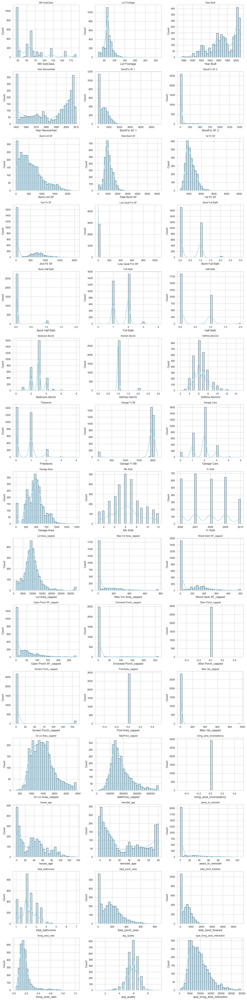

In [63]:
import os
output_dir = "eda_univariate_plots"
os.makedirs(output_dir, exist_ok=True)

cols = num_cols_filtered  # or whatever your final list is
n_cols = 3  # plots per row
n_rows = (len(cols) + n_cols - 1) // n_cols  # ceil division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
axes = axes.flatten()

# Plot each histogram with KDE and save it
for i, col in enumerate(cols):
    ax = axes[i]
    sns.histplot(data=df_new, x=col, kde=True, ax=ax, bins=30, color='skyblue', edgecolor='black')
    ax.set_title(f'{col}', fontsize=10)

    # Save each plot as its own figure too
    single_fig = plt.figure(figsize=(6, 4))
    sns.histplot(data=df_new, x=col, kde=True, bins=30, color='skyblue', edgecolor='black')
    plt.title(f'{col} Distribution')
    plt.tight_layout()
    single_fig.savefig(f"{output_dir}/{col.replace('/', '_')}_hist_kde.png")
    plt.close(single_fig)  # Close to avoid clutter

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [64]:
# Compute correlation with the target
correlations = df_new[cols].corr()['SalePrice_capped'].drop('SalePrice_capped')

# Sort by absolute correlation value (descending)
sorted_corr = correlations.abs().sort_values(ascending=False)

# Display top correlations (you can adjust the number)
sorted_corr_top = correlations.loc[sorted_corr.index]
print("Correlations with SalePrice_capped:\n")
display(sorted_corr_top)


Correlations with SalePrice_capped:



qual_living_area_interaction    0.870268
Gr Liv Area_capped              0.721902
Garage Cars                     0.662413
Garage Area                     0.652544
total_bathrooms                 0.645520
Total Bsmt SF                   0.634097
1st Flr SF                      0.622991
avg_quality                     0.602766
house_age                      -0.576052
Year Built                      0.575599
Full Bath                       0.555079
remodel_age                    -0.552184
Year Remod/Add                  0.550198
Mas Vnr Area_capped             0.506096
TotRms AbvGrd                   0.497449
Fireplaces                      0.481518
BsmtFin SF 1                    0.430806
total_bsmt_finished             0.412349
total_porch_area                0.400291
Lot Area_capped                 0.367188
Open Porch SF_capped            0.349387
Lot Frontage                    0.340024
Wood Deck SF_capped             0.337733
Half Bath                       0.287509
Bsmt Full Bath  

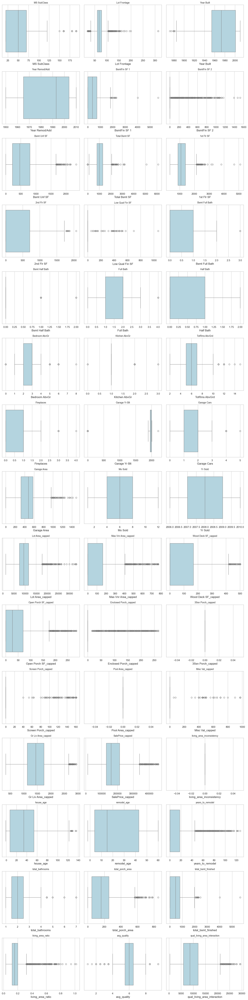

In [65]:
# Create output directory if it doesn't exist
output_dir = "eda_boxplots"
os.makedirs(output_dir, exist_ok=True)

# Number of plots per row
n_cols = 3
n_rows = (len(cols) + n_cols - 1) // n_cols  # ceil division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
axes = axes.flatten()

for i, col in enumerate(cols):
    ax = axes[i]
    
    # Create horizontal boxplot in the grid
    sns.boxplot(data=df_new, x=col, ax=ax, color='lightblue')
    ax.set_title(f'{col}', fontsize=10)

    # Save individual horizontal boxplot
    single_fig = plt.figure(figsize=(6, 4))  # Wider than tall for horizontal
    sns.boxplot(data=df_new, x=col, color='lightblue')
    plt.title(f'{col} Boxplot')
    plt.tight_layout()
    single_fig.savefig(f"{output_dir}/{col.replace('/', '_')}_boxplot.png")
    plt.close(single_fig)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### 3.1.2 Categorical Analysis

In [66]:
# Make sure we capture all categorical features
# 1. Identify all object and category dtype columns
df_new['MS SubClass'] = df_new['MS SubClass'].astype(str)
cat_cols = df_new.select_dtypes(include=['object', 'category']).columns.tolist()

# 2. Manually check for any int/float columns that are actually categorical (e.g. encoded labels, discrete small-range integers)
# For example, identify numeric columns with few unique values
potential_cats = [col for col in df_new.select_dtypes(include=['int64', 'float64']).columns
                  if df_new[col].nunique() < 10]  # You can adjust this threshold

# 3. Combine with known categorical types
cat_cols_final = cat_cols + potential_cats
cat_cols_final
# 4. Optionally remove any that are clearly numeric (e.g. total bathrooms)
# You may want to filter further based on domain knowledge


['MS SubClass',
 'MS Zoning',
 'Street',
 'Lot Shape',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Roof Matl',
 'Exterior 1st',
 'Exterior 2nd',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Heating',
 'Heating QC',
 'Central Air',
 'Electrical',
 'Kitchen Qual',
 'Functional',
 'Fireplace Qu',
 'Garage Type',
 'Garage Finish',
 'Garage Qual',
 'Garage Cond',
 'Paved Drive',
 'Sale Type',
 'Sale Condition',
 'season_sold',
 'Overall Cond',
 'Bsmt Full Bath',
 'Bsmt Half Bath',
 'Full Bath',
 'Half Bath',
 'Bedroom AbvGr',
 'Kitchen AbvGr',
 'Fireplaces',
 'Garage Cars',
 'Yr Sold',
 '3Ssn Porch_capped',
 'Pool Area_capped',
 'living_area_inconsistency']

In [67]:
# Manually remove known numerical features
to_remove = [
    'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath', 'Half Bath',
    'Bedroom AbvGr', 'Kitchen AbvGr', 'Fireplaces', 'Garage Cars',
    'Yr Sold', '3Ssn Porch_capped', 'Pool Area_capped',
    'living_area_inconsistency'
]

# Remove them from your cat_cols_final list
cat_cols_final = [col for col in cat_cols_final if col not in to_remove]
cat_cols_final

['MS SubClass',
 'MS Zoning',
 'Street',
 'Lot Shape',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Roof Matl',
 'Exterior 1st',
 'Exterior 2nd',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Heating',
 'Heating QC',
 'Central Air',
 'Electrical',
 'Kitchen Qual',
 'Functional',
 'Fireplace Qu',
 'Garage Type',
 'Garage Finish',
 'Garage Qual',
 'Garage Cond',
 'Paved Drive',
 'Sale Type',
 'Sale Condition',
 'season_sold',
 'Overall Cond']

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2625292629.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_new, x=col, ax=ax, order=df_new[col].value_counts().index, palette='pastel')
C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2625292629.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_new, x=col, order=df_new[col].value_counts().index, palette='pastel')
C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2625292629.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_new, x=col, ax=ax, order=

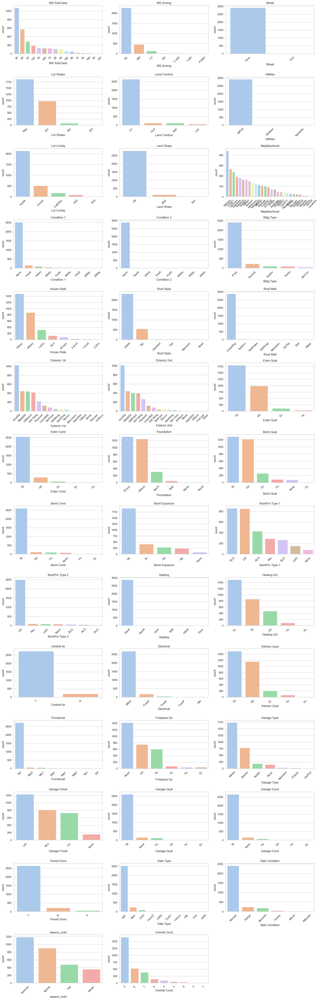

In [68]:
# Set up output folder
output_dir = "eda_catplots"
os.makedirs(output_dir, exist_ok=True)

# Layout for subplots
n_cols = 3
n_rows = (len(cat_cols_final) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 4))
axes = axes.flatten()

for i, col in enumerate(cat_cols_final):
    ax = axes[i]
    
    # Create countplot in the subplot grid
    sns.countplot(data=df_new, x=col, ax=ax, order=df_new[col].value_counts().index, palette='pastel')
    ax.set_title(col)
    ax.tick_params(axis='x', rotation=45)

    # Save individual figure
    single_fig = plt.figure(figsize=(8, 4))
    sns.countplot(data=df_new, x=col, order=df_new[col].value_counts().index, palette='pastel')
    plt.title(f'{col} Count Plot')
    plt.xticks(rotation=45)
    plt.tight_layout()
    single_fig.savefig(f"{output_dir}/{col.replace('/', '_')}_countplot.png")
    plt.close(single_fig)

# Delete any unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [69]:
len(cat_cols_final)

41

In [70]:
# As a large number of features - need to find the most relevant features to present in written report
import pandas as pd
import numpy as np
from scipy.stats import f_oneway

# Bin SalePrice for categorical association
df_new['SalePrice_bin'] = pd.qcut(df_new['SalePrice_capped'], q=4, duplicates='drop')

anova_results = {}
for col in cat_cols_final:
    groups = [df_new.loc[df_new[col] == cat, 'SalePrice_capped'] for cat in df_new[col].dropna().unique()]
    try:
        f_stat, p_val = f_oneway(*groups)
        anova_results[col] = p_val
    except:
        anova_results[col] = np.nan  # For features with too few groups

# Sort by significance (lowest p-values)
sorted_anova = dict(sorted(anova_results.items(), key=lambda item: item[1] if item[1] is not None else 1))
print(sorted_anova)


{'Neighborhood': np.float64(0.0), 'Exter Qual': np.float64(0.0), 'Bsmt Qual': np.float64(0.0), 'Kitchen Qual': np.float64(0.0), 'Garage Finish': np.float64(1.7167547023773268e-248), 'Fireplace Qu': np.float64(1.1434071772365616e-240), 'Foundation': np.float64(1.888323694363712e-219), 'Garage Type': np.float64(1.2471946430003327e-191), 'MS SubClass': np.float64(7.734521048512846e-180), 'BsmtFin Type 1': np.float64(2.5979533143232938e-169), 'Heating QC': np.float64(9.545036794296359e-162), 'Bsmt Exposure': np.float64(1.3398703614704106e-124), 'Exterior 1st': np.float64(1.7290055278757875e-116), 'Exterior 2nd': np.float64(3.311637228932877e-113), 'Overall Cond': np.float64(3.582145563321512e-105), 'Sale Condition': np.float64(9.137955239360596e-97), 'Sale Type': np.float64(1.692061345165478e-93), 'MS Zoning': np.float64(4.67964073029793e-81), 'Lot Shape': np.float64(8.738770046339069e-64), 'Garage Qual': np.float64(2.5104056047335646e-61), 'Garage Cond': np.float64(8.088857526792997e-57),

In [71]:
# keep all features apart from utilities
cat_cols_final = [col for col in cat_cols_final if col != 'Utilities']

In [72]:
# drop features with no variability
remove_cols = ['Street', 'Condition 2', 'Roof Matl']
cat_cols_final = [col for col in cat_cols_final if col not in remove_cols]



In [73]:
# Check further for low variability features
threshold = 0.90

low_variance_cols = []

for col in cat_cols_final:
    # Get normalized value counts (proportion of each category)
    top_freq = df_new[col].value_counts(normalize=True).iloc[0]
    
    if top_freq > threshold:
        low_variance_cols.append(col)

print("Low variance categorical columns (remove or consider removing):")
print(low_variance_cols)

# Remove low variance columns from your categorical features list
cat_cols_reduced = [col for col in cat_cols if col not in low_variance_cols]

Low variance categorical columns (remove or consider removing):
['Land Slope', 'Heating', 'Central Air', 'Electrical', 'Functional', 'Garage Cond', 'Paved Drive']


In [74]:
# drop features with little variability
remove_cols = ['Land Slope','Heating','Central Air','Functional','Electrical','Garage Cond', 'Paved Drive']
cat_cols_final = [col for col in cat_cols_final if col not in remove_cols]
cat_cols_final

['MS SubClass',
 'MS Zoning',
 'Lot Shape',
 'Land Contour',
 'Lot Config',
 'Neighborhood',
 'Condition 1',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Exterior 1st',
 'Exterior 2nd',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Heating QC',
 'Kitchen Qual',
 'Fireplace Qu',
 'Garage Type',
 'Garage Finish',
 'Garage Qual',
 'Sale Type',
 'Sale Condition',
 'season_sold',
 'Overall Cond']

In [75]:
anova_sorted = {
    'Neighborhood': 0.0,
    'Exter Qual': 0.0,
    'Bsmt Qual': 0.0,
    'Kitchen Qual': 0.0,
    'Garage Finish': 1.72e-248,
    'Fireplace Qu': 1.14e-240,
    'Foundation': 1.89e-219,
    'Garage Type': 1.25e-191,
    'MS SubClass': 7.73e-180,         # Note: MS SubClass is categorical but omitted from cat_cols_final below
    'BsmtFin Type 1': 2.60e-169,
    'Heating QC': 9.55e-162,
    'Bsmt Exposure': 1.34e-124,
    'Exterior 1st': 1.73e-116,
    'Exterior 2nd': 3.31e-113,
    'Overall Cond': 3.58e-105,
    'Sale Condition': 9.14e-97,
    'Sale Type': 1.69e-93,
    'MS Zoning': 4.68e-81,
    'Lot Shape': 8.74e-64,
    'Garage Qual': 2.51e-61,
    'Garage Cond': 8.09e-57,
    'Paved Drive': 2.01e-55,
    'House Style': 7.66e-50,
    'Roof Style': 1.91e-47,
    'Bsmt Cond': 2.90e-34,
    'Land Contour': 9.97e-29,
    'Condition 1': 2.81e-26,
    'Bldg Type': 7.05e-23,
    'BsmtFin Type 2': 1.02e-18,
    'Exter Cond': 4.71e-18,
    'Lot Config': 2.46e-12,
    'season_sold': 0.00147
}

cat_cols_final = [
 'MS Zoning',
 'Lot Shape',
 'Land Contour',
 'Lot Config',
 'Neighborhood',
 'Condition 1',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Exterior 1st',
 'Exterior 2nd',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Heating QC',
 'Kitchen Qual',
 'Fireplace Qu',
 'Garage Type',
 'Garage Finish',
 'Garage Qual',
 'Sale Type',
 'Sale Condition',
 'season_sold',
 'Overall Cond',
 'MS SubClass'
]

# Filter anova_sorted to only include features in cat_cols_final
anova_filtered = {k: v for k, v in anova_sorted.items() if k in cat_cols_final}

# Sort filtered features by p-value ascending
sorted_features = sorted(anova_filtered, key=anova_filtered.get)

# Top 15 features by ANOVA p-value:
top_15_features = sorted_features[:15]

print(top_15_features)


['Neighborhood', 'Exter Qual', 'Bsmt Qual', 'Kitchen Qual', 'Garage Finish', 'Fireplace Qu', 'Foundation', 'Garage Type', 'MS SubClass', 'BsmtFin Type 1', 'Heating QC', 'Bsmt Exposure', 'Exterior 1st', 'Exterior 2nd', 'Overall Cond']


In [76]:
cat_cols_final = top_15_features

In [77]:
# Domain knowledge features to add back
domain_features = [
    'MS Zoning', 'House Style', 'Condition 1', 'Roof Style', 'Paved Drive, '
]

for feature in domain_features:
    if feature not in cat_cols_final:
        cat_cols_final.append(feature)
cat_cols_final

['Neighborhood',
 'Exter Qual',
 'Bsmt Qual',
 'Kitchen Qual',
 'Garage Finish',
 'Fireplace Qu',
 'Foundation',
 'Garage Type',
 'MS SubClass',
 'BsmtFin Type 1',
 'Heating QC',
 'Bsmt Exposure',
 'Exterior 1st',
 'Exterior 2nd',
 'Overall Cond',
 'MS Zoning',
 'House Style',
 'Condition 1',
 'Roof Style',
 'Paved Drive, ']

#### 3.2 Bivariate Analysis
#### 3.2.1 Numerical Versus Numerical

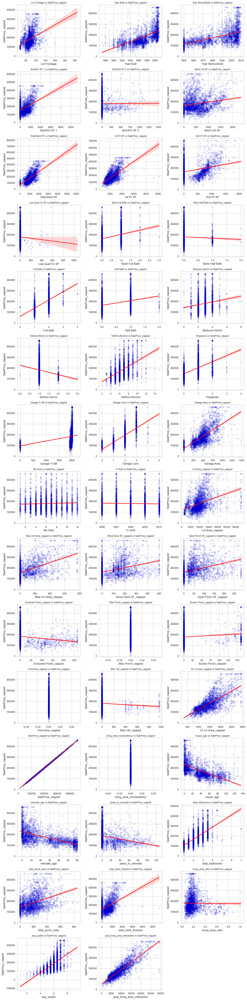

In [79]:
from pandas.api.types import is_numeric_dtype

num_cols_filtered = [col for col in num_cols_filtered if is_numeric_dtype(df_new[col])]
# Regplots for all numerical features
output_dir = 'numeric_vs_target'
os.makedirs(output_dir, exist_ok=True)

plots_per_row = 3
total_plots = len(num_cols_filtered)
rows = (total_plots + plots_per_row - 1) // plots_per_row

fig, axes = plt.subplots(rows, plots_per_row, figsize=(plots_per_row * 5, rows * 4))
axes = axes.flatten()

for i, feature in enumerate(num_cols_filtered):
    ax = axes[i]
    sns.regplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax,
            scatter_kws={'alpha':0.1,'color': 'mediumblue'}, line_kws={'color':'red'})
    ax.set_title(f'{feature} vs SalePrice_capped', fontsize=10)
    ax.set_xlabel(feature)
    ax.set_ylabel('SalePrice_capped')

    # Save individual plot
    single_fig = plt.figure(figsize=(6, 4))
    sns.regplot(data=df_new, x=feature, y='SalePrice_capped',
            scatter_kws={'alpha':0.1, 'color': 'mediumblue'}, line_kws={'color':'red'})
    plt.title(f'{feature} vs SalePrice_capped')
    plt.tight_layout()
    safe_feature = feature.replace('/', '_').replace('\\', '_').replace(':', '_')
    single_fig.savefig(f"{output_dir}/{safe_feature}_vs_SalePrice_capped.png")
    plt.close(single_fig)

# Remove empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.show()


Plotting and saving group: Size & Area Features (8 features)


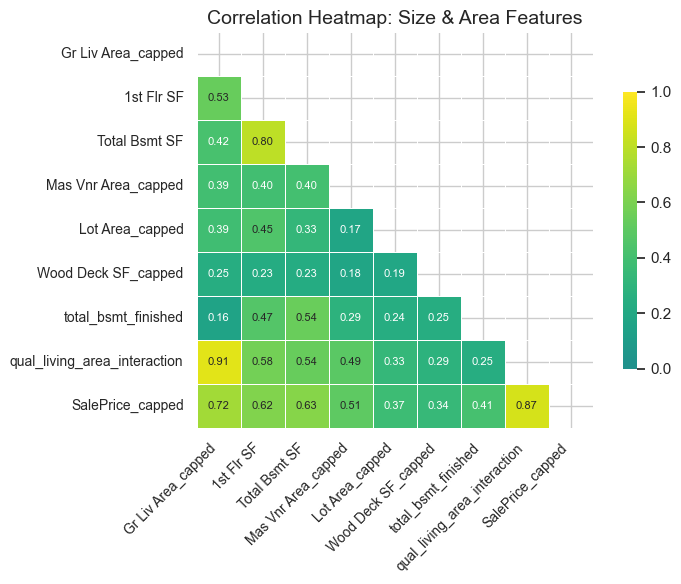

Saved heatmap: heatmaps/Size_&_Area_Features_corr_heatmap.png
Plotting and saving group: Bathrooms & Plumbing (2 features)


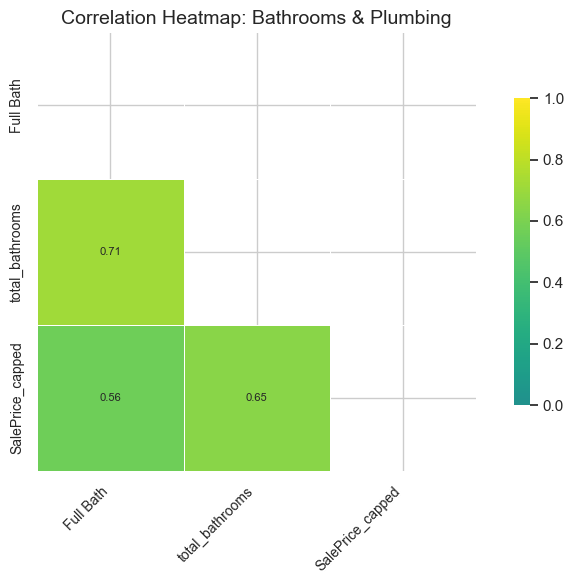

Saved heatmap: heatmaps/Bathrooms_&_Plumbing_corr_heatmap.png
Plotting and saving group: Rooms & Interior Count (3 features)


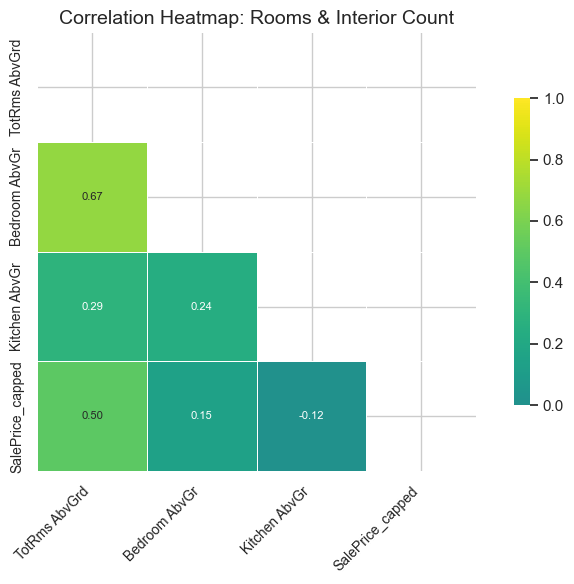

Saved heatmap: heatmaps/Rooms_&_Interior_Count_corr_heatmap.png
Plotting and saving group: Quality / Composite Scores (2 features)


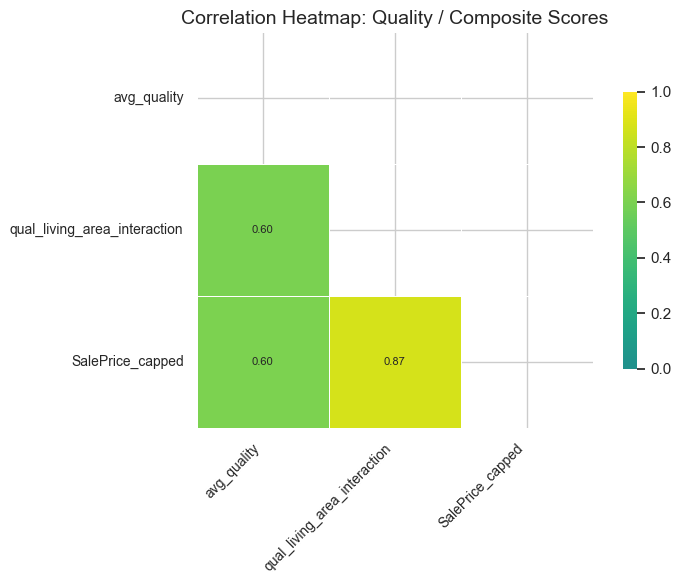

Saved heatmap: heatmaps/Quality___Composite_Scores_corr_heatmap.png
Plotting and saving group: Age / Time-Based Features (3 features)


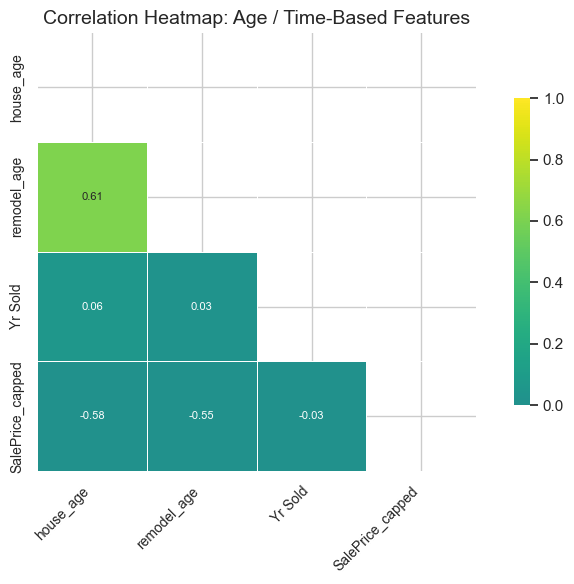

Saved heatmap: heatmaps/Age___Time-Based_Features_corr_heatmap.png
Plotting and saving group: Garage, Porch and External Features (3 features)


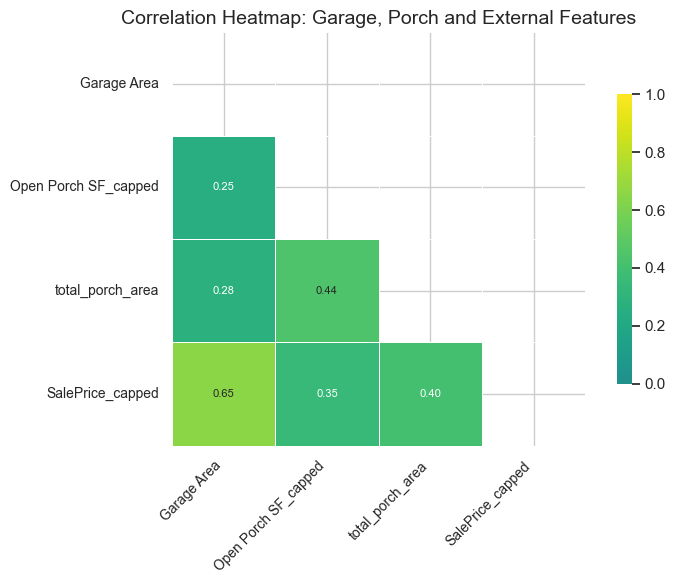

Saved heatmap: heatmaps/Garage,_Porch_and_External_Features_corr_heatmap.png
Plotting and saving group: Structural / Other (1 features)


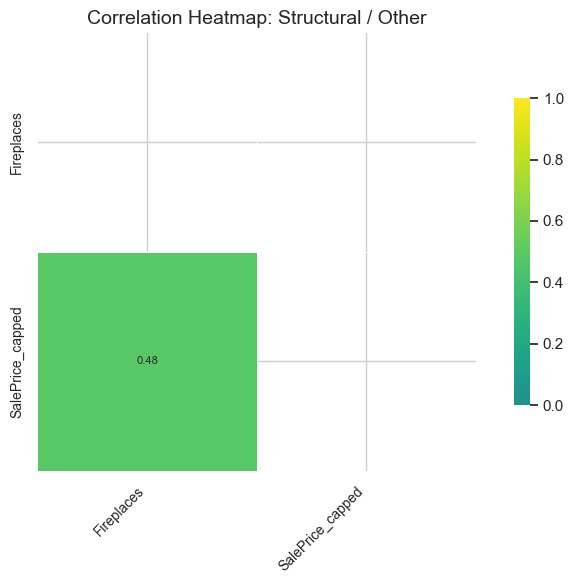

Saved heatmap: heatmaps/Structural___Other_corr_heatmap.png


In [80]:
# Heatmap for all numerical features
# use select features being shown in written report and group thematically
groups = {
    "Size & Area Features": [
        'Gr Liv Area_capped',
        '1st Flr SF',
        'Total Bsmt SF',
        'Mas Vnr Area_capped',
        'Lot Area_capped',
        'Wood Deck SF_capped',
        'total_bsmt_finished',
        'qual_living_area_interaction'
    ],
    "Bathrooms & Plumbing": [
        'Full Bath',
        'total_bathrooms'
    ],
    "Rooms & Interior Count": [
        'TotRms AbvGrd',
        'Bedroom AbvGr',
        'Kitchen AbvGr'
    ],
    "Quality / Composite Scores": [
        'avg_quality',
        'qual_living_area_interaction'
    ],
    "Age / Time-Based Features": [
        'house_age',
        'remodel_age',
        'Yr Sold'
    ],
    "Garage, Porch and External Features": [
        'Garage Area',
        'Open Porch SF_capped',
        'total_porch_area'
    ],
   
    "Structural / Other": [
        'Fireplaces'
    ]
}

target = 'SalePrice_capped'
output_dir = 'heatmaps'
os.makedirs(output_dir, exist_ok=True)
vmin = -1
vmax = 1


def plot_and_save_group_corr_heatmap(df, features, group_name, target=target, cmap='viridis', output_dir=output_dir):
    cols = features + [target]
    corr = df[cols].corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        corr,
        mask=mask,
        annot=True,
        fmt='.2f',
        cmap=cmap,
        center=0,
        vmin=0,          # Fix color range: start at 0
        vmax=1,          # End at 1 for perfect correlation
        square=True,
        linewidths=0.5,
        cbar_kws={'shrink': 0.7},
        annot_kws={"size": 8}
    )
    plt.title(f'Correlation Heatmap: {group_name}', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    safe_group_name = group_name.replace(' ', '_').replace('/', '_').replace('\\', '_')
    save_path = f"{output_dir}/{safe_group_name}_corr_heatmap.png"
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"Saved heatmap: {save_path}")

for group_name, features in groups.items():
    filtered_features = [f for f in features if f in df_new.columns]
    if filtered_features:
        print(f"Plotting and saving group: {group_name} ({len(filtered_features)} features)")
        plot_and_save_group_corr_heatmap(df_new, filtered_features, group_name)
    else:
        print(f"Skipping group: {group_name} — no features found in dataframe.")




C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2394995146.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax, palette='pastel')


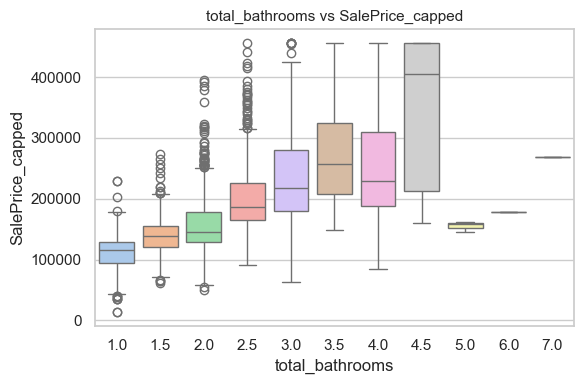

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2394995146.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax, palette='pastel')


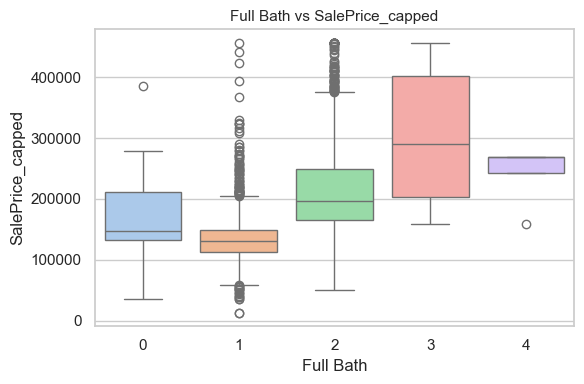

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2394995146.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax, palette='pastel')


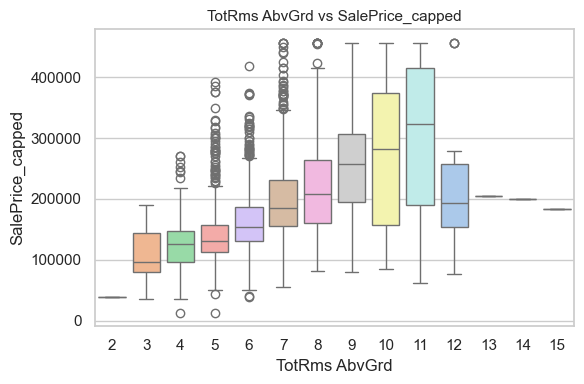

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2394995146.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax, palette='pastel')


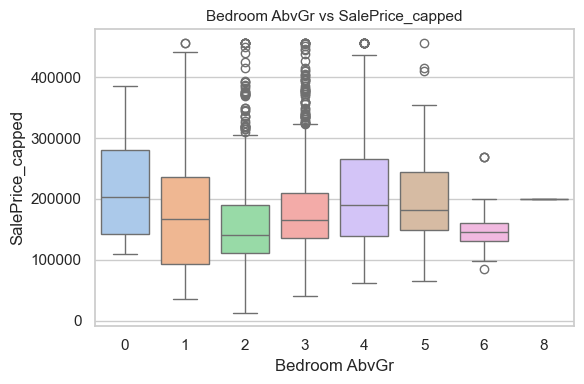

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2394995146.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax, palette='pastel')


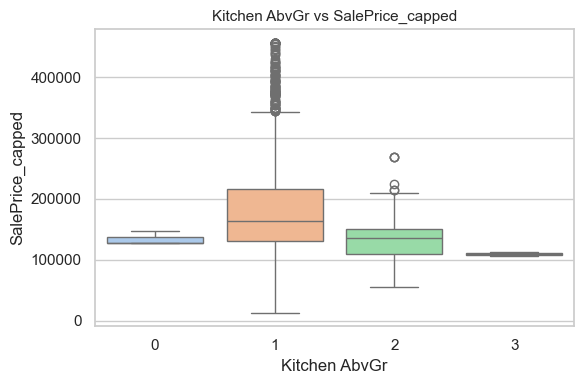

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2394995146.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax, palette='pastel')


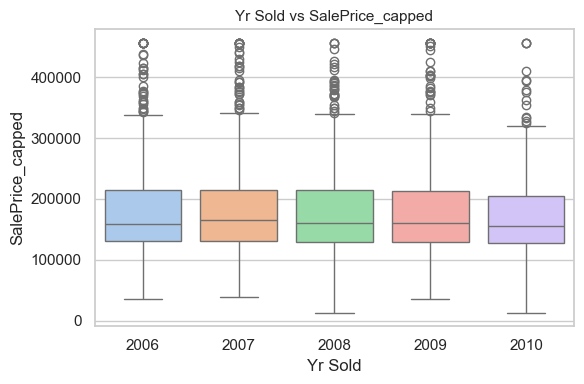

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\2394995146.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax, palette='pastel')


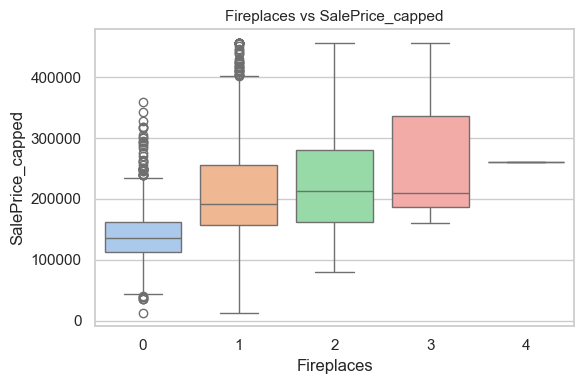

In [81]:
# As regplots for certain ordinal variables are not very informative we will replace these with boxplots 
# List of ordinal/discrete variables
boxplot_features = [
    'total_bathrooms', 'Full Bath',
    'TotRms AbvGrd', 'Bedroom AbvGr', 'Kitchen AbvGr',
    'Yr Sold', 'Fireplaces'
]


# Create output directory
output_dir = 'boxplots'
os.makedirs(output_dir, exist_ok=True)

# Loop through and create boxplots
for feature in boxplot_features:
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.boxplot(data=df_new, x=feature, y='SalePrice_capped', ax=ax, palette='pastel')
    ax.set_title(f'{feature} vs SalePrice_capped', fontsize=11)
    ax.set_xlabel(feature)
    ax.set_ylabel('SalePrice_capped')
    plt.tight_layout()

    # Save before showing
    safe_name = feature.replace('/', '_').replace('\\', '_').replace(':', '_').replace(' ', '_')
    fig.savefig(f'{output_dir}/{safe_name}_boxplot.png')
    plt.show()

#### 3.2.2 Categorical Versus Numerical

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


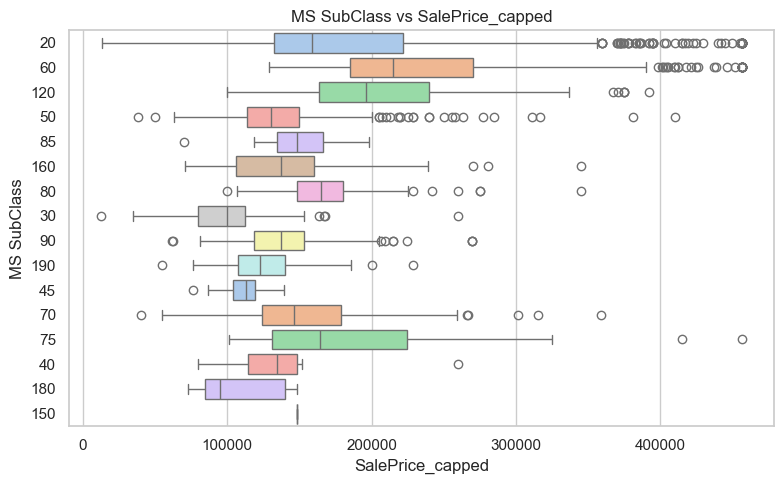

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


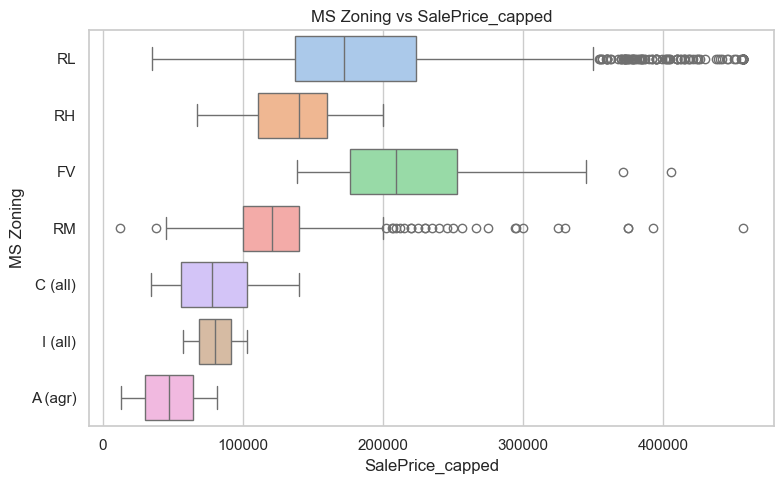

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


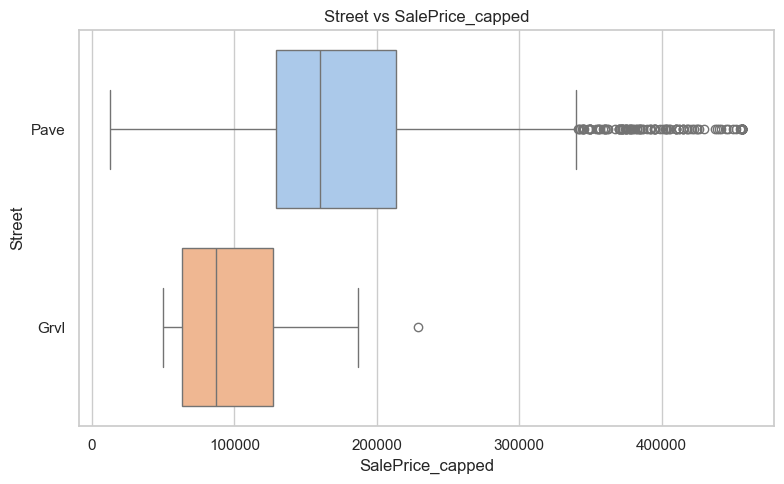

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


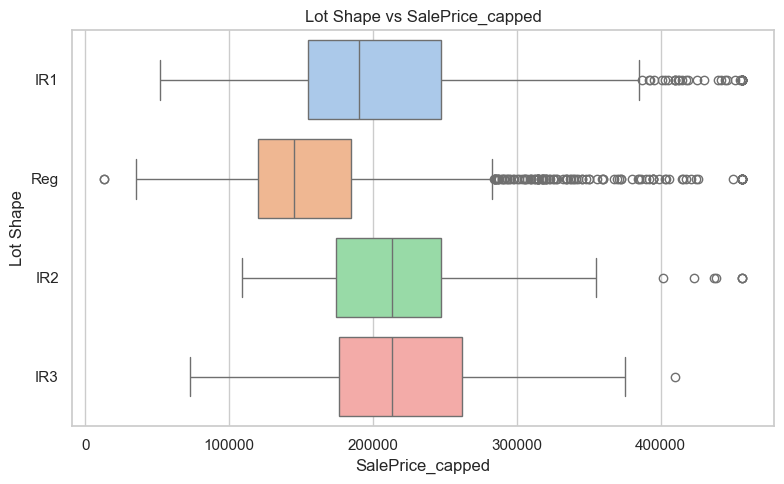

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


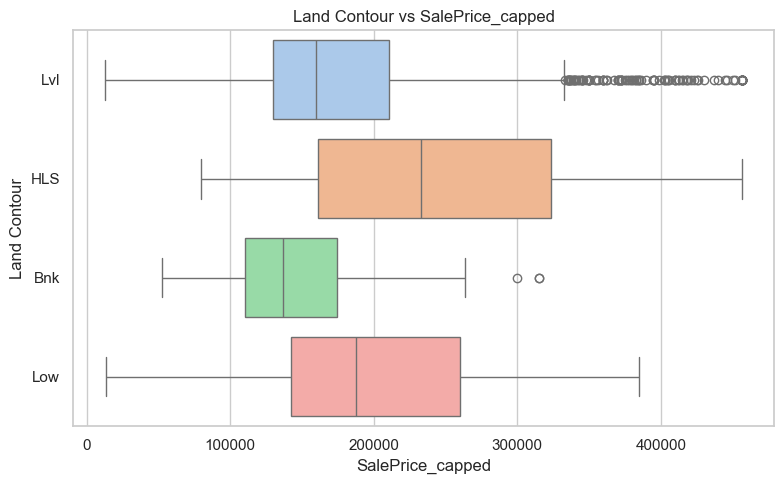

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


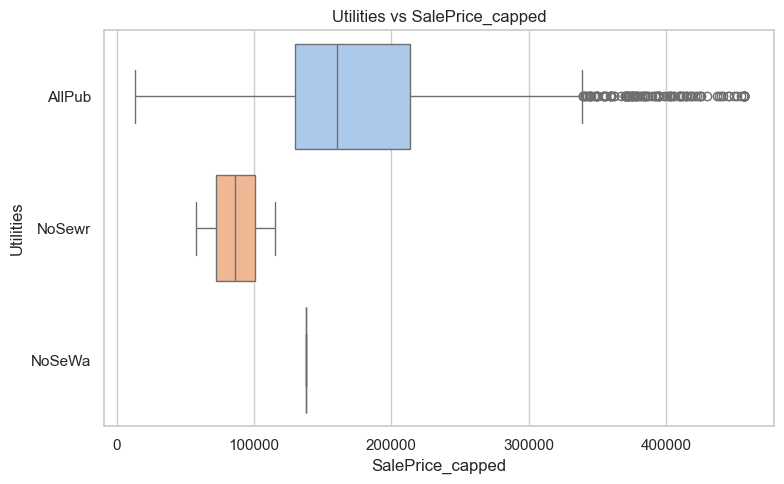

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


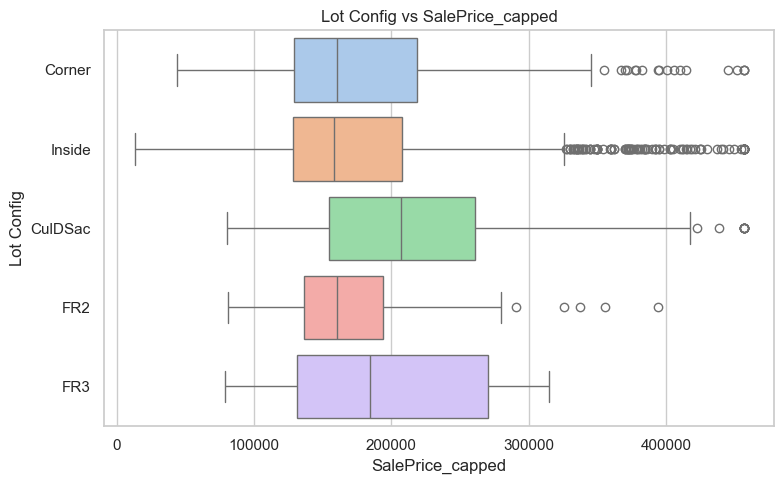

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


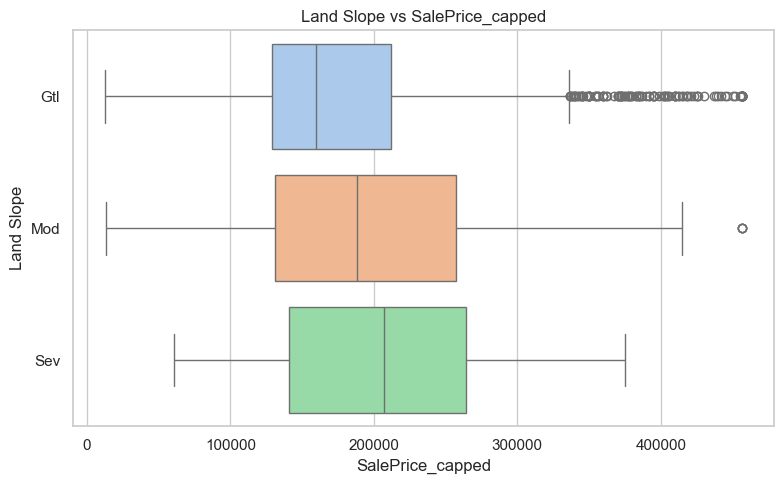

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


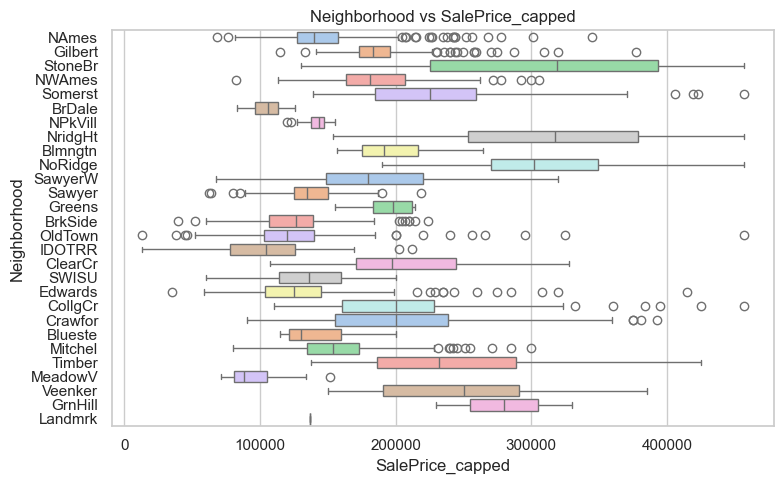

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


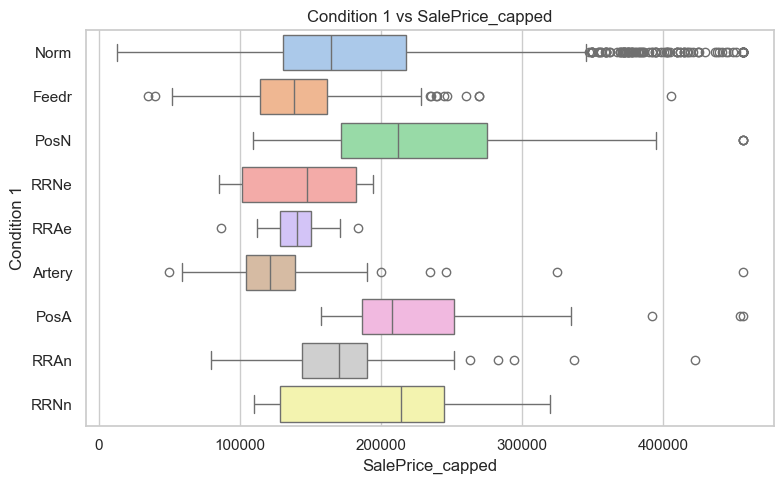

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


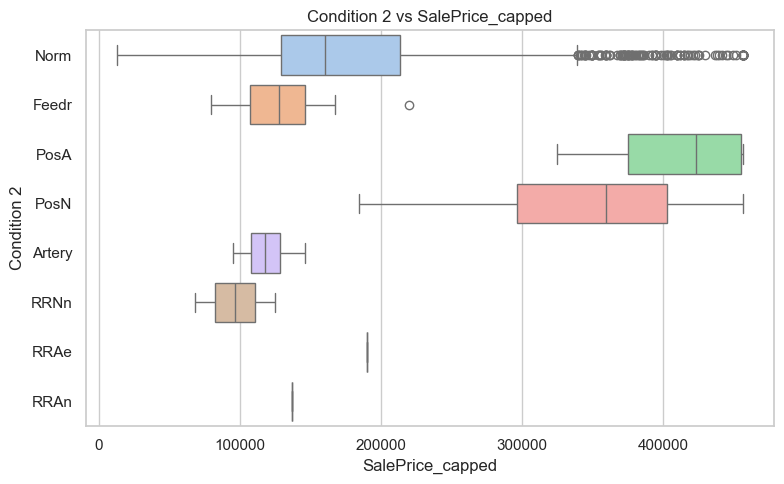

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


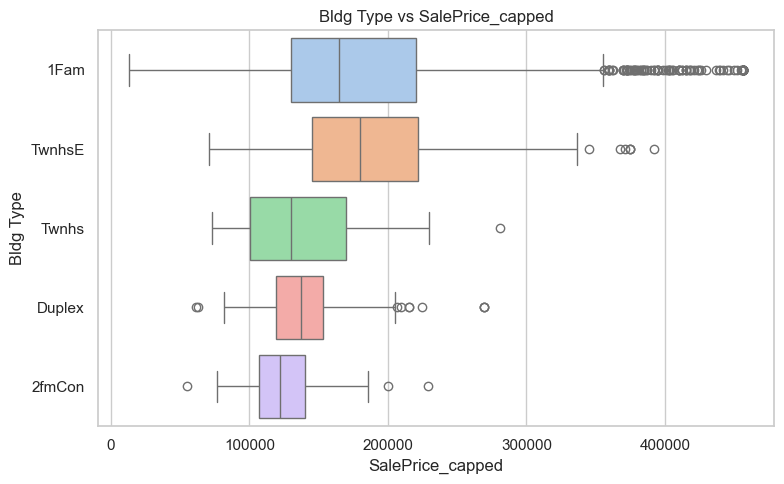

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


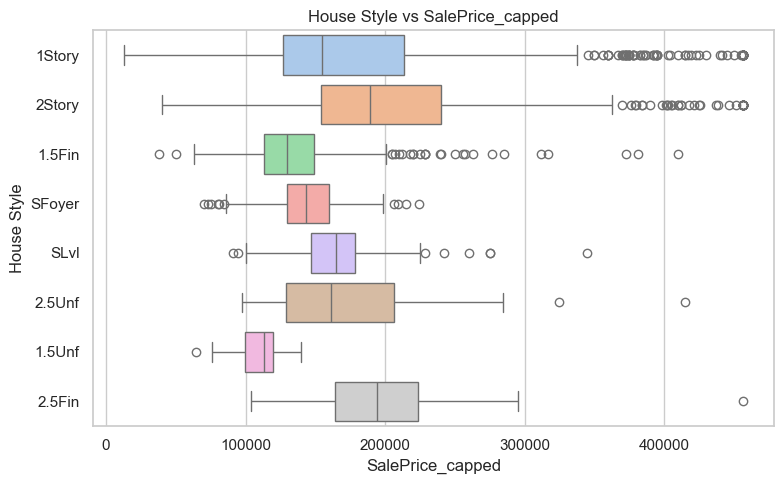

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


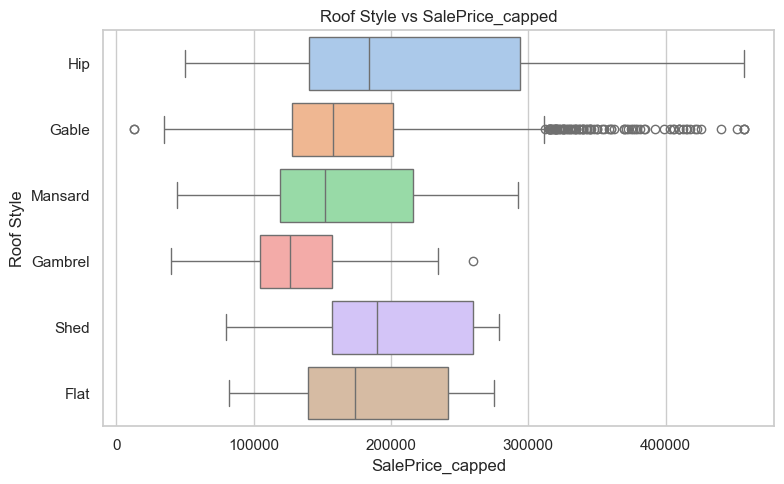

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


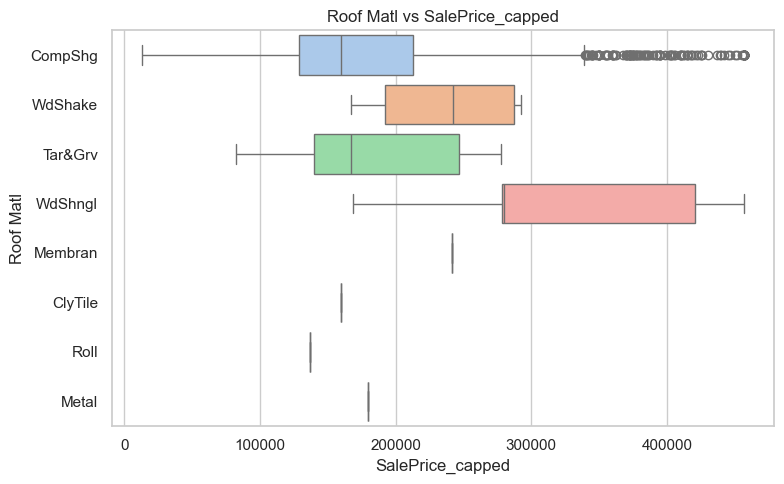

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


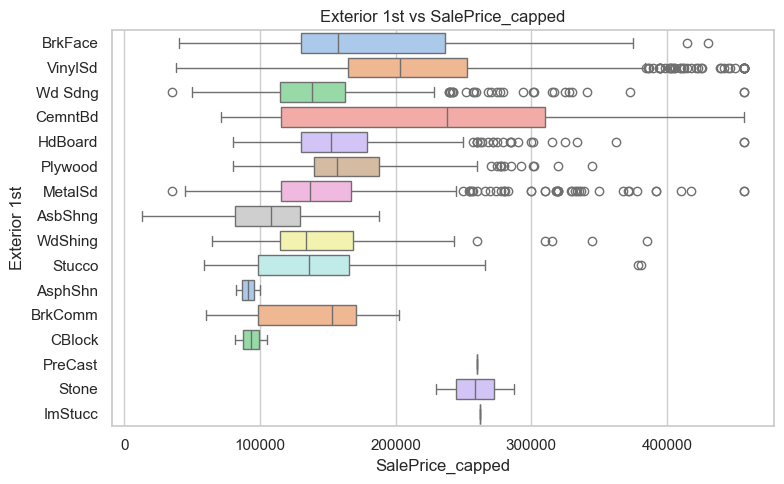

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


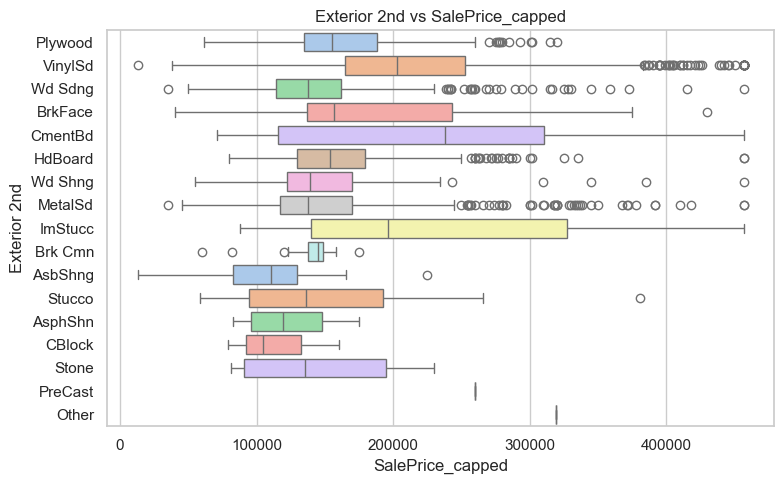

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


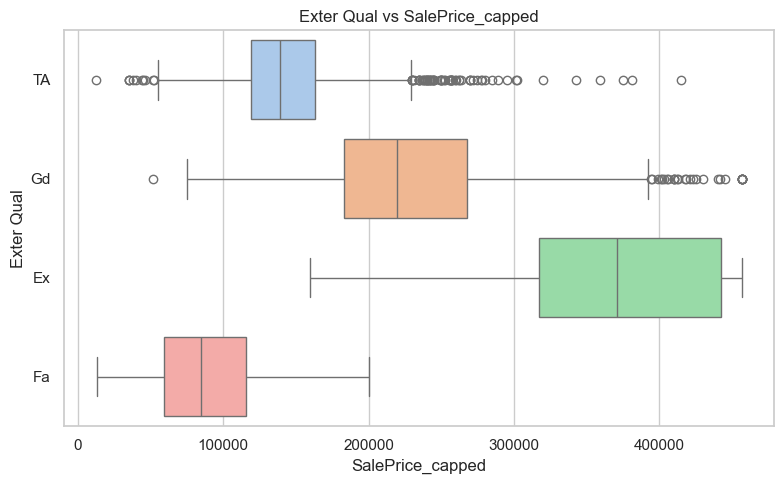

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


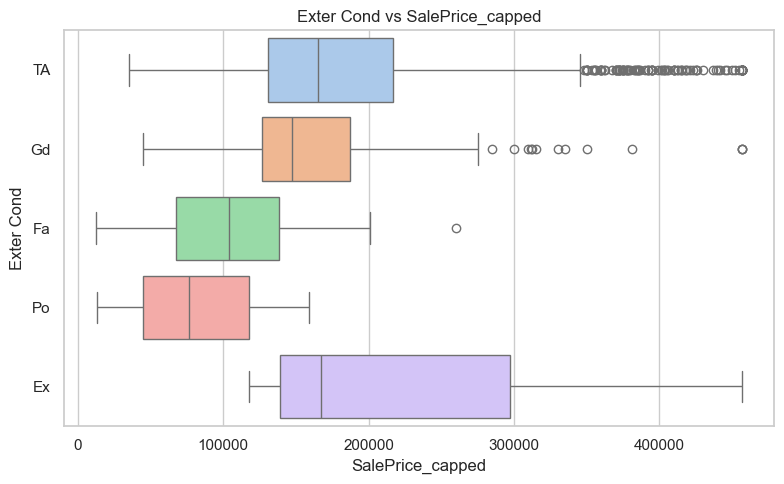

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


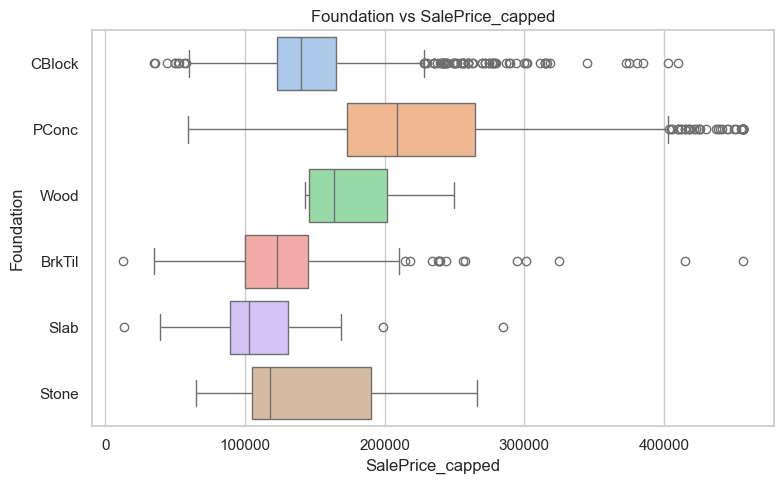

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


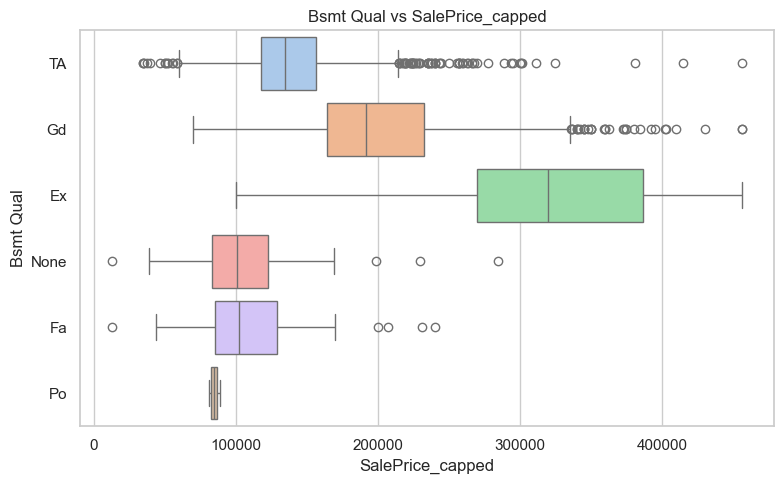

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


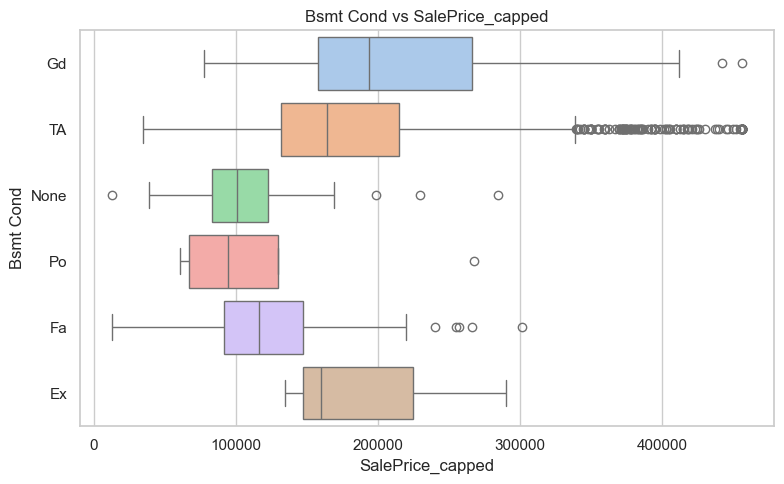

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


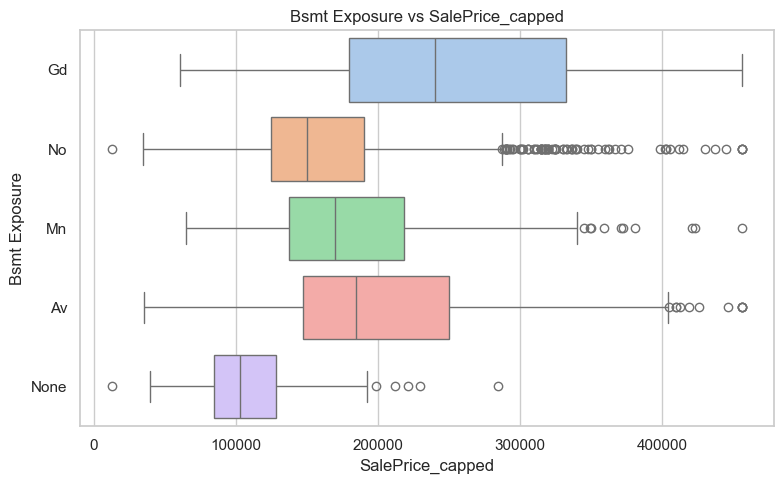

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


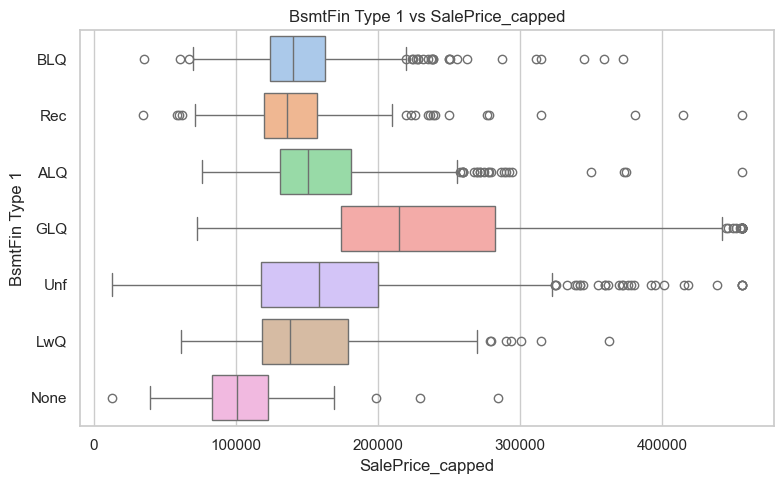

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


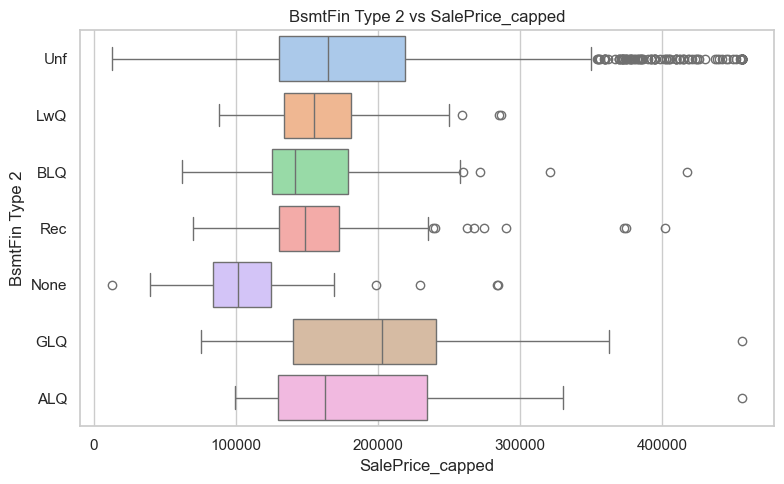

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


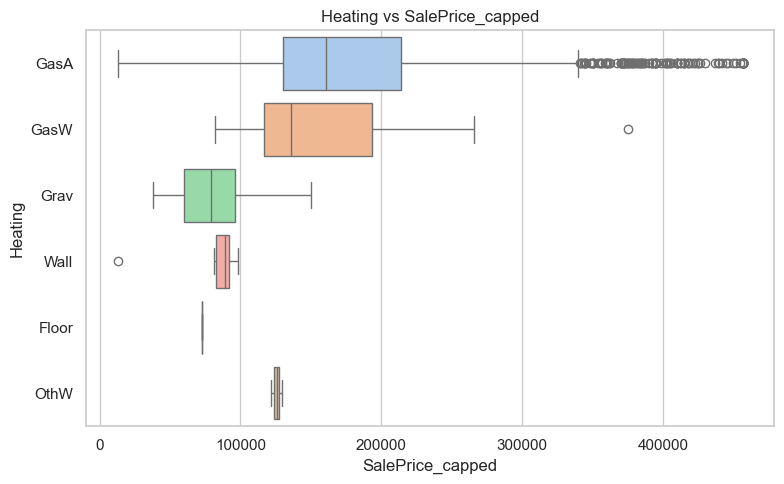

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


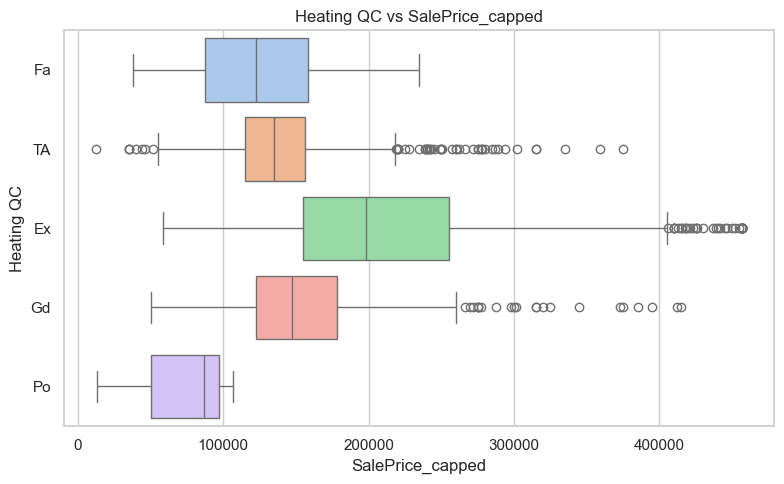

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


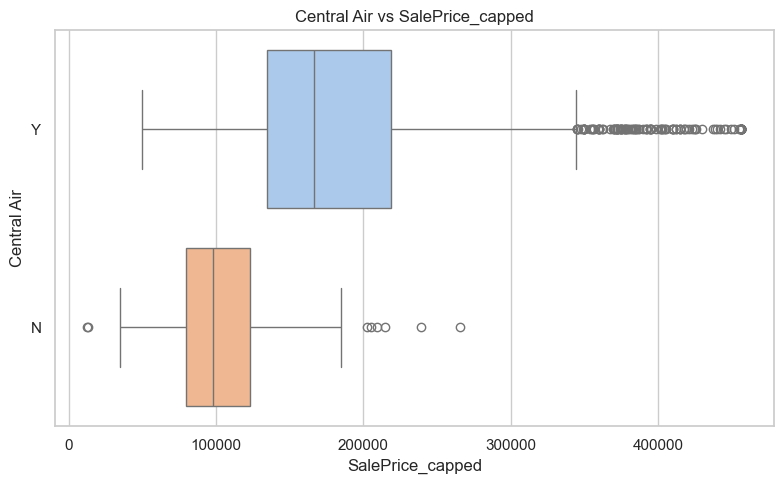

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


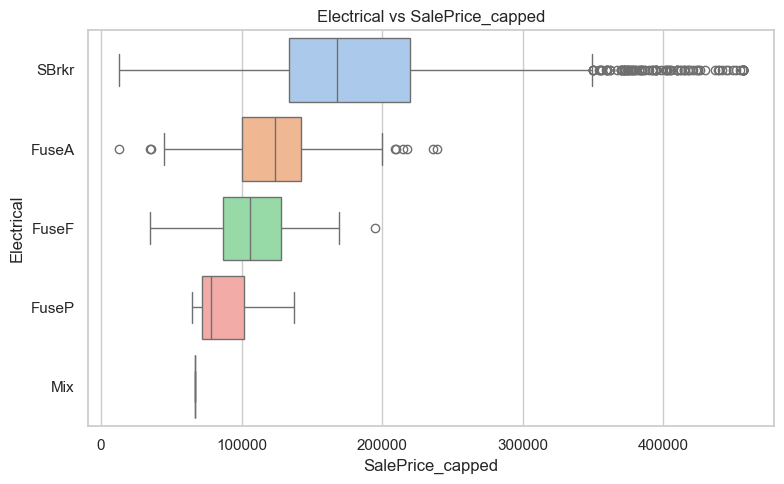

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


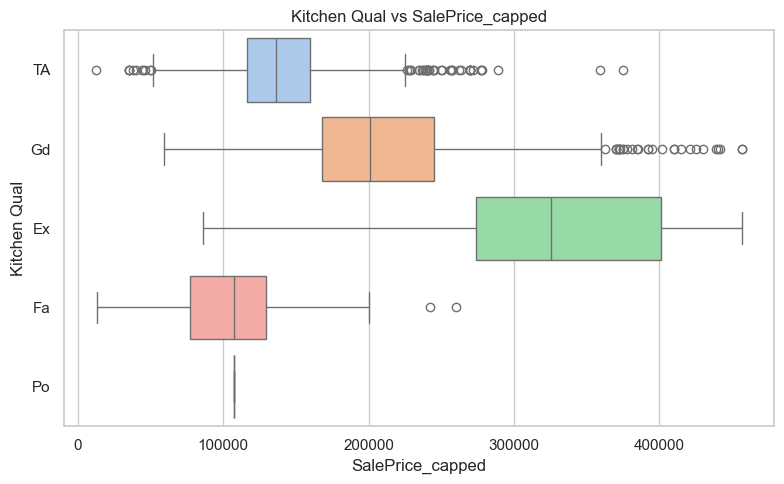

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


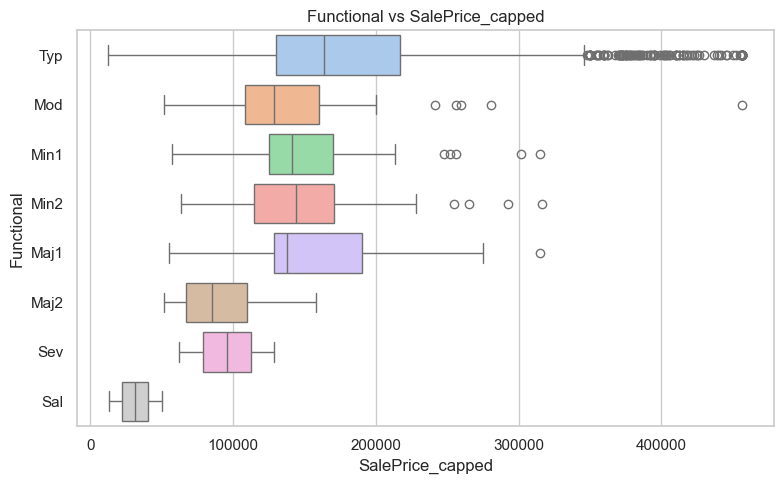

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


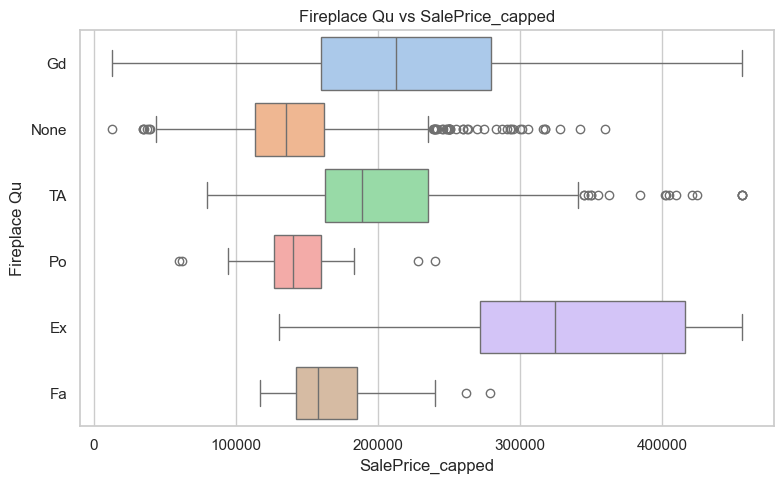

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


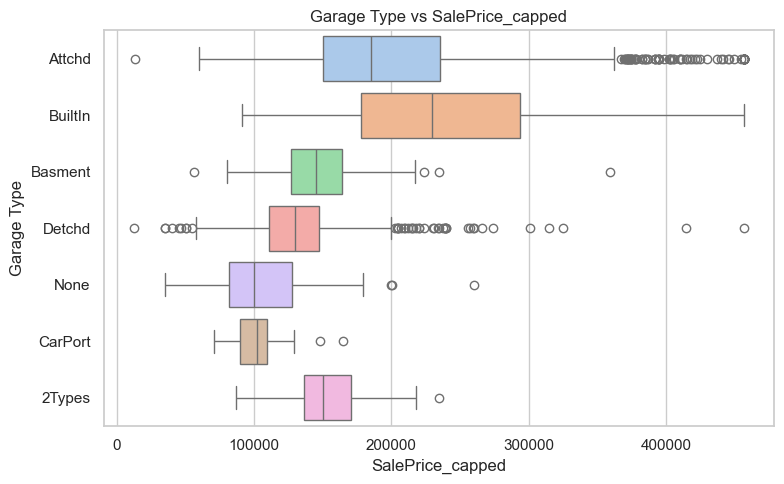

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


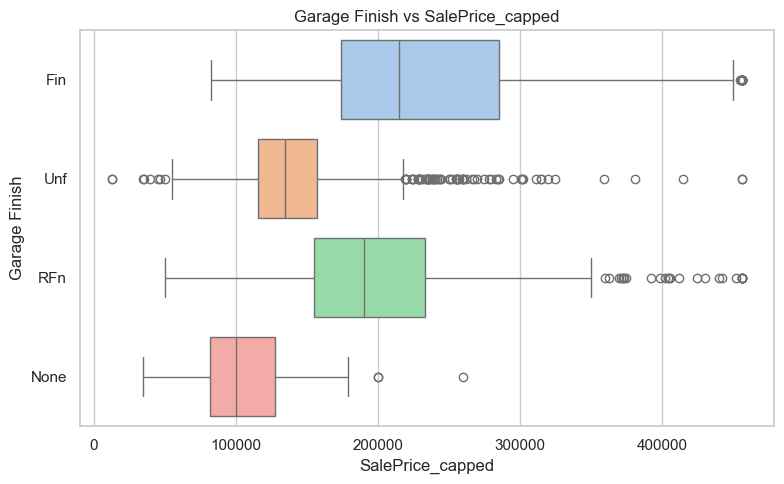

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


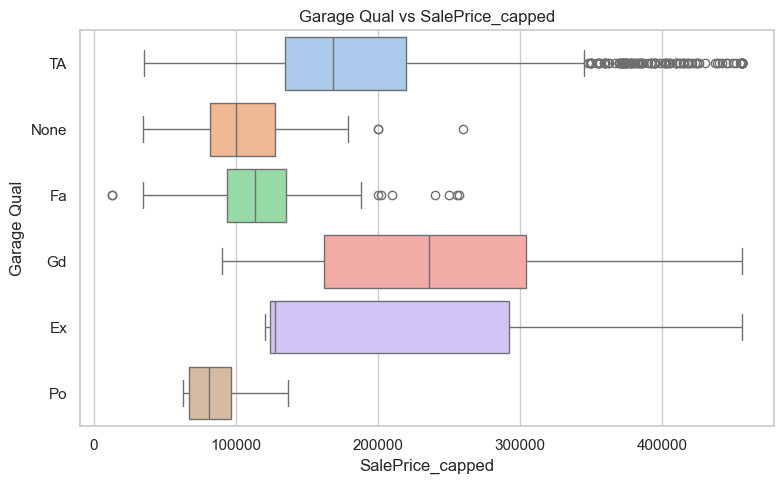

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


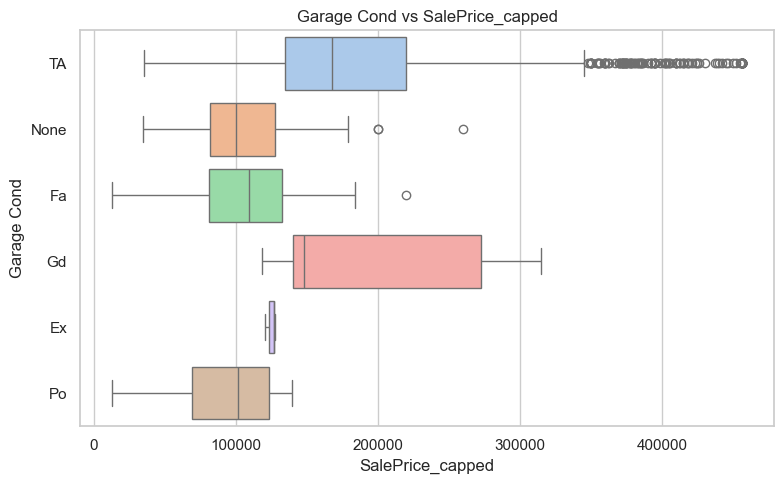

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


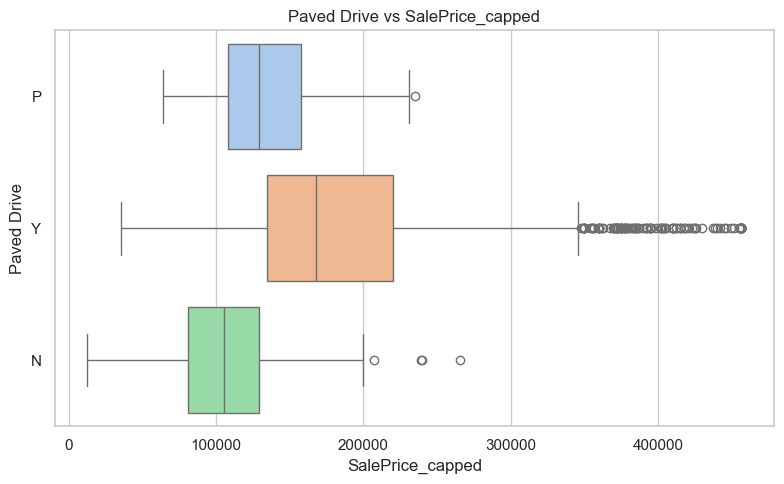

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


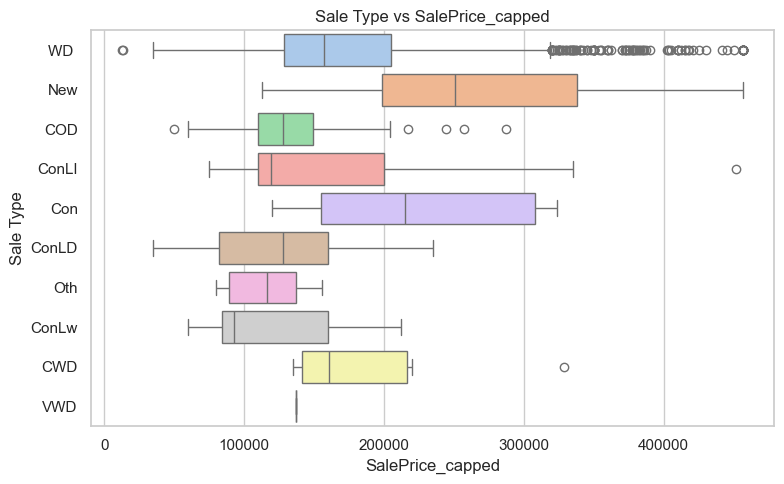

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


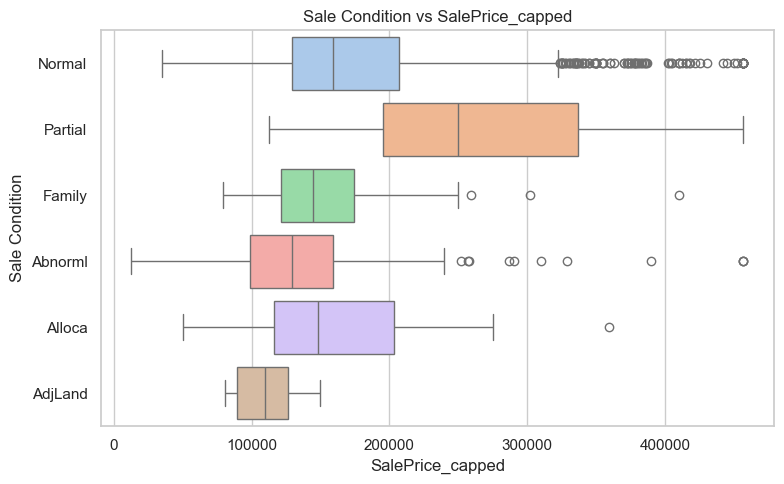

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


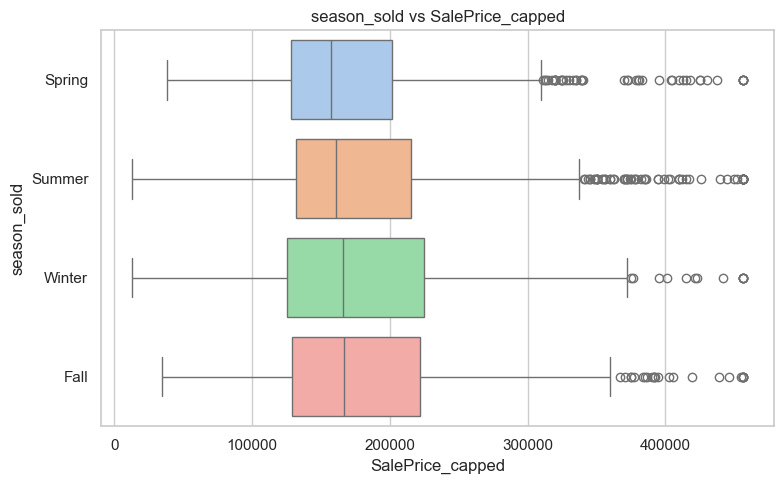

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


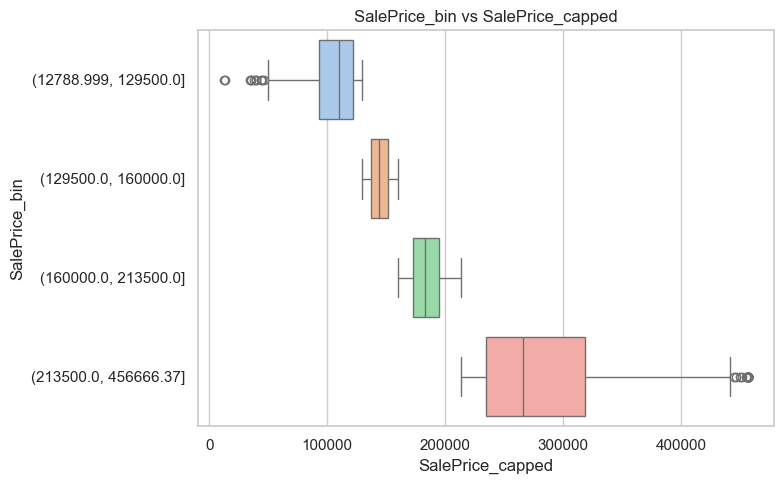

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\172651695.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


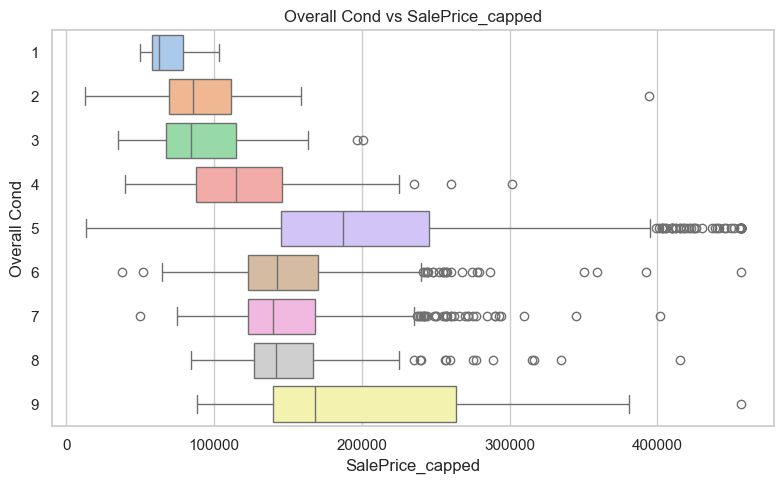

In [82]:
# Lets look at all categorical relationships with the target
cat_cols_original = [
 'MS SubClass',
 'MS Zoning',
 'Street',
 'Lot Shape',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Roof Matl',
 'Exterior 1st',
 'Exterior 2nd',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Heating',
 'Heating QC',
 'Central Air',
 'Electrical',
 'Kitchen Qual',
 'Functional',
 'Fireplace Qu',
 'Garage Type',
 'Garage Finish',
 'Garage Qual',
 'Garage Cond',
 'Paved Drive',
 'Sale Type',
 'Sale Condition',
 'season_sold',
 'SalePrice_bin',
 'Overall Cond'
]

# Create output directory
output_dir = 'catfeats_v_target'
os.makedirs(output_dir, exist_ok=True)

# Loop through and create boxplots
for feature in cat_cols_original:
    plt.figure(figsize=(8, 5))
    sns.boxplot(
        data=df_new,
        x='SalePrice_capped',
        y=feature,
        palette='pastel',
        orient='h'
    )
    plt.title(f'{feature} vs SalePrice_capped', fontsize=12)
    plt.xlabel('SalePrice_capped')
    plt.ylabel(feature)
    plt.tight_layout()

    # Save before showing
    safe_name = feature.replace('/', '_').replace('\\', '_').replace(':', '_').replace(' ', '_')
    plt.savefig(f'{output_dir}/{safe_name}_boxplot.png')
    plt.show()
    plt.close()  # Prevent overlap in subsequent plots

#### 3.3 Multivariate Analysis

#### 3.3.1. Correlation Matrix

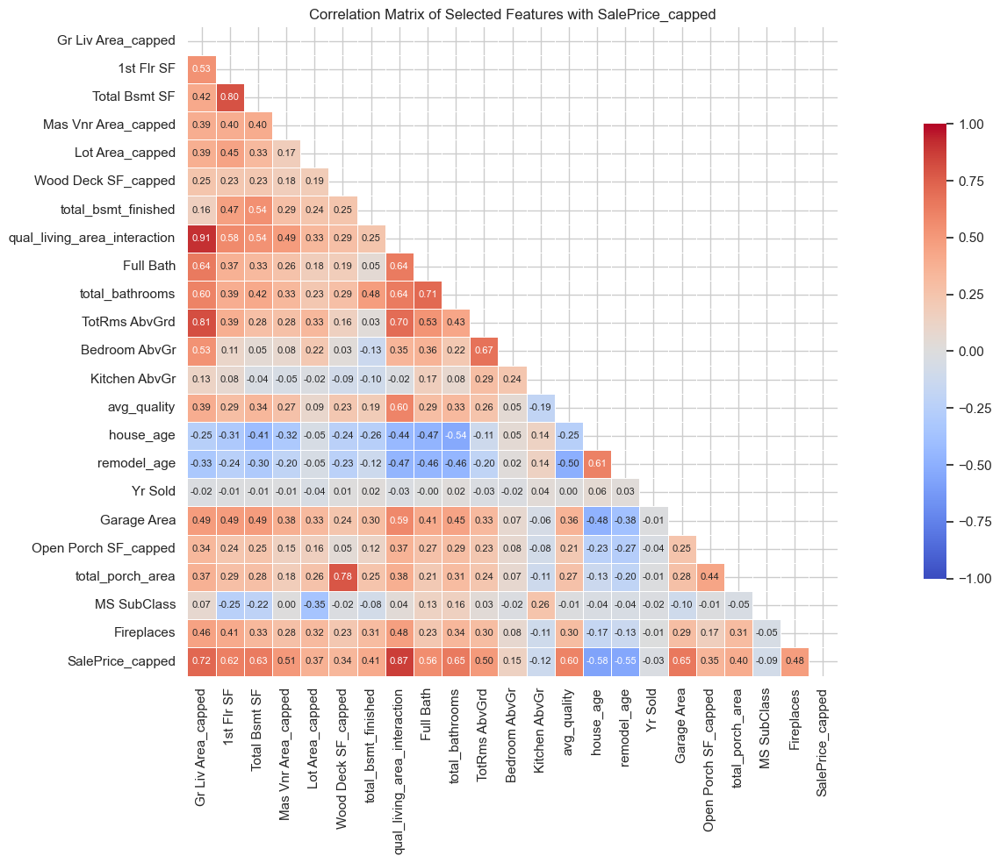

In [83]:
#Lets use our numerical features used in the written report
report_num_feats = [
    "Gr Liv Area_capped",
    "1st Flr SF",
    "Total Bsmt SF",
    "Mas Vnr Area_capped",
    "Lot Area_capped",
    "Wood Deck SF_capped",
    "total_bsmt_finished",
    "qual_living_area_interaction",
    "Full Bath",
    "total_bathrooms",
    "TotRms AbvGrd",
    "Bedroom AbvGr",
    "Kitchen AbvGr",
    "avg_quality",
    "house_age",
    "remodel_age",
    "Yr Sold",
    "Garage Area",
    "Open Porch SF_capped",
    "total_porch_area",
    "MS SubClass",
    "Fireplaces"
]

features = report_num_feats + ["SalePrice_capped"]

corr_matrix = df_new[features].corr()

# Create mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(20, 10))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    mask=mask,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.7},
    annot_kws={"size": 8}  # Smaller font size for annotation numbers
)
plt.title('Correlation Matrix of Selected Features with SalePrice_capped')
plt.tight_layout()
plt.savefig('multivariate_analysis/selected_feature_correlation_matrix_masked.png')
plt.show()

In [84]:
#list correlations greater than .78
# Get the absolute values of correlations
abs_corr = corr_matrix.abs()

# We'll create an empty list to store tuples of (feature1, feature2, correlation)
corr_pairs = []

# Iterate over the upper triangle (to avoid duplicates and self-correlation)
for i in range(len(abs_corr.columns)):
    for j in range(i+1, len(abs_corr.columns)):
        corr_value = abs_corr.iloc[i, j]
        if corr_value >= 0.78:
            feature1 = abs_corr.columns[i]
            feature2 = abs_corr.columns[j]
            # Use the original correlation value with sign
            original_corr = corr_matrix.loc[feature1, feature2]
            corr_pairs.append((feature1, feature2, original_corr))

# Sort by absolute correlation descending
corr_pairs_sorted = sorted(corr_pairs, key=lambda x: abs(x[2]), reverse=True)

# Print nicely
for f1, f2, val in corr_pairs_sorted:
    print(f"{f1} and {f2}: {val:.3f}")

# If you want the list for further use:
# corr_pairs_sorted


Gr Liv Area_capped and qual_living_area_interaction: 0.912
qual_living_area_interaction and SalePrice_capped: 0.870
Gr Liv Area_capped and TotRms AbvGrd: 0.813
1st Flr SF and Total Bsmt SF: 0.800
Wood Deck SF_capped and total_porch_area: 0.782


In [85]:
#list correlations between .6 and .77
# Get the absolute values of correlations
abs_corr = corr_matrix.abs()

# We'll create an empty list to store tuples of (feature1, feature2, correlation)
corr_pairs = []

# Iterate over the upper triangle (to avoid duplicates and self-correlation)
for i in range(len(abs_corr.columns)):
    for j in range(i+1, len(abs_corr.columns)):
        corr_value = abs_corr.iloc[i, j]
        if 0.6 <= corr_value < 0.78:
            feature1 = abs_corr.columns[i]
            feature2 = abs_corr.columns[j]
            # Use the original correlation value with sign
            original_corr = corr_matrix.loc[feature1, feature2]
            corr_pairs.append((feature1, feature2, original_corr))

# Sort by absolute correlation descending
corr_pairs_sorted = sorted(corr_pairs, key=lambda x: abs(x[2]), reverse=True)

# Print nicely
for f1, f2, val in corr_pairs_sorted:
    print(f"{f1} and {f2}: {val:.3f}")

# If you want the list for further use:
# corr_pairs_sorted


Gr Liv Area_capped and SalePrice_capped: 0.722
Full Bath and total_bathrooms: 0.713
qual_living_area_interaction and TotRms AbvGrd: 0.698
TotRms AbvGrd and Bedroom AbvGr: 0.673
Garage Area and SalePrice_capped: 0.653
total_bathrooms and SalePrice_capped: 0.646
Gr Liv Area_capped and Full Bath: 0.641
qual_living_area_interaction and Full Bath: 0.637
qual_living_area_interaction and total_bathrooms: 0.636
Total Bsmt SF and SalePrice_capped: 0.634
1st Flr SF and SalePrice_capped: 0.623
house_age and remodel_age: 0.614
Gr Liv Area_capped and total_bathrooms: 0.603
avg_quality and SalePrice_capped: 0.603
qual_living_area_interaction and avg_quality: 0.601


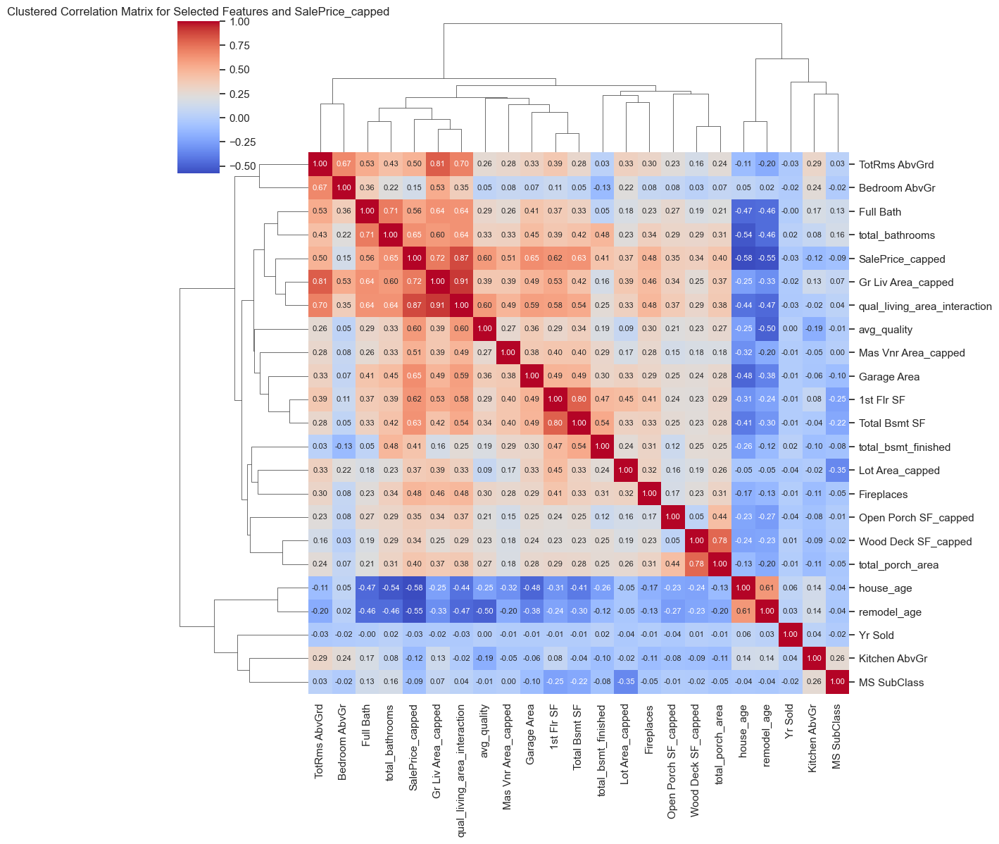

In [86]:
# Clustermap
# Clean original correlation matrix by dropping all-NaN rows and columns
corr_matrix_clean = corr_matrix.dropna(axis=0, how='all').dropna(axis=1, how='all')

# Plot clustered heatmap of the cleaned top 15 correlation matrix
sns.clustermap(corr_matrix_clean, annot=True, fmt=".2f", cmap='coolwarm', figsize=(12, 12), annot_kws={"size":8})
plt.title('Clustered Correlation Matrix for Selected Features and SalePrice_capped')
plt.show()


#### 3.3.2 Grouped Boxplots (categorical vs numerical)

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


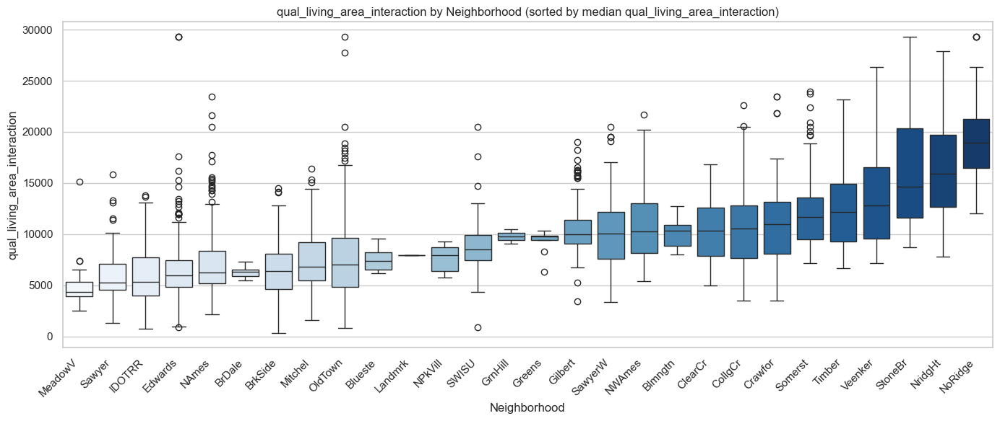

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


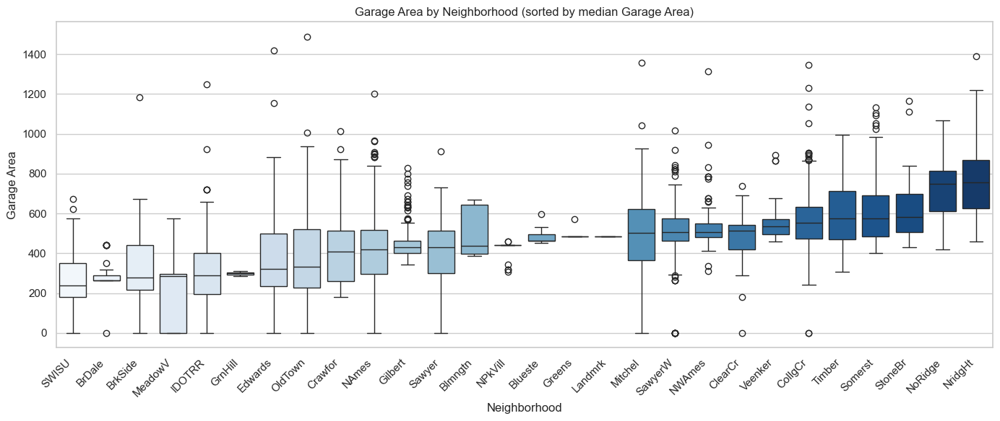

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


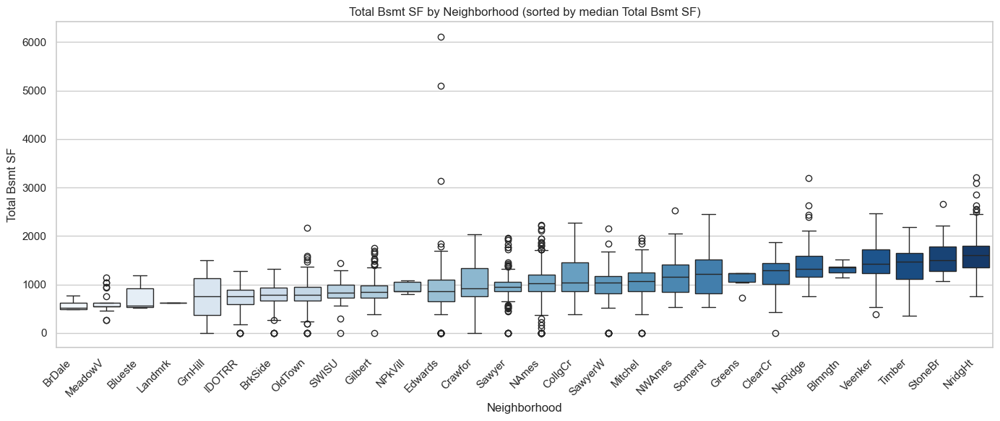

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


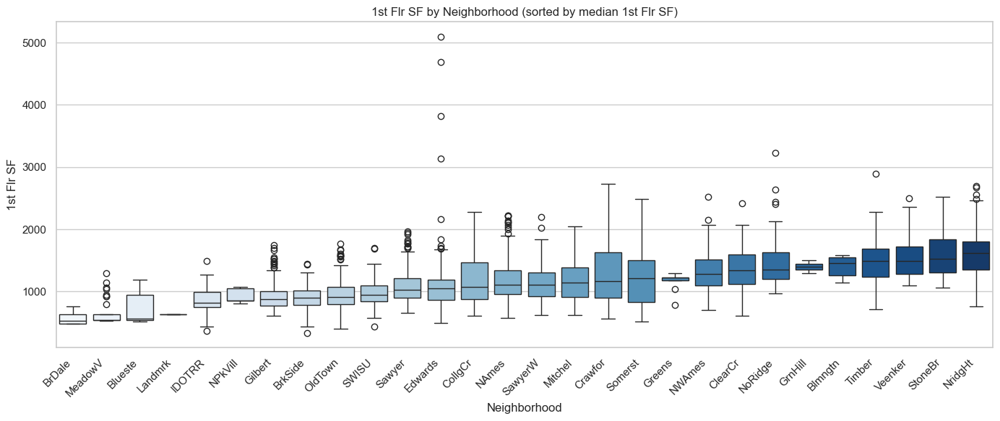

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


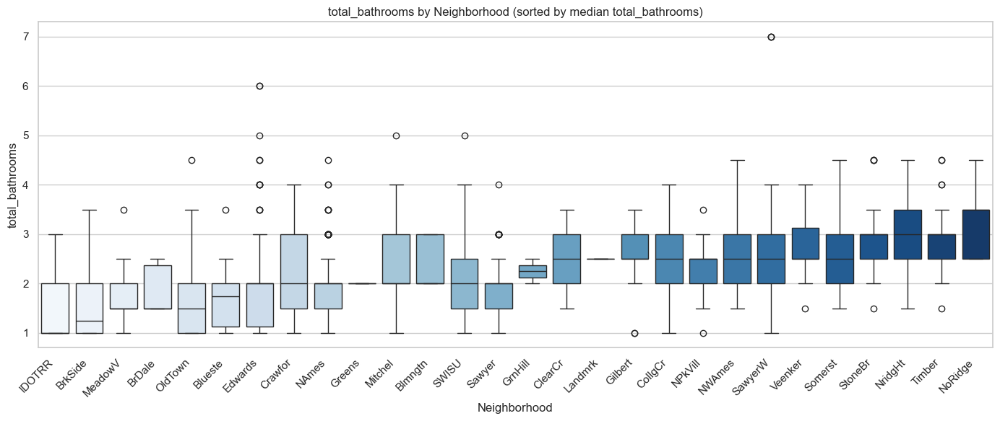

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


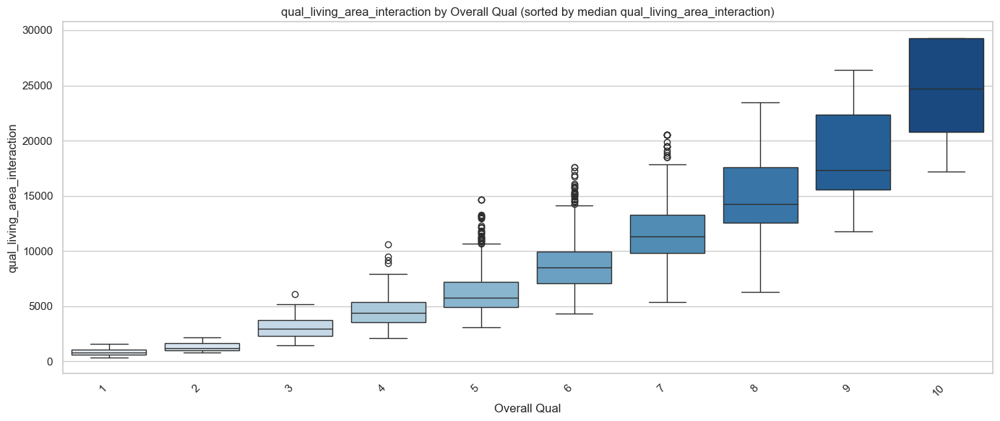

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


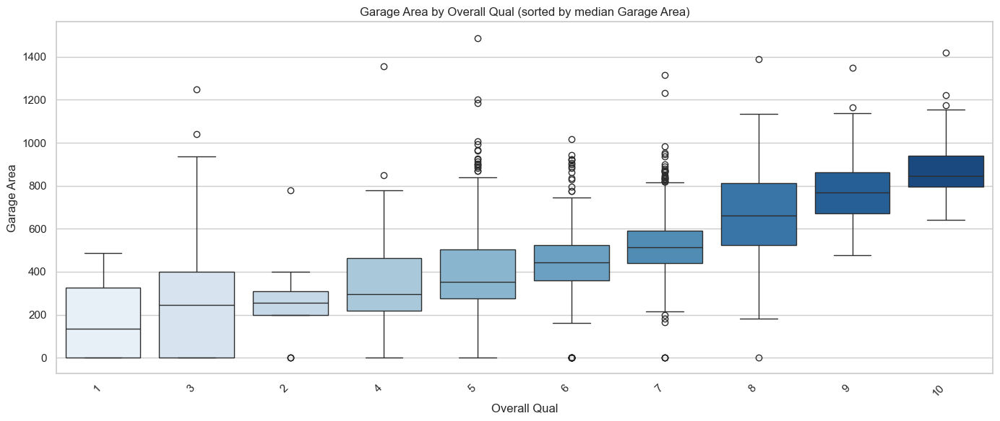

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


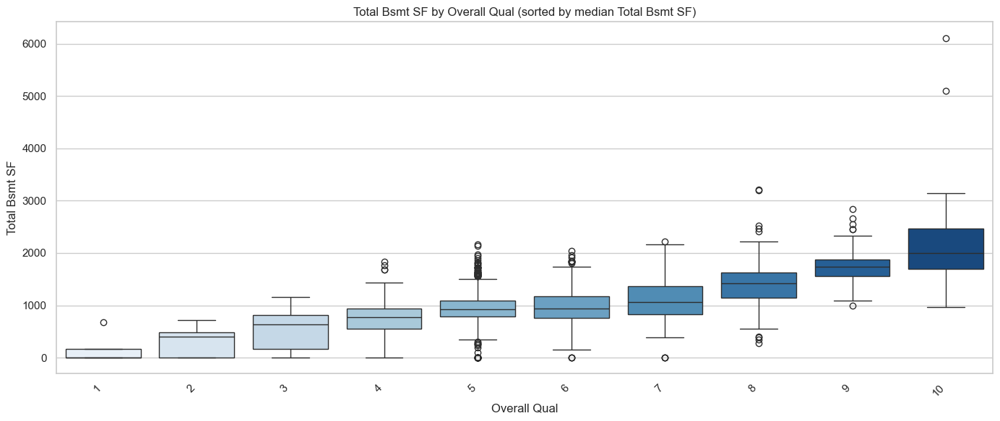

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


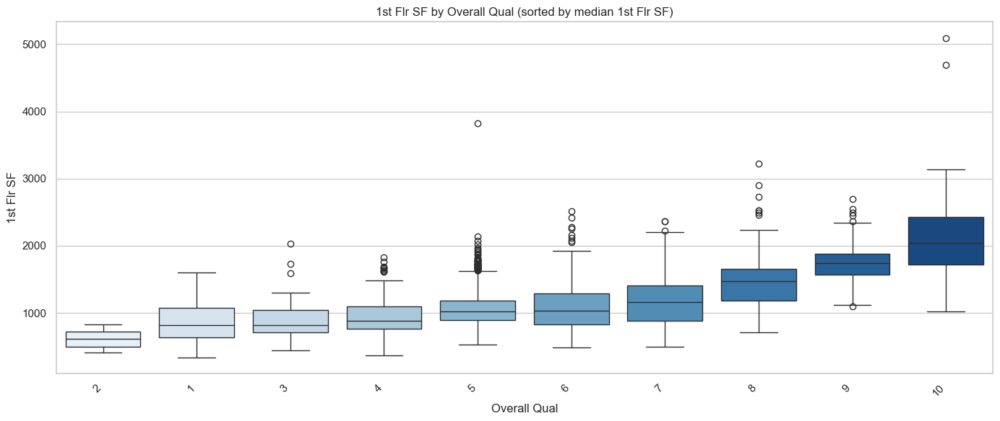

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


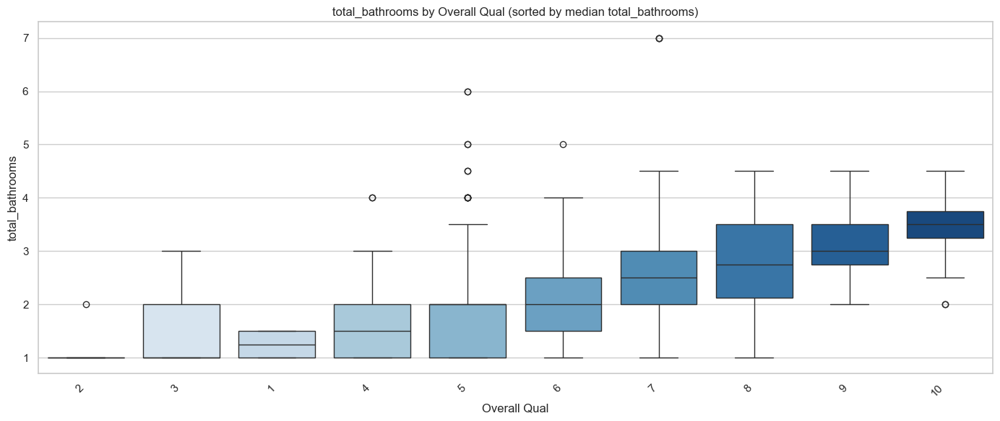

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


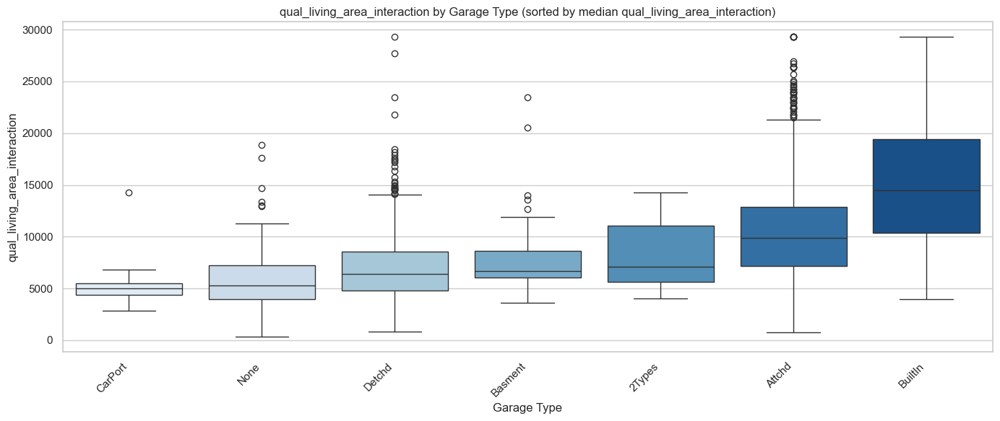

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


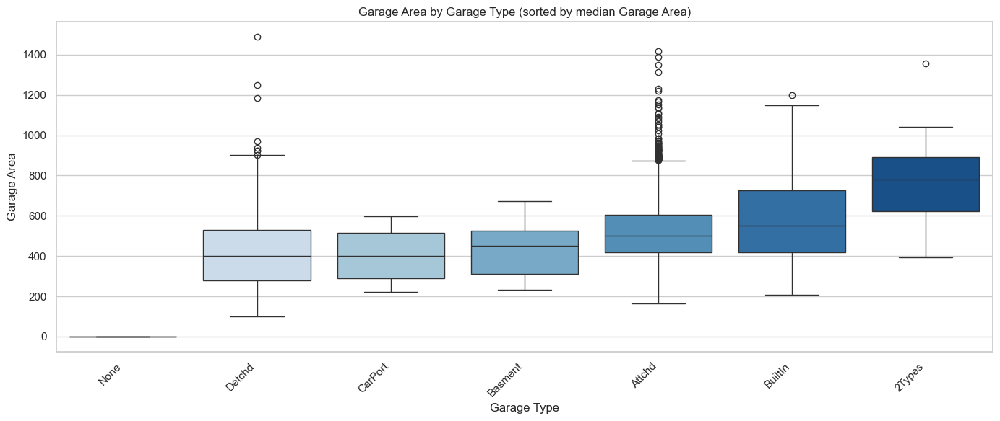

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


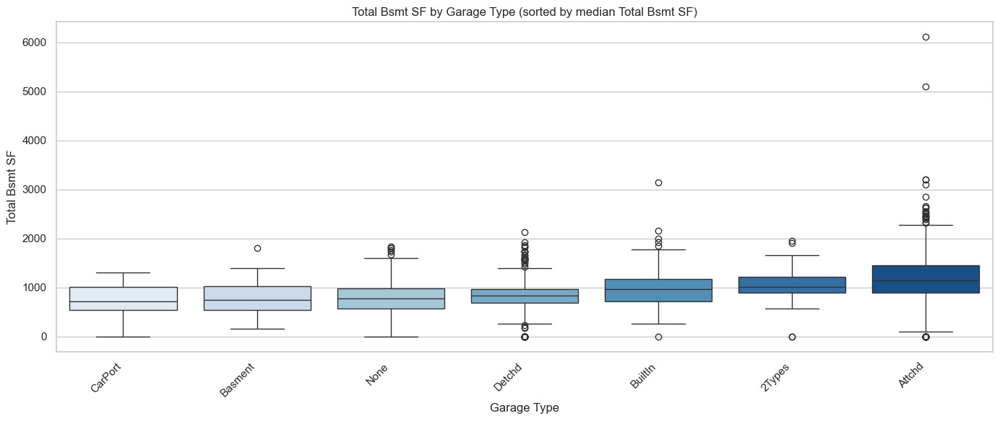

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


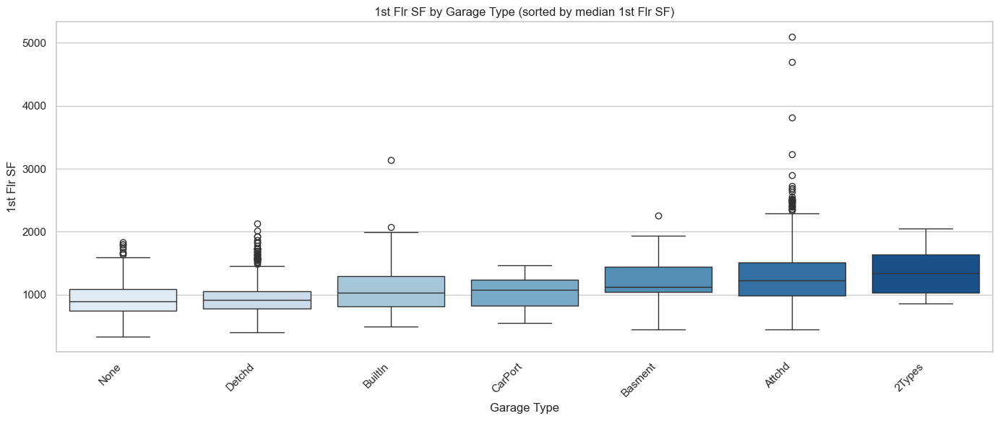

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


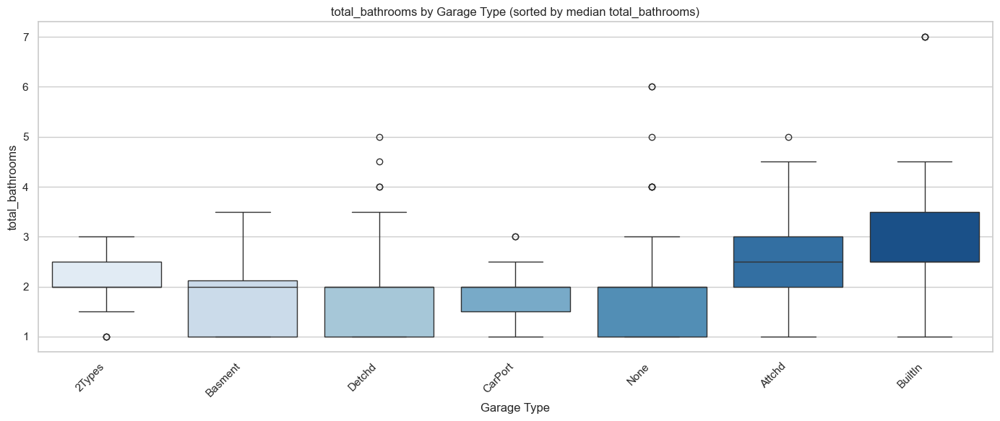

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


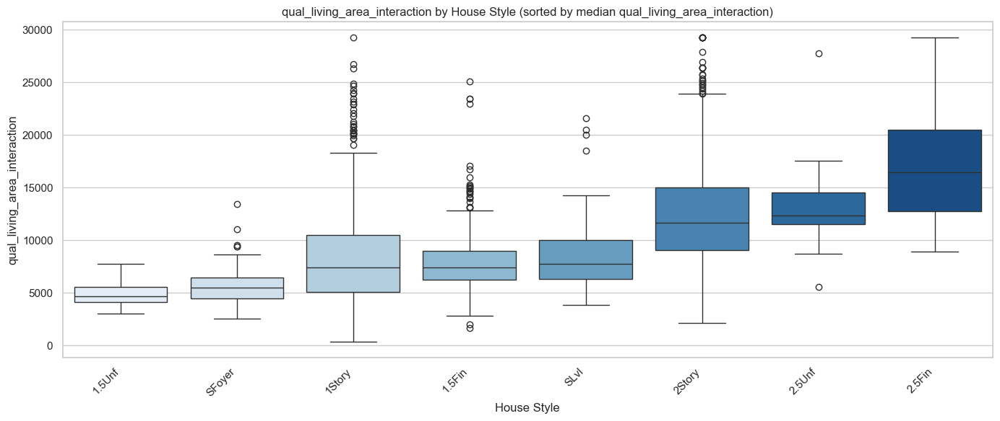

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


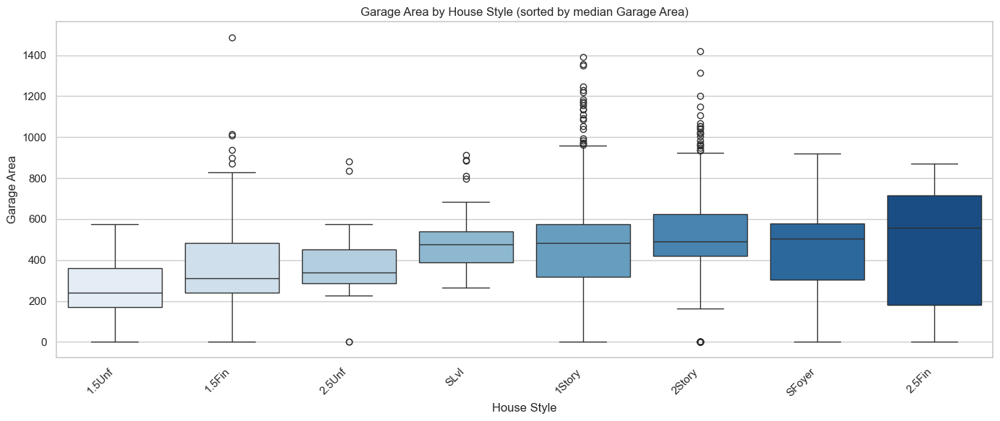

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


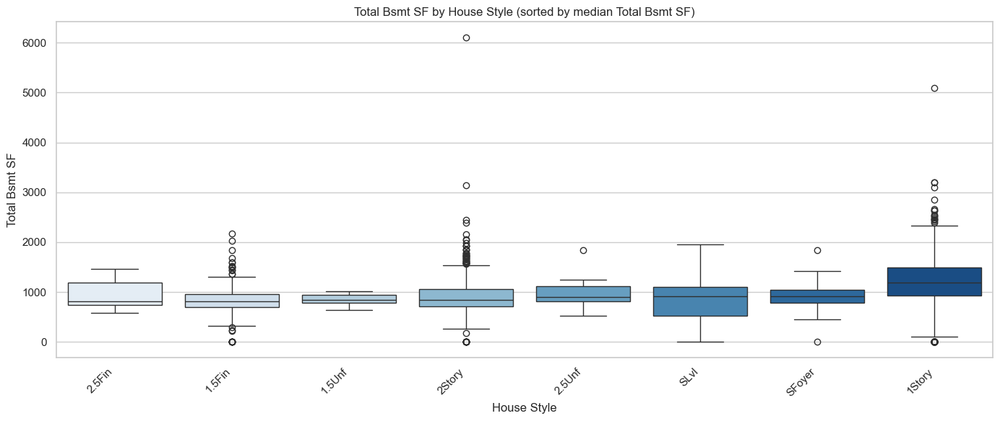

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


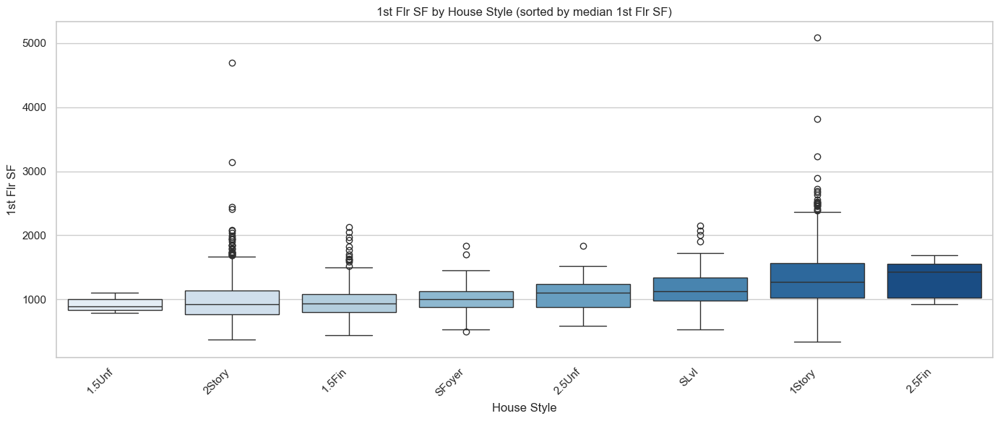

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


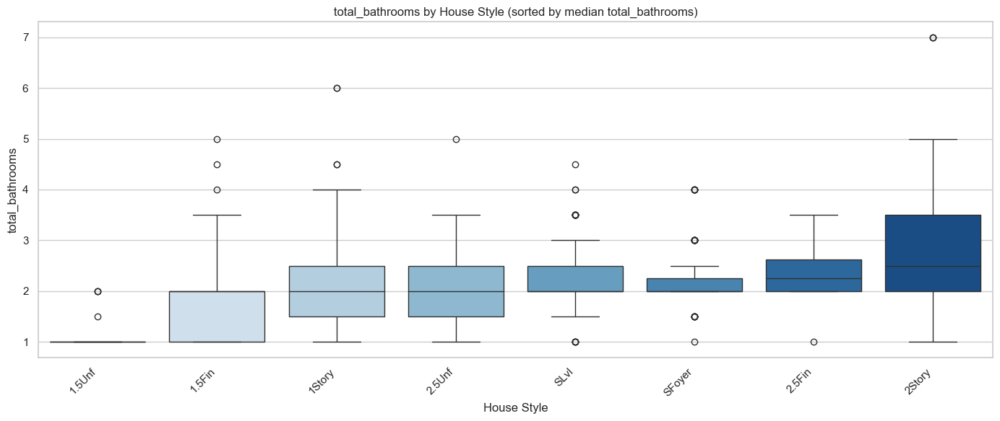

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


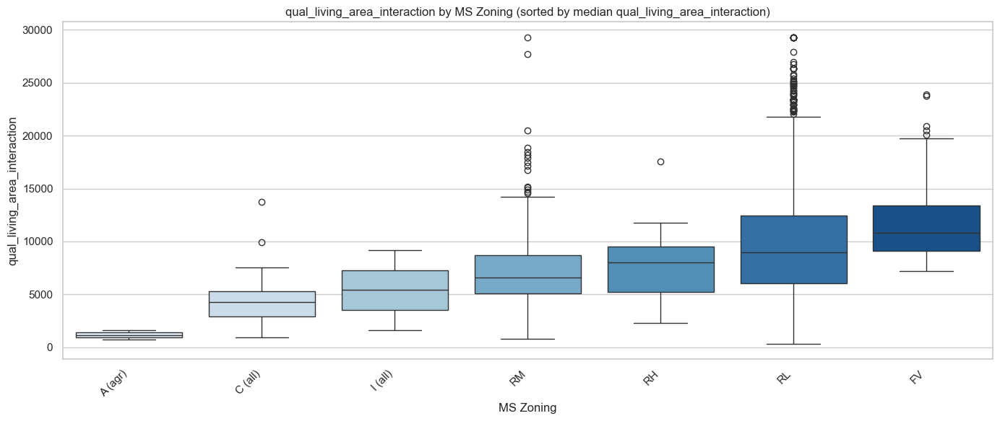

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


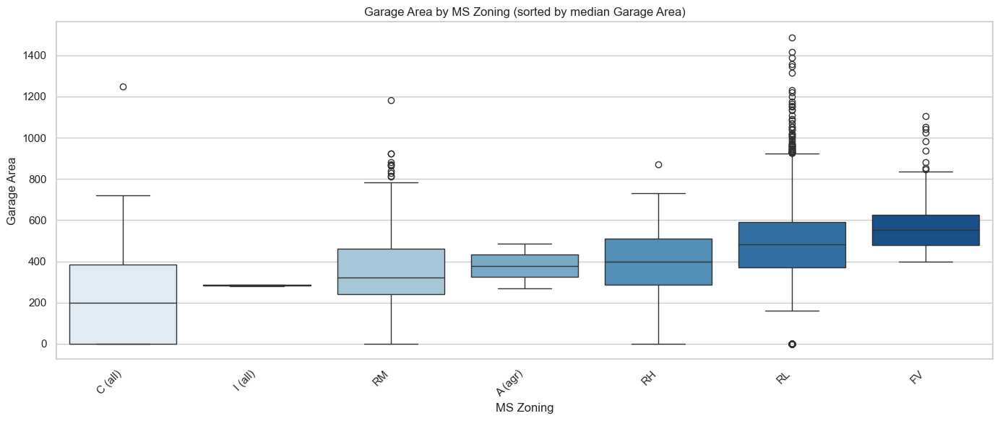

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


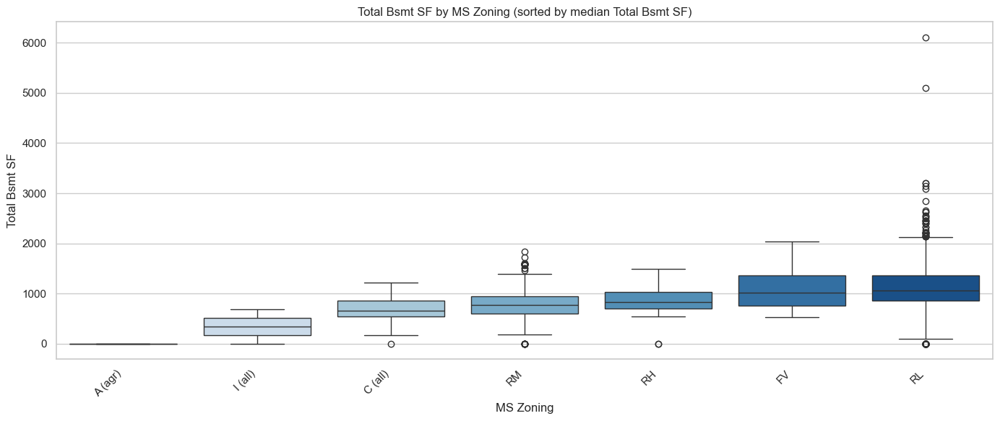

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


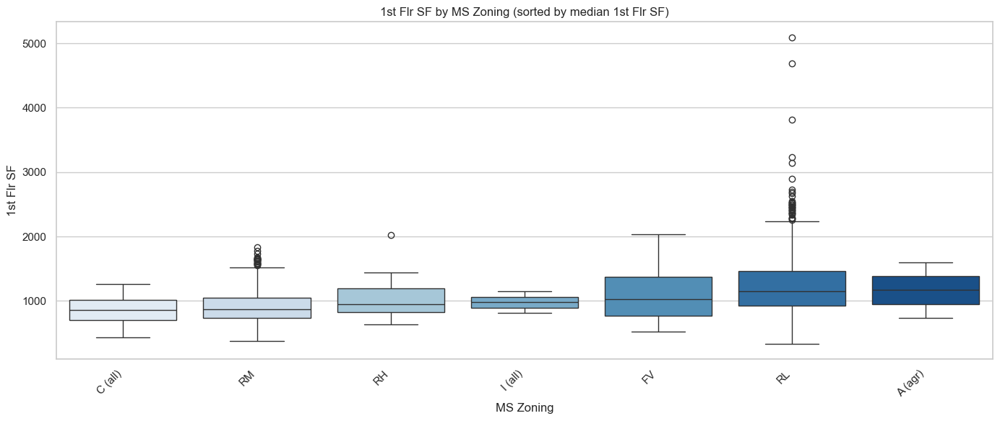

C:\Users\rebec\AppData\Local\Temp\ipykernel_144892\1242940023.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')


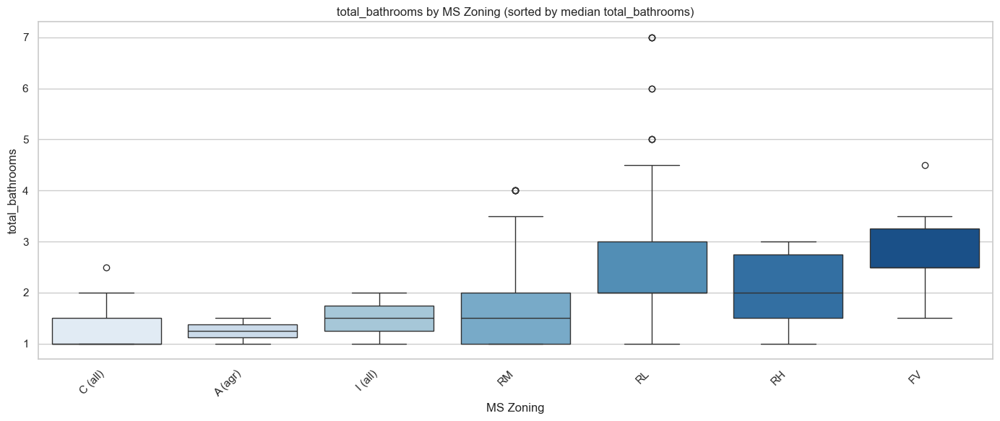

In [87]:
# Categorical and numerical features
cat_feats = ['Neighborhood', 'Overall Qual', 'Garage Type', 'House Style', 'MS Zoning']
num_feats = [
    'qual_living_area_interaction', 
    'Garage Area', 
    'Total Bsmt SF',
    '1st Flr SF',
    'total_bathrooms'
]

# Folder to save plots
save_dir = 'multivariate/grouped_boxplots_sorted'
os.makedirs(save_dir, exist_ok=True)

# Loop through all combinations
for cat in cat_feats:
    for num in num_feats:
        plt.figure(figsize=(14, 6))

        # Sort categories by median of numerical feature
        order = df_new.groupby(cat)[num].median().sort_values().index

        # Plot
        sns.boxplot(data=df_new, x=cat, y=num, order=order, palette='Blues')

        plt.title(f'{num} by {cat} (sorted by median {num})')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()

        # Show inline
       

        # Save figure
        filename = f"{save_dir}/{num}_by_{cat}_sorted.png"
        plt.savefig(filename)
        plt.show()


In [89]:
df_new.groupby("Garage Type")["total_bathrooms"].median()

Garage Type
2Types     2.0
Attchd     2.5
Basment    2.0
BuiltIn    2.5
CarPort    2.0
Detchd     2.0
None       2.0
Name: total_bathrooms, dtype: float64

In [90]:
df_new.groupby("House Style")["total_bathrooms"].median()

House Style
1.5Fin    2.00
1.5Unf    1.00
1Story    2.00
2.5Fin    2.25
2.5Unf    2.00
2Story    2.50
SFoyer    2.00
SLvl      2.00
Name: total_bathrooms, dtype: float64

In [91]:
df_new.groupby("MS Zoning")["total_bathrooms"].median()

MS Zoning
A (agr)    1.25
C (all)    1.00
FV         2.50
I (all)    1.50
RH         2.00
RL         2.00
RM         1.50
Name: total_bathrooms, dtype: float64

## 4. Hypothesis Testing

Group qual_living_area_interaction into categories and compare sale prices.  


Null hypothesis (H0): The mean sale price is the same across all groups (Low, Medium, High).
  
Alternative hypothesis (HA): At least one group has a different mean sale price.

ANOVA F-statistic: 1823.7631339278748, p-value: 0.0
Reject the null hypothesis: There is a statistically significant difference in mean sale price between at least two groups of qual_living_area_interaction.


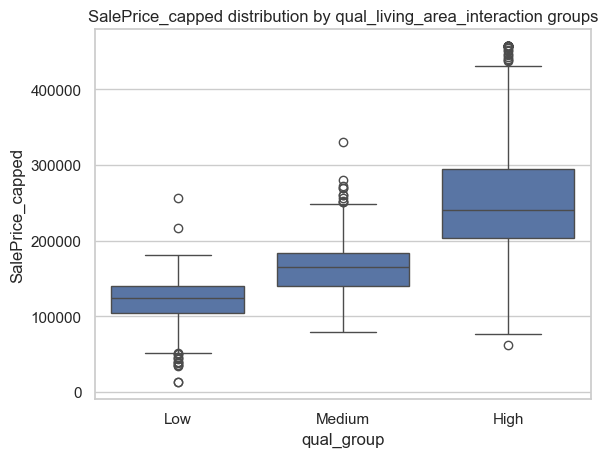

In [95]:
from scipy import stats
# Step 1: Create groups
df_new['qual_group'] = pd.qcut(df_new['qual_living_area_interaction'], q=3, labels=['Low', 'Medium', 'High'])

# Step 2: Visualize
sns.boxplot(x='qual_group', y='SalePrice_capped', data=df_new)
plt.title('SalePrice_capped distribution by qual_living_area_interaction groups')


# Step 3: Extract sale prices per group
low_prices = df_new.loc[df_new['qual_group'] == 'Low', 'SalePrice_capped']
med_prices = df_new.loc[df_new['qual_group'] == 'Medium', 'SalePrice_capped']
high_prices = df_new.loc[df_new['qual_group'] == 'High', 'SalePrice_capped']

# Step 4: ANOVA test
f_stat, p_val = stats.f_oneway(low_prices, med_prices, high_prices)
print(f"ANOVA F-statistic: {f_stat}, p-value: {p_val}")

alpha = 0.05
if p_val < alpha:
    print("Reject the null hypothesis: There is a statistically significant difference in mean sale price between at least two groups of qual_living_area_interaction.")
else:
    print("Fail to reject the null hypothesis: No significant difference in sale prices across groups.")

plt.show()


In [96]:
# Add a Kruskal–Wallis test to the hypothesis due to right-skewed distributions
from scipy.stats import kruskal

kw_stat, kw_pval = kruskal(low_prices, med_prices, high_prices)
print(f"Kruskal-Wallis statistic: {kw_stat}, p-value: {kw_pval}")

Kruskal-Wallis statistic: 1882.6097720526104, p-value: 0.0
